# Taxi Demand Prediction - New York City

## Business/Real World Problem
For a given location in New York City, our goal is to <b>predict the number of pickups in that given location</b>. Some location require more taxis at a particular time than other locations owing to the presence schools, hospitals, offices etc. The prediction result can be transferred to the taxi drivers via Smartphone app, and they can subsequently move to the locations where predicted pickups are high.

## Objectives & Constraints
<b>Objectives:</b> Our objective is to predict the number of pickups as accurately as possible for each region in a 10min interval. We will break up the whole New York City into regions. Now, the 10min interval is chosen because in NYC one can commute 1 mile in approximately 10 minutes given the traffic is normal at that particular time.<br><br>
<b>Constraints:</b>
* <b>Latency:</b> Given a location and current time of a taxi driver, as a taxi driver, he/she excepts to get the predicted pickups in his/her region and the adjoining regions in few seconds. Hence, there is a medium latency requirement.<br><br>

* <b>Interpretability:</b> As long as taxi driver gets good prediction result, he/she is not be much interested in the interpretability of the result. He/she is not much interested in why he/she is getting this result. Hence, there is a no interpretability required.<br><br>

* <b>Relative Errors:</b> Mean Absolute Percentage Error will be the relative error we will consider. Let say the predicted pickups for a particular location are 100, but actual pickups are 102, the percentage error will be 2% and Absolute error is 2. The taxi driver will be more interested in the percentage error than the absolute error. Let say in some region the predicted pickups are 250, and if taxi driver knows that the relative error is 10% then he/she will consider the predicted result to be in the range of 225 to 275, which is considerable.<br><br>

<b>Our goal is to reduce the percentage error is low as possible.</b> 

# 1. Data Information
<b>Source of Data:</b> Data can be downloaded from here:<br>
http://www.nyc.gov/html/tlc/html/about/trip_record_data.shtml.<br> 
Here, we have used Jan- 2015 and Jan- 2016 data.

## Data Collection

We have collected all yellow taxi trips data of Jan-2015 and Jan-2016(Will be using only Jan 2015 data)

<table>
    <tr>
        <th>File-Name</th>
        <th>File-Size</th>
        <th>Number of Records</th>
        <th>Number of Features</th>
        </tr>
    <tr>
        <td> yellow_tripdata_2015-01</td>
        <td> 1.84GB</td>
        <td> 12748986</td>
        <td> 19 </td>
    </tr>
    <tr>
        <td> yellow_tripdata_2016-01</td>
        <td> 1.59GB</td>
        <td> 10906858</td>
        <td> 19 </td>
    </tr>

## Information on Taxis

<b>Information on taxis:</b><br>
* <b>Yellow Taxi:</b> Yellow Medallion Taxicabs<br>
These are the famous NYC yellow taxis that provide transportation exclusively through street-hails. The number of taxicabs is limited by a finite number of medallions issued by the TLC. You access this mode of transportation by standing in the street and hailing an available taxi with your hand. The pickups are not pre-arranged.<br><br>
* <b>For Hire Vehicles (FHVs)</b><br> 
FHV transportation is accessed by a pre-arrangement with a dispatcher or limo company. These FHVs are not permitted to pick up passengers via street hails, as those rides are not considered pre-arranged.<br><br>
* <b>Green Taxi: Street Hail Livery (SHL)</b><br> 
The SHL program will allow livery vehicle owners to license and outfit their vehicles with green borough taxi branding, meters, credit card machines, and ultimately the right to accept street hails in addition to pre-arranged rides.<br><br>


In [1]:
import dask.dataframe as dsk
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import folium
import gpxpy.geo
from datetime import datetime
import time
import seaborn as sns
import os
import math
import xgboost as xgb
import matplotlib
matplotlib.use('nbagg')
# from sklearn.grid_search import GridSearchCV
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import SGDRegressor
from sklearn.cluster import MiniBatchKMeans, KMeans
from tqdm import tqdm
import warnings
warnings.simplefilter('ignore')
mingw_path = 'C:\Program Files (x86)\mingw-w64\i686-8.1.0-posix-dwarf-rt_v6-rev0\mingw32\bin'
os.environ['PATH'] = mingw_path + ';' + os.environ['PATH']
os.environ["PATH"] += os.pathsep + 'C:\ProgramData\Graphviz2.38\bin'

In [2]:
data_15_01 = dsk.read_csv("Data/yellow_tripdata_2015-01.csv")

In [3]:
data_15_01.head()

,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,RateCodeID,store_and_fwd_flag,dropoff_longitude,dropoff_latitude,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount
0,2,2015-01-15 19:05:39,2015-01-15 19:23:42,1,1.59,-73.993896,40.750111,1,N,-73.974785,40.750618,1,12.0,1.0,0.5,3.25,0.0,0.3,17.05
1,1,2015-01-10 20:33:38,2015-01-10 20:53:28,1,3.30,-74.001648,40.724243,1,N,-73.994415,40.759109,1,14.5,0.5,0.5,2.00,0.0,0.3,17.80
2,1,2015-01-10 20:33:38,2015-01-10 20:43:41,1,1.80,-73.963341,40.802788,1,N,-73.951820,40.824413,2,9.5,0.5,0.5,0.00,0.0,0.3,10.80
3,1,2015-01-10 20:33:39,2015-01-10 20:35:31,1,0.50,-74.009087,40.713818,1,N,-74.004326,40.719986,2,3.5,0.5,0.5,0.00,0.0,0.3,4.80
4,1,2015-01-10 20:33:39,2015-01-10 20:52:58,1,3.00,-73.971176,40.762428,1,N,-74.004181,40.742653,2,15.0,0.5,0.5,0.00,0.0,0.3,16.30


In [4]:
data_15_01.columns

Index(['VendorID', 'tpep_pickup_datetime', 'tpep_dropoff_datetime',
       'passenger_count', 'trip_distance', 'pickup_longitude',
       'pickup_latitude', 'RateCodeID', 'store_and_fwd_flag',
       'dropoff_longitude', 'dropoff_latitude', 'payment_type', 'fare_amount',
       'extra', 'mta_tax', 'tip_amount', 'tolls_amount',
       'improvement_surcharge', 'total_amount'],
      dtype='object')

In [5]:
print("Number of columns = "+str(len(data_15_01.columns)))

Number of columns = 19


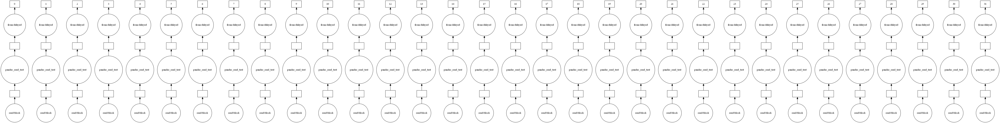

In [6]:
data_15_01.visualize()

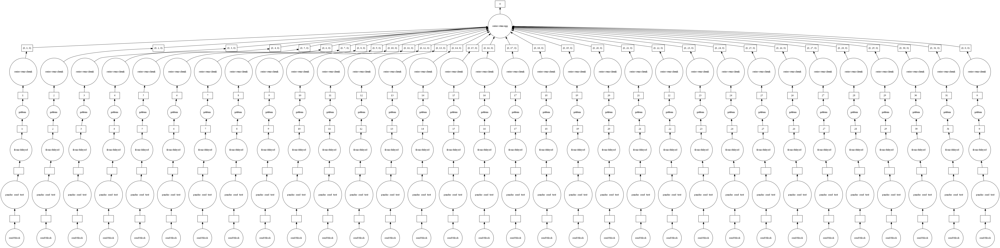

In [7]:
data_15_01["passenger_count"].sum().visualize()

In [6]:
print("Total Number of Passengers in January 2015 = "+str(data_15_01["passenger_count"].sum(axis = 0).compute()))

Total Number of Passengers in January 2015 = 21437303


## Features in Dataset
<table>
	<tr>
		<th>Field Name</th>
		<th>Description</th>
	</tr>
	<tr>
		<td>VendorID</td>
		<td>
		A code indicating the TPEP provider that provided the record.
		<ol>
			<li>Creative Mobile Technologies</li>
			<li>VeriFone Inc.</li>
		</ol>
		</td>
	</tr>
	<tr>
		<td>tpep_pickup_datetime</td>
		<td>The date and time when the meter was engaged.</td>
	</tr>
	<tr>
		<td>tpep_dropoff_datetime</td>
		<td>The date and time when the meter was disengaged.</td>
	</tr>
	<tr>
		<td>Passenger_count</td>
		<td>The number of passengers in the vehicle. This is a driver-entered value.</td>
	</tr>
	<tr>
		<td>Trip_distance</td>
		<td>The elapsed trip distance in miles reported by the taximeter.</td>
	</tr>
	<tr>
		<td>Pickup_longitude</td>
		<td>Longitude where the meter was engaged.</td>
	</tr>
	<tr>
		<td>Pickup_latitude</td>
		<td>Latitude where the meter was engaged.</td>
	</tr>
	<tr>
		<td>RateCodeID</td>
		<td>The final rate code in effect at the end of the trip.
		<ol>
			<li> Standard rate </li>
			<li> JFK </li>
			<li> Newark </li>
			<li> Nassau or Westchester</li>
			<li> Negotiated fare </li>
			<li> Group ride</li>
		</ol>
		</td>
	</tr>
	<tr>
		<td>Store_and_fwd_flag</td>
		<td>This flag indicates whether the trip record was held in vehicle memory before sending to the vendor,<br\> aka “store and forward,” because the vehicle did not have a connection to the server.
		<br\>Y= store and forward trip
		<br\>N= not a store and forward trip
		</td>
	</tr>

	<tr>
		<td>Dropoff_longitude</td>
		<td>Longitude where the meter was disengaged.</td>
	</tr>
	<tr>
		<td>Dropoff_ latitude</td>
		<td>Latitude where the meter was disengaged.</td>
	</tr>
	<tr>
		<td>Payment_type</td>
		<td>A numeric code signifying how the passenger paid for the trip.
		<ol>
			<li> Credit card </li>
			<li> Cash </li>
			<li> No charge </li>
			<li> Dispute</li>
			<li> Unknown </li>
			<li> Voided trip</li>
		</ol>
		</td>
	</tr>
	<tr>
		<td>Fare_amount</td>
		<td>The time-and-distance fare calculated by the meter.</td>
	</tr>
	<tr>
		<td>Extra</td>
		<td>Miscellaneous extras and surcharges. Currently, this only includes. the $0.50 and $1 rush hour and overnight charges.</td>
	</tr>
	<tr>
		<td>MTA_tax</td>
		<td>0.50 MTA tax that is automatically triggered based on the metered rate in use.</td>
	</tr>
	<tr>
		<td>Improvement_surcharge</td>
		<td>0.30 improvement surcharge assessed trips at the flag drop. the improvement surcharge began being levied in 2015.</td>
	</tr>
	<tr>
		<td>Tip_amount</td>
		<td>Tip amount – This field is automatically populated for credit card tips.Cash tips are not included.</td>
	</tr>
	<tr>
		<td>Tolls_amount</td>
		<td>Total amount of all tolls paid in trip.</td>
	</tr>
	<tr>
		<td>Total_amount</td>
		<td>The total amount charged to passengers. Does not include cash tips.</td>
	</tr>
</table>

In [8]:
print("Number of NAN values = {}".format(data_15_01.isnull().sum().compute()))

Number of NAN values = VendorID                 0
tpep_pickup_datetime     0
tpep_dropoff_datetime    0
passenger_count          0
trip_distance            0
pickup_longitude         0
pickup_latitude          0
RateCodeID               0
store_and_fwd_flag       0
dropoff_longitude        0
dropoff_latitude         0
payment_type             0
fare_amount              0
extra                    0
mta_tax                  0
tip_amount               0
tolls_amount             0
improvement_surcharge    3
total_amount             0
dtype: int64


We have 3 NAN values for feature "improvement_surcharge".Since we will not be using "improvement_surcharge" in our task, so nan values will not affect us. So, we are leaving it as it is.

## Problem Formulation: Time Series Forecasting and Regression

Given a region and a 10min interval, we have to predict number of pickups. <br>
(a) How to break up the NYC into regions?<br>
(b) Every region of NYC has to be broken up into 10min  interval.<br>

Now, every row pickup has longitude and latitude in it, and we will use this to define pickup regions. 
We will predict the pickup at time 't+1' when we already know about the pickup at time 't'in the same region. Hence, this problem can be thought of as a 'Time Series Prediction' problem which is a special case of regression problems.

<div style="color:red"><b>In this project we are considering only the yellow taxis data for the time period of Jan 2015. We will used Jan 2015 data to make prediction for Jan 2016 data.</b><div>

## Performance Metric
* 1) Mean Absolute Percentage Error(MAPE)
* 2) Mean Squared Error(MSE)

<h1>2. Univariate Analysis & Data Cleaning</h1>
Here, we will do the univariate analysis of the data and remove all the erroneous/outlier points.

<h3> 2.1 Trip duration and speed

In [3]:
def Convert_time_Unix(time_inp):
    #time format is "YYYY-MM-DD HH:MM:SS", which is a string
    con_str = datetime.strptime(time_inp, "%Y-%m-%d %H:%M:%S") #this will convert the String time into datetime format
    time_tuple = con_str.timetuple() #this will convert the datetime formatted time into structured time
    return time.mktime(time_tuple) + 19800 

def data_Trip_Duration_speed(data_frame):
    travel_time_data = data_frame[["tpep_pickup_datetime", "tpep_dropoff_datetime"]].compute()
    pickup_time = [Convert_time_Unix(pk_up) for pk_up in travel_time_data["tpep_pickup_datetime"].values]
    dropoff_time = [Convert_time_Unix(drp_off) for drp_off in travel_time_data["tpep_dropoff_datetime"].values]
    trip_duration = (np.array(dropoff_time) - np.array(pickup_time))/float(60)  #trip duration in minutes 
    
    new_data = data_frame[['passenger_count','trip_distance','pickup_longitude','pickup_latitude','dropoff_longitude','dropoff_latitude','total_amount']].compute()
    new_data["trip_duration"] = trip_duration
    new_data["pickup_time"] = pickup_time
    new_data["dropoff_time"] = dropoff_time
    new_data["speed"] = (new_data["trip_distance"]/new_data["trip_duration"])*60  #speed in miles/hr
    return new_data

<div style = "background-color:red"> NOTE: 19800 is added in the above unix times because:</div>
    
UNIX TIMESTAMP means how many seconds have elasped since 1 JAN 1970 calculated from 
the reference of GMT Time.INDIA(where i made the project) time is 5 hours 30 minutes(19800 secs) ahead of GMT time. 
Here, "time.mktime()" function returns unix time stamp from the reference of Local(India) time.So,"time.mktime()" will return the
number of seconds elapsed from 12:00 am of 1st JAN 1970(<b>a/c to  GMT</b>) till now(which is the local time in INDIA now).However 
the 12:00 am of 1 JAN 1970 in INDIA took place 5 hours and 30 minutes (19800 seconds) before GMT time.
So if we add 19800 to the output "time.mktime()" we get the no of hours elapsed from 1st Jan 1950(in INDIA) till now(local time of     INDIA)

In [4]:
new_data = data_Trip_Duration_speed(data_15_01)
new_data.head(5)

,passenger_count,trip_distance,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,total_amount,trip_duration,pickup_time,dropoff_time,speed
0,1,1.59,-73.993896,40.750111,-73.974785,40.750618,17.05,18.050000,1.421349e+09,1.421350e+09,5.285319
1,1,3.30,-74.001648,40.724243,-73.994415,40.759109,17.80,19.833333,1.420922e+09,1.420923e+09,9.983193
2,1,1.80,-73.963341,40.802788,-73.951820,40.824413,10.80,10.050000,1.420922e+09,1.420923e+09,10.746269
3,1,0.50,-74.009087,40.713818,-74.004326,40.719986,4.80,1.866667,1.420922e+09,1.420922e+09,16.071429
4,1,3.00,-73.971176,40.762428,-74.004181,40.742653,16.30,19.316667,1.420922e+09,1.420923e+09,9.318378


<h4> 2.1.1 Trip Durations

<div style="color:blue"> According to NYC Taxi and Limousine Commission regulations, the maximum allowed trip duration in a 24hrs interval is 12 hrs.</div>

<IPython.core.display.Javascript object>


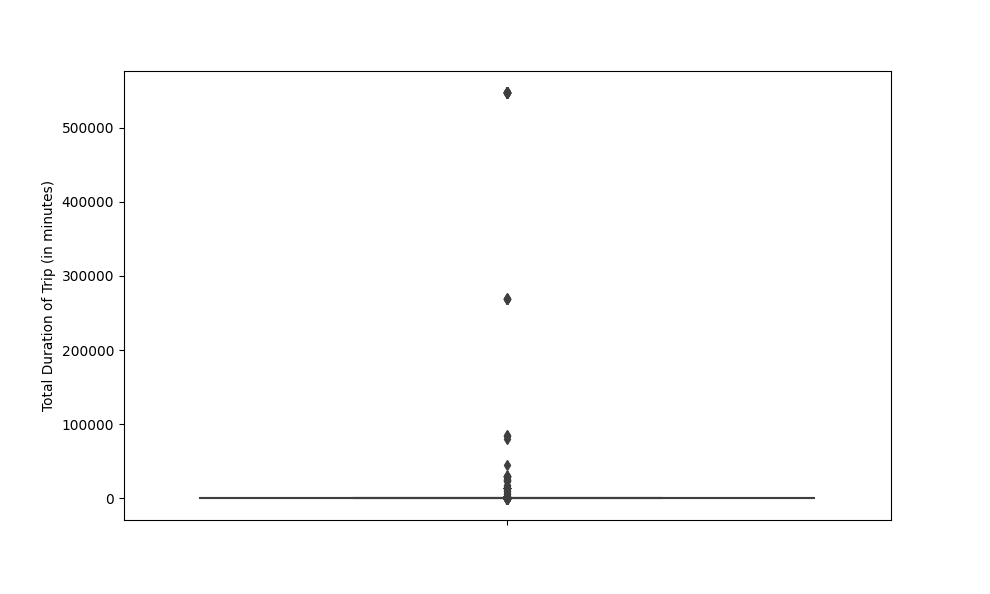

In [5]:
plt.figure(figsize = (10,6))
sns.boxplot("trip_duration", data = new_data, orient = "v")
plt.ylabel("Total Duration of Trip (in minutes)")
plt.show()

In [12]:
#calculating 0-100th percentile to find a the correct percentile value for removal of outliers
for i in range(0,100,10):
    var = new_data["trip_duration"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {} min".format(i,var[int(len(var)*(float(i)/100))]))
print ("100 percentile value is ",var[-1], "min")

0 percentile value is -1211.0166666666667 min
10 percentile value is 3.8333333333333335 min
20 percentile value is 5.383333333333334 min
30 percentile value is 6.816666666666666 min
40 percentile value is 8.3 min
50 percentile value is 9.95 min
60 percentile value is 11.866666666666667 min
70 percentile value is 14.283333333333333 min
80 percentile value is 17.633333333333333 min
90 percentile value is 23.45 min
100 percentile value is  548555.6333333333 min


In [16]:
#looking further for the 99th percecntile
for i in range(90,100):
    var = new_data["trip_duration"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print ("100 percentile value is ",var[-1])

90 percentile value is 23.45
91 percentile value is 24.35
92 percentile value is 25.383333333333333
93 percentile value is 26.55
94 percentile value is 27.933333333333334
95 percentile value is 29.583333333333332
96 percentile value is 31.683333333333334
97 percentile value is 34.46666666666667
98 percentile value is 38.71666666666667
99 percentile value is 46.75
100 percentile value is  548555.6333333333


In [17]:
#looking further from the 99.9th percecntile
i = 99
while(i<100):
    var = new_data["trip_duration"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
    i += 0.1
print ("100 percentile value is ",var[-1])

99 percentile value is 46.75
99.1 percentile value is 48.06666666666667
99.19999999999999 percentile value is 49.56666666666667
99.29999999999998 percentile value is 51.28333333333333
99.39999999999998 percentile value is 53.31666666666667
99.49999999999997 percentile value is 55.833333333333336
99.59999999999997 percentile value is 59.13333333333333
99.69999999999996 percentile value is 63.9
99.79999999999995 percentile value is 71.86666666666666
99.89999999999995 percentile value is 101.6
99.99999999999994 percentile value is 548555.6333333333
100 percentile value is  548555.6333333333


<b>Observations:</b>Here, 0th percentile value of trip duration is negative,also 99.89th percentile value of trip duration is 101.6min, but 100th percentile value is 548555.633 min. These are erroneous points and needs to be removed.Removing trip duration < 1 min and > 720 mins(12hrs) which is the  maximum allowed in a 24 hr as mentioned above.

<h5> 2.1.1.1 Removing Outliers and Erroneous Points and Plotting

In [9]:
new_clean_data = new_data[(new_data.trip_duration>1) & (new_data.trip_duration<720)]

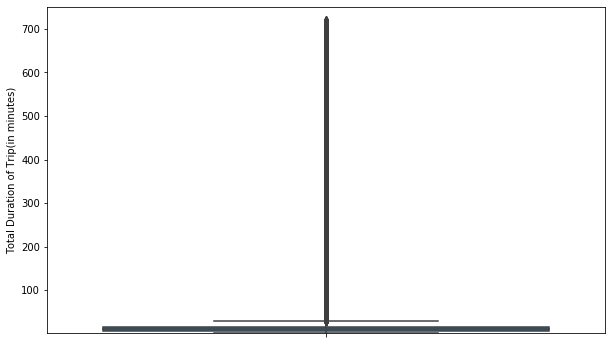

In [10]:
plt.figure(figsize = (10,6))
sns.boxplot("trip_duration", data = new_clean_data, orient = "v")
plt.ylim(ymin = 1, ymax = 750)
plt.ylabel("Total Duration of Trip(in minutes)")
plt.show()

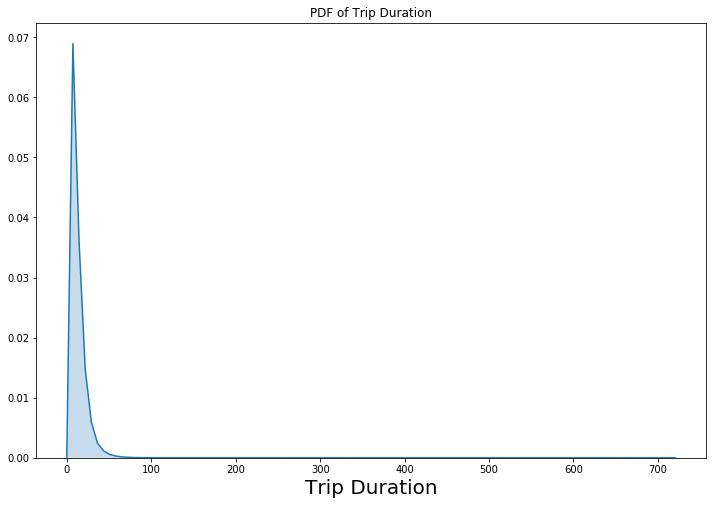

In [20]:
plt.figure(figsize = (12,8))
sns.kdeplot(new_clean_data["trip_duration"].values, shade = True, cumulative = False)
plt.xlabel("Trip Duration", fontsize = 20)
plt.title("PDF of Trip Duration")
plt.show()

<b>Observation:</b> Above PDF plot shows that almost all of the trip durations are very less and approximately less than 100 minutes, extremely few trip durations are above 100.

<h4> 2.1.2 Speed

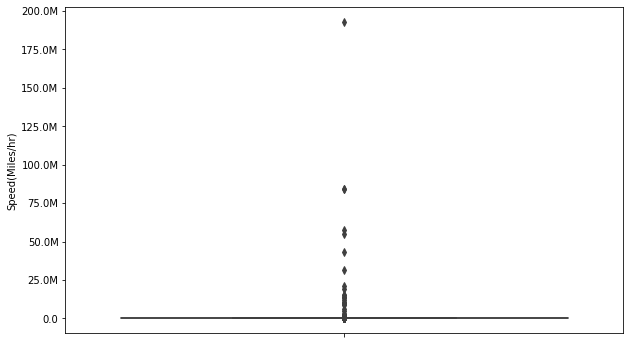

In [9]:
#converting the values to shorter form;1000 = 1k, 1000000 = 1M
def codeLabel(x):
    if x < 10**3:
        return x
    elif x >= 10**3 and x < 10**6:
        return str(x/10**3)+"k"
    else:
        return str(x/10**6) + "M"
    
#plotting
fig = plt.figure(figsize = (10,6))
ax = sns.boxplot("speed", data = new_clean_data, orient = "v")
ax.set_yticklabels([codeLabel(N) for N in ax.get_yticks()])
plt.ylabel("Speed(Miles/hr)")
plt.show()

In [22]:
#calculating speed values at each percntile 0,10,20,30,40,50,60,70,80,90,100 
for i in range(0,100,10):
    var = new_clean_data["speed"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print("100 percentile value is ",var[-1])

0 percentile value is 0.0
10 percentile value is 6.409495548961425
20 percentile value is 7.80952380952381
30 percentile value is 8.929133858267717
40 percentile value is 9.98019801980198
50 percentile value is 11.06865671641791
60 percentile value is 12.286689419795222
70 percentile value is 13.796407185628745
80 percentile value is 15.963224893917962
90 percentile value is 20.186915887850468
100 percentile value is  192857142.85714284


In [23]:
#looking further for the 99th percecntile
for i in range(90,100):
    var = new_clean_data["speed"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print ("100 percentile value is ",var[-1])

90 percentile value is 20.186915887850468
91 percentile value is 20.91645569620253
92 percentile value is 21.752988047808763
93 percentile value is 22.721893491124263
94 percentile value is 23.844155844155843
95 percentile value is 25.182552504038775
96 percentile value is 26.80851063829787
97 percentile value is 28.84304932735426
98 percentile value is 31.591128254580514
99 percentile value is 35.7513566847558
100 percentile value is  192857142.85714284


In [24]:
indices = np.round(np.arange(99,100,0.1), 4)
for i in indices:
    var = new_clean_data["speed"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print ("100 percentile value is ",var[-1])

99.0 percentile value is 35.7513566847558
99.1 percentile value is 36.31084727468969
99.2 percentile value is 36.91470054446461
99.3 percentile value is 37.588235294117645
99.4 percentile value is 38.33035714285714
99.5 percentile value is 39.17580340264651
99.6 percentile value is 40.15384615384615
99.7 percentile value is 41.338301043219076
99.8 percentile value is 42.86631016042781
99.9 percentile value is 45.3107822410148
100 percentile value is  192857142.85714284


<b>Observations:</b><br> Here, 100th percentile value of a speed is 192 Million miles/hr which is illogical. Also, the 99.9th percentile value of speed is 45.31 miles/hr. So, we remove all the data points where speed is greater than 45.31miles/hr.

In [10]:
new_clean_data = new_clean_data[(new_clean_data.speed>0) & (new_clean_data.speed<45.31)]

#### Box plot after removing outliers and erroneous points.

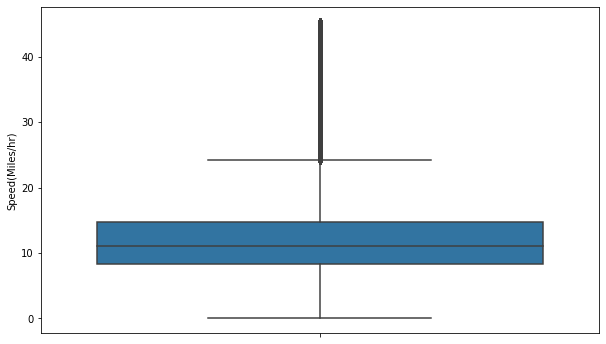

In [17]:
fig = plt.figure(figsize = (10,6))
ax = sns.boxplot("speed", data = new_clean_data, orient = "v")
plt.ylabel("Speed(Miles/hr)")
plt.show()

In [11]:
average_speed = sum(new_clean_data.speed)/len(new_clean_data.speed)
print("Average Speed of Taxis around NYC = "+str(average_speed))

Average Speed of Taxis around NYC = 12.452320837813998


<div style = "color: blue">The avg speed of  yellow cab drivers in Newyork is 12.45miles/hr, so a cab driver can travel around 2 miles per 10min on avg.</div>

<h4> 2.1.3 Trip Distance

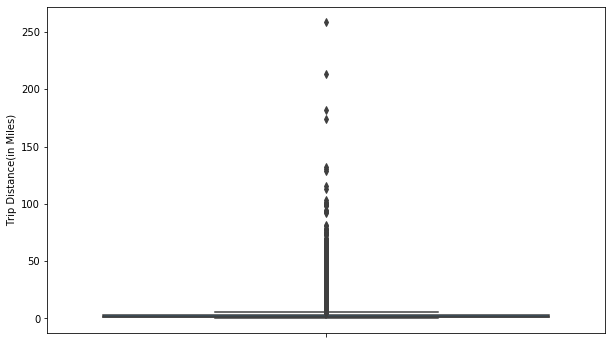

In [28]:
fig = plt.figure(figsize = (10,6))
ax = sns.boxplot("trip_distance", data = new_clean_data, orient = "v")
plt.ylabel("Trip Distance(in Miles)")
plt.show()

In [29]:
#calculating speed values at each percntile 0,10,20,30,40,50,60,70,80,90,100 
for i in range(0,100,10):
    var = new_clean_data["trip_distance"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print("100 percentile value is ",var[-1])

0 percentile value is 0.01
10 percentile value is 0.67
20 percentile value is 0.9
30 percentile value is 1.1
40 percentile value is 1.39
50 percentile value is 1.7
60 percentile value is 2.08
70 percentile value is 2.61
80 percentile value is 3.6
90 percentile value is 5.98
100 percentile value is  258.9


In [30]:
#looking further for the 99th percecntile
for i in range(90,100):
    var = new_clean_data["trip_distance"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print ("100 percentile value is ",var[-1])

90 percentile value is 5.98
91 percentile value is 6.47
92 percentile value is 7.09
93 percentile value is 7.87
94 percentile value is 8.74
95 percentile value is 9.6
96 percentile value is 10.6
97 percentile value is 12.1
98 percentile value is 16.06
99 percentile value is 18.18
100 percentile value is  258.9


In [31]:
indices = np.round(np.arange(99,100,0.1), 4)
for i in indices:
    var = new_clean_data["trip_distance"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print ("100 percentile value is ",var[-1])

99.0 percentile value is 18.18
99.1 percentile value is 18.37
99.2 percentile value is 18.6
99.3 percentile value is 18.84
99.4 percentile value is 19.14
99.5 percentile value is 19.5
99.6 percentile value is 19.97
99.7 percentile value is 20.51
99.8 percentile value is 21.23
99.9 percentile value is 22.58
100 percentile value is  258.9


<b>Observation:</b> Here, 99.9th percentile of trip distance is 22.58miles, but th 100th percentile value is 258.9miles, which is very high.<br> 
So, we remove all the data points where trip distance is greater than 23 miles.

In [11]:
new_clean_data = new_clean_data[(new_clean_data.trip_distance > 0) & (new_clean_data.trip_distance < 23)]

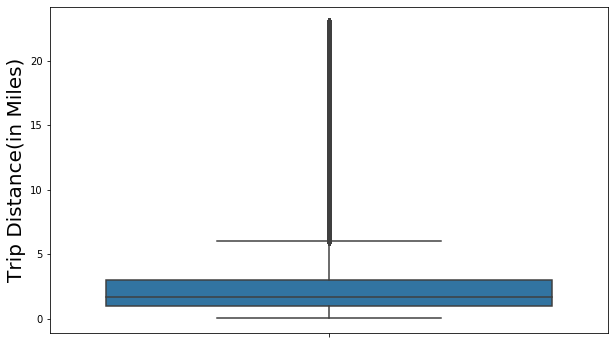

In [22]:
#plot of trip distance after removing outlier points
fig = plt.figure(figsize = (10,6))
ax = sns.boxplot("trip_distance", data = new_clean_data, orient = "v")
plt.ylabel("Trip Distance(in Miles)", fontsize = 20)
plt.show()

<h4> 2.1.4 Total Fare

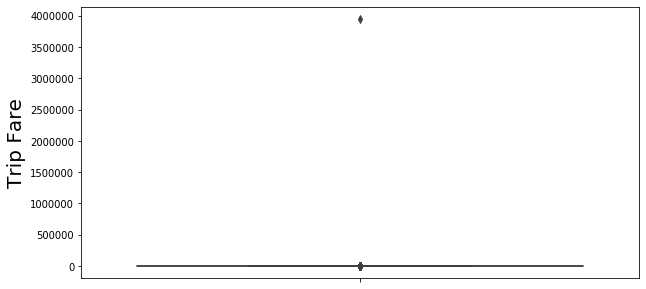

In [34]:
fig = plt.figure(figsize = (10,5))
ax = sns.boxplot("total_amount", data = new_clean_data, orient = "v")
plt.ylabel("Trip Fare", fontsize = 20)
plt.show()

In [35]:
#calculating speed values at each percntile 0,10,20,30,40,50,60,70,80,90,100 
for i in range(0,100,10):
    var = new_clean_data["total_amount"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print("100 percentile value is ",var[-1])

0 percentile value is -242.55
10 percentile value is 6.35
20 percentile value is 7.8
30 percentile value is 8.8
40 percentile value is 9.8
50 percentile value is 11.16
60 percentile value is 12.8
70 percentile value is 14.8
80 percentile value is 18.3
90 percentile value is 25.8
100 percentile value is  3950611.6


In [36]:
#looking further for the 99th percecntile
for i in range(90,100):
    var = new_clean_data["total_amount"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print ("100 percentile value is ",var[-1])

90 percentile value is 25.8
91 percentile value is 27.3
92 percentile value is 29.13
93 percentile value is 31.55
94 percentile value is 34.63
95 percentile value is 38.13
96 percentile value is 42.13
97 percentile value is 47.53
98 percentile value is 57.68
99 percentile value is 65.8
100 percentile value is  3950611.6


In [37]:
indices = np.round(np.arange(99,100,0.1), 4)
for i in indices:
    var = new_clean_data["total_amount"].values
    var = np.sort(var,axis = None)
    print("{} percentile value is {}".format(i,var[int(len(var)*(float(i)/100))]))
print ("100 percentile value is ",var[-1])

99.0 percentile value is 65.8
99.1 percentile value is 67.55
99.2 percentile value is 68.8
99.3 percentile value is 69.6
99.4 percentile value is 69.73
99.5 percentile value is 69.73
99.6 percentile value is 69.76
99.7 percentile value is 72.46
99.8 percentile value is 75.16
99.9 percentile value is 86.6
100 percentile value is  3950611.6


<b>Observation:</b><br>
Here, 99.9th percentile fare amount of a trip is 92.65. However, 100th percentile of a fare amount is more than 3 Million which is not possible. Therefore, we remove all the data points where fare amount is more than 87.Also the 0th percentile value is negative which needs to be removed

In [12]:
new_clean_data = new_clean_data[(new_clean_data.total_amount > 0) & (new_clean_data.total_amount < 87)]

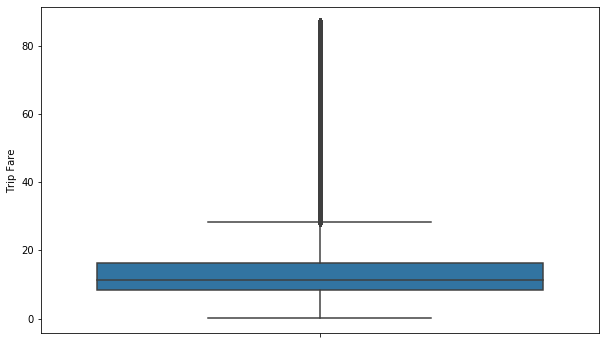

In [24]:
#plot of fare amount after removing outliers and erroneous points
fig = plt.figure(figsize = (10,6))
ax = sns.boxplot("total_amount", data = new_clean_data, orient = "v")
plt.ylabel("Trip Fare")
plt.show()

<h1> 2.2 Latitude and Longitude</h1>
<br>
It is inferred from the source: https://www.flickr.com/places/info/2459115 that New York is bounded by the location coordinates(latitude, longitude) - (40.5774, -74.15) & (40.9176,-73.7004) hence any coordinates--including both pickups and drop-offs--not within these coordinates are not considered by us as we are only concerned with pickups which originate within New York. 

<h4> 2.2.1 Pickup Latitude and longitude

In [53]:
#detecting the pickups latitude and longitudes which are outside NYC.
#latitude at equator is 0. Above equator latitude increases and becomes 90 at north pole. Below equator latitude decreases and
#is negative and becomes -90 at south pole.
#Longitude is 0 at United Kingdom(UK). To the right of UK, longitude increases positively and to the left of UK longitude decrease
#and is negative.
outside_NYC = data_15_01[((data_15_01.pickup_latitude <= 40.5774) | (data_15_01.pickup_longitude <= -74.15) | (data_15_01.pickup_latitude >= 40.9176) | (data_15_01.pickup_longitude >= -73.7004))]

map_boundary = folium.Map(location = [40.5774, -73.7004], tiles = "Stamen Toner")
pickups_outside = outside_NYC.head(20000)

for i,row in pickups_outside.iterrows():
    if row["pickup_latitude"] != 0:
        folium.Marker([row["pickup_latitude"], row["pickup_longitude"]]).add_to(map_boundary)
map_boundary

<h4> 2.2.2 Dropoff Latitude and longitude

In [54]:
#detecting the dropoff latitude and longitudes which are outside NYC.
#latitude at equator is 0. Above equator latitude increases and becomes 90 at north pole. Below equator latitude decreases and
#is negative and becomes -90 at south pole.
#Longitude is 0 at United Kingdom(UK). To the right of UK, longitude increases positively and to the left of UK longitude decrease
#and is negative.

outside_NYC = data_15_01[((data_15_01.dropoff_latitude <= 40.5774) | (data_15_01.dropoff_longitude <= -74.15) \
                          | (data_15_01.dropoff_latitude >= 40.9176) | (data_15_01.dropoff_longitude >= -73.7004))]

map_boundary = folium.Map(location = [40.5774, -73.7004], tiles = "Stamen Toner")
dropoff_outside = outside_NYC.head(20000)

for i,row in dropoff_outside.iterrows():
    if row["dropoff_latitude"] != 0:
        folium.Marker([row["dropoff_latitude"], row["dropoff_longitude"]]).add_to(map_boundary)
map_boundary

<b>Observation:</b>As you can see in the above maps, there are many erroneous data points, which are in some other state(One can be seen somewhere in Spain near Madrid and Barcelona), and some of them are even in Atlantic Ocean. All these erroneous data points will also be removed as a part of data cleaning process.

<h3> 2.2.3 Removing all the data points where pickup and drop-off are outside NYC

<h4> 2.2.3.1 Removing Pickups outside NYC

In [13]:
new_clean_data = new_clean_data[(((new_clean_data.pickup_latitude >= 40.5774) & (new_clean_data.pickup_latitude <= 40.9176)) & \
                                 ((new_clean_data.pickup_longitude >= -74.15) & (new_clean_data.pickup_longitude <= -73.7004)))]


In [55]:
map_boundary = folium.Map(location = [40.9176, -73.7004], tiles = "Stamen Toner")
pickups_within_NYC = new_clean_data.sample(n = 500)

for i,row in pickups_within_NYC.iterrows():
    folium.Marker([row["pickup_latitude"], row["pickup_longitude"]]).add_to(map_boundary)
map_boundary

<b>Observation:</b> Large number of pickups are concentrated in and around Manhattan district of New York

<h4> 2.2.3.2 Removing Dropoffs outside NYC

In [14]:

new_clean_data = new_clean_data[(((new_clean_data.dropoff_latitude >= 40.5774) & (new_clean_data.dropoff_latitude <= 40.9176)) \
                                 & ((new_clean_data.dropoff_longitude >= -74.15) & (new_clean_data.dropoff_longitude <= -73.7004)))]

In [56]:
map_boundary = folium.Map(location = [40.9176, -73.7004], tiles = "Stamen Toner")
dropoff_NYC = new_clean_data.sample(n = 500)

for i,row in dropoff_NYC.iterrows():
    folium.Marker([row["dropoff_latitude"], row["dropoff_longitude"]]).add_to(map_boundary)
map_boundary

<b>Observation:</b> Most of the dropoffs are concentrated in and around Manhattan district of New York

In [6]:
# new_clean_data = new_data[(((new_data.pickup_latitude >= 40.5774) & \
#                                   (new_data.pickup_latitude <= 40.9176)) & \
#                                  ((new_data.pickup_longitude >= -74.15) &\
#                                   (new_data.pickup_longitude <= -73.7004)))]
# new_clean_data = new_clean_data[(((new_clean_data.dropoff_latitude >= 40.5774)\
#                                   & (new_clean_data.dropoff_latitude <= 40.9176)) \
#                                  & ((new_clean_data.dropoff_longitude >= -74.15) &\
#                                     (new_clean_data.dropoff_longitude <= -73.7004)))]

# new_clean_data = new_clean_data[(new_clean_data.trip_duration>1) & (new_clean_data.trip_duration<720)]
# new_clean_data = new_clean_data[(new_clean_data.speed>0) & (new_clean_data.speed<45.31)]
# new_clean_data = new_clean_data[(new_clean_data.trip_distance > 0) & (new_clean_data.trip_distance < 23)]
# new_clean_data = new_clean_data[(new_clean_data.total_amount > 0) & (new_clean_data.total_amount < 86.6)]

<h2>Amount of data points lost after removing all the erroneous points and outlier points</h2>

In [15]:
print("Percentage of points remaining after cleaning =",str((new_clean_data.shape[0]/new_data.shape[0])*100), "%")

Percentage of points remaining after cleaning = 96.80426349201419 %


In [16]:
print("Total number of outliers and erroneous points removed = ",str(new_data.shape[0] - new_clean_data.shape[0]))

Total number of outliers and erroneous points removed =  407424


# 3. Data Preparation

<h3>3.1 Clustering/Segmentation

In [43]:
coordinates = new_clean_data[["pickup_latitude", "pickup_longitude"]].values
neighbors = []

def cluster_vicinity(regionCenters, totalClusters):
    good_points = 0
    bad_points = 0
    less_dist = []
    more_dist = []
    min_distance = 100000  #any big number can be given here
    for i in range(totalClusters):
        good_points = 0
        bad_points = 0
        for j in range(totalClusters):
            if j != i:
                distance = gpxpy.geo.haversine_distance(latitude_1 = regionCenters[i][0], longitude_1 = regionCenters[i][1], latitude_2 = regionCenters[j][0], longitude_2 = regionCenters[j][1])
                #you can check the documentation of above "gpxpy.geo.haversine_distance" at "https://github.com/tkrajina/gpxpy/blob/master/gpxpy/geo.py"
                #"gpxpy.geo.haversine_distance" gives distance between two latitudes and longitudes in meters. So, we have to convert it into miles.
                distance = distance/(1.60934*1000)   #distance from meters to miles
                min_distance = min(min_distance, distance) #it will return minimum of "min_distance, distance".
                if distance < 2:
                    good_points += 1
                else:
                    bad_points += 1
        less_dist.append(good_points)
        more_dist.append(bad_points)
    print("On choosing a cluster size of {}".format(totalClusters))
    print("Avg. Number clusters within vicinity where inter cluster distance < 2 miles is {}".format(np.ceil(sum(less_dist)/len(less_dist))))
    print("Avg. Number clusters outside of vicinity where inter cluster distance > 2 miles is {}".format(np.ceil(sum(more_dist)/len(more_dist))))
    print("Minimum distance between any two clusters = {}".format(min_distance))
    print("-"*10)
            
def ClusterCreate(noOfRegions):
    regions = MiniBatchKMeans(n_clusters = noOfRegions, batch_size = 10000).fit(coordinates)
    regionCenters = regions.cluster_centers_ 
    totalClusters = len(regionCenters)
    return regionCenters, totalClusters

The MiniBatchKMeans is a variant of the KMeans algorithm which uses mini-batches to reduce the computation time, while still attempting to optimise the same objective function. Mini-batches are subsets of the input data, randomly sampled in each training iteration. These mini-batches drastically reduce the amount of computation required to converge to a local solution. In contrast to other algorithms that reduce the convergence time of k-means, mini-batch k-means produces results that are generally only slightly worse than the standard algorithm.

In [44]:
for i in range(10, 100, 10):
    Cluster_Centers, Clusters_Count = ClusterCreate(i)
    cluster_vicinity(Cluster_Centers, Clusters_Count)

On choosing a cluster size of 10
Avg. Number clusters within vicinity where inter cluster distance < 2 miles is 3.0
Avg. Number clusters outside of vicinity where inter cluster distance > 2 miles is 7.0
Minimum distance between any two clusters = 0.91680310719296
----------
On choosing a cluster size of 20
Avg. Number clusters within vicinity where inter cluster distance < 2 miles is 5.0
Avg. Number clusters outside of vicinity where inter cluster distance > 2 miles is 15.0
Minimum distance between any two clusters = 0.6561591118004009
----------
On choosing a cluster size of 30
Avg. Number clusters within vicinity where inter cluster distance < 2 miles is 8.0
Avg. Number clusters outside of vicinity where inter cluster distance > 2 miles is 22.0
Minimum distance between any two clusters = 0.47821987952655237
----------
On choosing a cluster size of 40
Avg. Number clusters within vicinity where inter cluster distance < 2 miles is 10.0
Avg. Number clusters outside of vicinity where inte

<h3>NOTE: </h3> We want the MINIMUM INTER CLUSTER distance between any two clusters to be less than 0.5miles because we dont want the clusters to be too close together(We want to break the NYC into 10 min regions and in 10 mins a driver can cover about 2 mile as mentioned earlier.). So we want the avg. intercluster distances to be less than 2 miles. When number of clusters are 30 then this condition is almost meeting. Therefore, we are considering number of clusters to be 30.

In [7]:
coordinates = new_clean_data[["pickup_latitude", "pickup_longitude"]].values
clf = MiniBatchKMeans(n_clusters = 30, batch_size = 10000)
clf.fit(coordinates)
new_clean_data["pickup_cluster"] = clf.predict(new_clean_data[["pickup_latitude", "pickup_longitude"]])
#cluster_centers_ contains the centres of all clusters in the form of a list.MiniBatchKMeans.predict(X) returns the index of 
#cluster_centers_ corresponding to that cluster which is nearest to the point(X)

In [8]:
new_clean_data.head()

,passenger_count,trip_distance,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,total_amount,trip_duration,pickup_time,dropoff_time,speed,pickup_cluster
0,1,1.59,-73.993896,40.750111,-73.974785,40.750618,17.05,18.050000,1.421349e+09,1.421350e+09,5.285319,18
1,1,3.30,-74.001648,40.724243,-73.994415,40.759109,17.80,19.833333,1.420922e+09,1.420923e+09,9.983193,15
2,1,1.80,-73.963341,40.802788,-73.951820,40.824413,10.80,10.050000,1.420922e+09,1.420923e+09,10.746269,8
3,1,0.50,-74.009087,40.713818,-74.004326,40.719986,4.80,1.866667,1.420922e+09,1.420922e+09,16.071429,24
4,1,3.00,-73.971176,40.762428,-74.004181,40.742653,16.30,19.316667,1.420922e+09,1.420923e+09,9.318378,13


#### Plotting cluster centers

In [9]:
cluster_centres = clf.cluster_centers_
clusters_count = len(cluster_centres)
map_boundary = folium.Map(location = [40.9176, -73.7004], tiles = "Stamen Toner")

for i in range(clusters_count):
    folium.Marker([cluster_centres[i][0], cluster_centres[i][1]], popup = (str(np.round(cluster_centres[i][0], 2))+", "+\
                                                                           str(np.round(cluster_centres[i][1], 2)))).add_to(map_boundary)
map_boundary

#### Plotting Regions in NYC

<IPython.core.display.Javascript object>


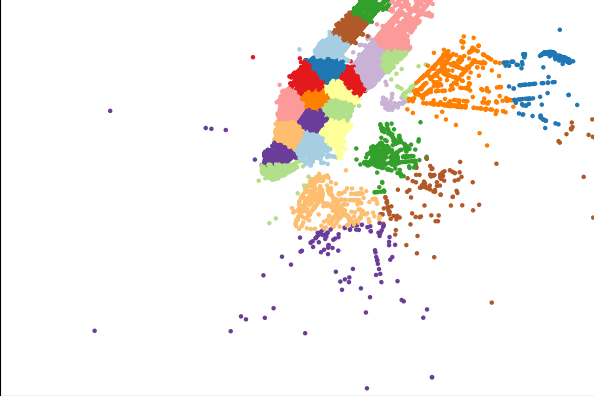

In [10]:
def clusters_plot(df):
    latitude_range = (40.5774, 40.9176)
    longitude_range = (-74.15, -73.7004)
    fig = plt.figure()
    #https://python4astronomers.github.io/plotting/advanced.html
    ax = fig.add_axes([0,0,1.5,1.5])
    ax.scatter(x = df.pickup_longitude.values[:70000], y = df.pickup_latitude.values[:70000],\
               c = df.pickup_cluster.values[:70000], cmap = "Paired", s = 5)
    ax.set_xlim(longitude_range)
    ax.set_ylim(latitude_range)
    ax.set_title("Regions in New York City")
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    plt.show()

clusters_plot(new_clean_data);

## Time Binning

In [11]:
# 1420070400 : 2015-01-01 00:00:00   (Equivalent unix time)
# 1451606400 : 2016-01-01 00:00:00   (Equivalent unix time)
def pickup_bins(df, month, year):
    unix_pickup_times = [i for i in df['pickup_time'].values]
    unix_times = [[1420070400],[1451606400]]
    init_pickup_unix = unix_times[year-2015][month-1]
    # https://www.timeanddate.com/time/zones/est
    # (int((i-start_pickup_unix)/600)+33) : our unix time is in gmt to we are converting it to est
    binned_10minutes = [(int((i-init_pickup_unix)/600)) for i in unix_pickup_times]
    df['pickup_bins'] = np.array(binned_10minutes)
    return df

In [12]:
# In the above function we are just subtracting the pickup time from the unix time of 12:00AM 1st Jan 2015, and after that we 
# are dividing that with 600 in order to make a 10minute bin, that's it.
#For Jan 2016 data we are just subtracting its corresponding pickup time from the unix time of 12:00AM 1st Jan 2016.

In [13]:
binned_data_jan_15 = pickup_bins(new_clean_data, 1, 2015)

In [14]:
binned_data_jan_15.head()

,passenger_count,trip_distance,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,total_amount,trip_duration,pickup_time,dropoff_time,speed,pickup_cluster,pickup_bins
0,1,1.59,-73.993896,40.750111,-73.974785,40.750618,17.05,18.050000,1.421349e+09,1.421350e+09,5.285319,18,2130
1,1,3.30,-74.001648,40.724243,-73.994415,40.759109,17.80,19.833333,1.420922e+09,1.420923e+09,9.983193,15,1419
2,1,1.80,-73.963341,40.802788,-73.951820,40.824413,10.80,10.050000,1.420922e+09,1.420923e+09,10.746269,8,1419
3,1,0.50,-74.009087,40.713818,-74.004326,40.719986,4.80,1.866667,1.420922e+09,1.420922e+09,16.071429,24,1419
4,1,3.00,-73.971176,40.762428,-74.004181,40.742653,16.30,19.316667,1.420922e+09,1.420923e+09,9.318378,13,1419


In [15]:
print("Number of unique 10 minute time bins for the month of January 2015( which is one of ((24*60)/10)*31): ",\
      str(len(np.unique(binned_data_jan_15["pickup_bins"]))))

Number of unique 10 minute time bins for the month of January 2015( which is one of ((24*60)/10)*31):  4464


In [16]:
bin_groupBy_15_01 = binned_data_jan_15[["pickup_cluster", "pickup_bins", "trip_distance"]].groupby(["pickup_cluster", "pickup_bins"]).count()

In [17]:
# hear the trip_distance represents the number of pickups that are happend in that particular 10min intravel
# this data frame has two indices
# primary index: pickup_cluster (cluster number)
# secondary index : pickup_bins (we devid whole months time into 10min intravels 24*31*60/10 = 4464bins)
bin_groupBy_15_01.head()

trip_distance
pickup_cluster pickup_bins               
0              0                      116
               1                      230
               2                      236
               3                      164
               4                      182

## Data Preparation : Jan 2016

In [18]:
data_16_01 = dsk.read_csv("Data/yellow_tripdata_2016-01.csv")
print("Number of columns = "+str(len(data_16_01.columns)))
print("~"*35)

print("Creating New Frame for Jan 2016")
new_data_16 = data_Trip_Duration_speed(data_16_01)
print("~"*35)

print("Removing Trip Duration Outliers")
new_clean_data_16 = new_data_16[(new_data_16.trip_duration>1) & (new_data_16.trip_duration<720)]
print("~"*35)

print("Removing Speed Outliers")
new_clean_data_16 = new_clean_data_16[(new_clean_data_16.speed>0) & (new_clean_data_16.speed<45.31)]
print("~"*35)

print("Removing Trip Distance Outliers")
new_clean_data_16 = new_clean_data_16[(new_clean_data_16.trip_distance>0) & (new_clean_data_16.trip_distance<23)]
print("~"*35)

print("Removing Total Amount Outliers")
new_clean_data_16 = new_clean_data_16[(new_clean_data_16.total_amount>0) & (new_clean_data_16.total_amount<86.6)]
print("~"*35)

print("Removing Pickups outside of NYC")
new_clean_data_16 = new_clean_data_16[(((new_clean_data_16.pickup_latitude >= 40.5774) & (new_clean_data_16.pickup_latitude <= 40.9176))\
                                       & ((new_clean_data_16.pickup_longitude >= -74.15) & (new_clean_data_16.pickup_longitude <= -73.7004)))]
print("~"*35)

print("Removing Dropoffs outside of NYC")
new_clean_data_16 = new_clean_data_16[(((new_clean_data_16.dropoff_latitude >= 40.5774) & (new_clean_data_16.dropoff_latitude <= 40.9176)) \
                                       & ((new_clean_data_16.dropoff_longitude >= -74.15) & (new_clean_data_16.dropoff_longitude <= -73.7004)))]
print("~"*35)

print("Pickup Clusters are assigned")
new_clean_data_16["pickup_cluster"] = clf.predict(new_clean_data_16[["pickup_latitude", "pickup_longitude"]])
print("-"*35)

print("Assigning Pickup time bins")
data_16_01_final = pickup_bins(new_clean_data_16, 1, 2016)
print("~"*35)

print("grouping based on Pickup cluster and time bins")
bin_groupBy_16_01 = data_16_01_final[["pickup_cluster", "pickup_bins", "trip_distance"]].groupby(["pickup_cluster", "pickup_bins"]).count()
print("~"*35)

print("Percentage of Total data left after cleaning = "+str(new_clean_data_16.shape[0]/new_data_16.shape[0]))
print("Total Number of outliers removed = "+str(new_data_16.shape[0] - new_clean_data_16.shape[0]))
print("~"*35)


Number of columns = 19
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Creating New Frame for Jan 2016
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Removing Trip Duration Outliers
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Removing Speed Outliers
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Removing Trip Distance Outliers
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Removing Total Amount Outliers
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Removing Pickups outside of NYC
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Removing Dropoffs outside of NYC
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Pickup Clusters are assigned
-----------------------------------
Assigning Pickup time bins
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
grouping based on Pickup cluster and time bins
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Percentage of Total data left after cleaning = 0.9702401919966318
Total Number of outliers removed = 324586
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


In [19]:
data_16_01_final.head()

,passenger_count,trip_distance,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,total_amount,trip_duration,pickup_time,dropoff_time,speed,pickup_cluster,pickup_bins
5,2,5.52,-73.980118,40.743050,-73.913490,40.763142,20.3,18.50,1.451606e+09,1.451608e+09,17.902703,6,0
6,2,7.45,-73.994057,40.719990,-73.966362,40.789871,27.3,26.75,1.451606e+09,1.451608e+09,16.710280,1,0
7,1,1.20,-73.979424,40.744614,-73.992035,40.753944,10.3,11.90,1.451606e+09,1.451607e+09,6.050420,6,0
8,1,6.00,-73.947151,40.791046,-73.920769,40.865578,19.3,11.20,1.451606e+09,1.451607e+09,32.142857,11,0
9,1,3.21,-73.998344,40.723896,-73.995850,40.688400,12.8,11.10,1.451606e+09,1.451607e+09,17.351351,1,0


In [20]:
bin_groupBy_16_01.head()

trip_distance
pickup_cluster pickup_bins               
0              0                       78
               1                      243
               2                      224
               3                      155
               4                      159

In [21]:
binned_data_jan_15.head()

,passenger_count,trip_distance,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,total_amount,trip_duration,pickup_time,dropoff_time,speed,pickup_cluster,pickup_bins
0,1,1.59,-73.993896,40.750111,-73.974785,40.750618,17.05,18.050000,1.421349e+09,1.421350e+09,5.285319,18,2130
1,1,3.30,-74.001648,40.724243,-73.994415,40.759109,17.80,19.833333,1.420922e+09,1.420923e+09,9.983193,15,1419
2,1,1.80,-73.963341,40.802788,-73.951820,40.824413,10.80,10.050000,1.420922e+09,1.420923e+09,10.746269,8,1419
3,1,0.50,-74.009087,40.713818,-74.004326,40.719986,4.80,1.866667,1.420922e+09,1.420922e+09,16.071429,24,1419
4,1,3.00,-73.971176,40.762428,-74.004181,40.742653,16.30,19.316667,1.420922e+09,1.420923e+09,9.318378,13,1419


In [22]:
bin_groupBy_15_01.head()

trip_distance
pickup_cluster pickup_bins               
0              0                      116
               1                      230
               2                      236
               3                      164
               4                      182

## Smoothing

In [23]:
# For each cluster, this functon returns the unique time bins where the  pickups happened.
# Or specifically,for each cluster region we will collect all the indices of 10min intervals in which pickups have happened.
def uniquePickupBinsinClusters(dataframe):
    cluster_pickups_bin = []
    for i in range(30):          #we have total 30 clusters
        cluster_data = dataframe[dataframe["pickup_cluster"] == i]
        unique_cluster_pickup_bin = list(set(cluster_data["pickup_bins"]))
        unique_cluster_pickup_bin.sort()   #inplace sorting
        cluster_pickups_bin.append(unique_cluster_pickup_bin)
    return cluster_pickups_bin
# we can observe that there are some time bins that doesn't have any pickups.

In [24]:
#For Jan-2015, how many time_bins are there where there is no pickup in any of the cluster region?
#we have total 30 clusters
unique_bins_pickup_15_01 = uniquePickupBinsinClusters(binned_data_jan_15)
for i in range(30):             
    print("For cluster with ID :{},total number of 10 min time bins with zero pickup is {}".format(i,\
                                                      (4464 - len(unique_bins_pickup_15_01[i]))))
    print("~"*90)

For cluster with ID :0,total number of 10 min time bins with zero pickup is 38
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
For cluster with ID :1,total number of 10 min time bins with zero pickup is 30
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
For cluster with ID :2,total number of 10 min time bins with zero pickup is 150
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
For cluster with ID :3,total number of 10 min time bins with zero pickup is 55
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
For cluster with ID :4,total number of 10 min time bins with zero pickup is 24
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
For cluster with ID :5,total number of 10 min time bins with zero pickup is 31
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~

--> There are two ways to fill up these values:

* Fill the missing value with 0's.

* Fill the missing values with the avg values.

    * Case 1:(values missing at the start)<br>
      Ex1: _ _ _ x =>ceil(x/4), ceil(x/4), ceil(x/4), ceil(x/4)<br>
      Ex2: _ _ x => ceil(x/3), ceil(x/3), ceil(x/3)
      
    * Case 2:(values missing in middle)<br>
      Ex1: x _ _ y => ceil((x+y)/4), ceil((x+y)/4), ceil((x+y)/4), ceil((x+y)/4)<br>
      Ex2: x _ _ _ y => ceil((x+y)/5), ceil((x+y)/5), ceil((x+y)/5), ceil((x+y)/5), ceil((x+y)/5)
      
    * Case 3:(values missing at the end)<br>
      Ex1: x _ _ _ => ceil(x/4), ceil(x/4), ceil(x/4), ceil(x/4)<br> 
      Ex2: x _ => ceil(x/2), ceil(x/2)

In [25]:
# Fill the missing value with 0's.
def fill_Missing_Zero(pickupCount, clusterTimeBin):
    index = 0
    smooth_clusters = []
    for cluster in range(0, 30):
        smooth_bins = []
        for daybin in range(4464):    #there are total 4464 time bins in both Jan-2015 & Feb-2016.
            if daybin in clusterTimeBin[cluster]:   #if a time bin is present in "correspondingTimeBin" in cluster 'c', 
            #then it means there is a pickup, in this case, we are simply adding number of pickups, else we are adding 0.
                smooth_bins.append(pickupCount[index])
                index += 1
            else:
                smooth_bins.append(0)
        smooth_clusters.extend(smooth_bins)
    return smooth_clusters
#above function performs the operation in this way: if in any cluster if there is no pickup in any of the 4464 time bins, then 
#it simply appends 0 in that missing time_bin else it adds the original number of pickups in that time_bins.
# NOTE : When we multiply any integer with "1.0", then it will be converted into float.

In [26]:
def smoothing(numberOfPickups, correspondingTimeBin):
    ind = 0
    repeat = 0
    smoothed_region = []
    for cluster in range(0, 30):
        smoothed_bin = []
        for t1 in range(4464):
            if repeat != 0:   #this will ensure that we shall not fill the pickup values again which we already filled by smoothing
                repeat -= 1
            else:
                if t1 in correspondingTimeBin[cluster]:
                    smoothed_bin.append(numberOfPickups[ind])
                    ind += 1
                else:
                    if t1 == 0:           
    #<---------------------CASE-1:Pickups missing in the beginning------------------------>
                        for t2 in range(t1, 4464):
                            if t2 not in correspondingTimeBin[cluster]:
                                continue
                            else:
                                right_hand_limit = t2
                                smoothed_value = (numberOfPickups[ind]*1.0)/((right_hand_limit + 1)*1.0)
                                for i in range(right_hand_limit + 1):
                                    smoothed_bin.append(math.ceil(smoothed_value))
                                ind += 1
                                repeat = right_hand_limit - t1
                                
                    if t1 != 0:
                        right_hand_limit = 0
                        for t2 in range(t1, 4464):
                            if t2 not in correspondingTimeBin[cluster]:
                                continue
                            else:
                                right_hand_limit = t2
                                break
                        if right_hand_limit == 0:
    #<---------------------CASE-2: Pickups MISSING IN THE END------------------------------>
                            smoothed_value = (numberOfPickups[ind-1]*1.0)/(((4464 - t1)+1)*1.0)
                            del smoothed_bin[-1]
                            for i in range((4464 - t1)+1):
                                smoothed_bin.append(math.ceil(smoothed_value))
                            repeat = (4464 - t1) - 1    
    #<---------------------CASE-3: Pickups MISSING IN MIDDLE OF TWO VALUES----------------> 
                        else: 
                            smoothed_value = ((numberOfPickups[ind-1] + numberOfPickups[ind])*1.0)/(((right_hand_limit - t1)+2)*1.0)
                            del smoothed_bin[-1]
                            for i in range((right_hand_limit - t1)+2):
                                smoothed_bin.append(math.ceil(smoothed_value))
                            ind += 1
                            repeat = right_hand_limit - t1                        
        smoothed_region.extend(smoothed_bin)
    return smoothed_region

# when we multiply any integer with "1.0", then it will be converted into float.

<div>
How above smoothing function code is working: <br>
Above smoothing function code is working on the goal of filling values with the following idea: <br>

If there are no pickups in the beginning of time_bin means if the values are missing at time bins starting from 12:00 till 
anytime, then we will fill pickups as follows:<br>

Case 1:(pickups missing at the start): <br>
Ex1: _ _ _ x =>ceil(x/4), ceil(x/4), ceil(x/4), ceil(x/4) <br>
Ex2: _ _ x => ceil(x/3), ceil(x/3), ceil(x/3) <br>

Case 2:(pickups missing at the end) <br>
Ex1: x _ _ _ => ceil(x/4), ceil(x/4), ceil(x/4), ceil(x/4) <br>
Ex2: x _ => ceil(x/2), ceil(x/2) <br>

Case 3:(values missing in middle)  <br>
Ex1: x _ _ y => ceil((x+y)/4), ceil((x+y)/4), ceil((x+y)/4), ceil((x+y)/4) <br>
Ex2: x _ _ _ y => ceil((x+y)/5), ceil((x+y)/5), ceil((x+y)/5), ceil((x+y)/5), ceil((x+y)/5) <br>

<div>

In [27]:
fill_with_Zero_15_01 = fill_Missing_Zero(bin_groupBy_15_01["trip_distance"].values, unique_bins_pickup_15_01)
# here in unique_bins_pickup_15_01 dataframe the "trip_distance" represents the number of pickups that are happened.
fill_smooth_15_01 = smoothing(bin_groupBy_15_01["trip_distance"].values, unique_bins_pickup_15_01)

In [38]:
def zeros_Count(num):
    count = 0
    for i in num:
        if i == 0:
            count += 1
    return count

In [39]:
print("Number of values filled with zero in zero filled data= "+str(zeros_Count(fill_with_Zero_15_01)))

Number of values filled with zero in zero filled data= 2370


In [40]:
print("Sanity check for number of zeros in smoothed data = "+str(zeros_Count(fill_smooth_15_01)))

Sanity check for number of zeros in smoothed data = 0


There are total 30 clusters. Each cluster has 4464 time bins. After smoothing or fillWithZero, each of 4464 time bin has a pickup. So, there should be a total of <b>4464*30 = 133920</b> pickup values present for the month of January 2015. Let's Check, is it correct?

In [41]:
print("Total number of pickup values = "+str(len(fill_with_Zero_15_01)))
print("Total number of pickup values = "+str(len(fill_smooth_15_01)))

Total number of pickup values = 133920
Total number of pickup values = 133920


<div><h4>Plot of all the pickup values for cluster 26th<h4> </div>

<IPython.core.display.Javascript object>


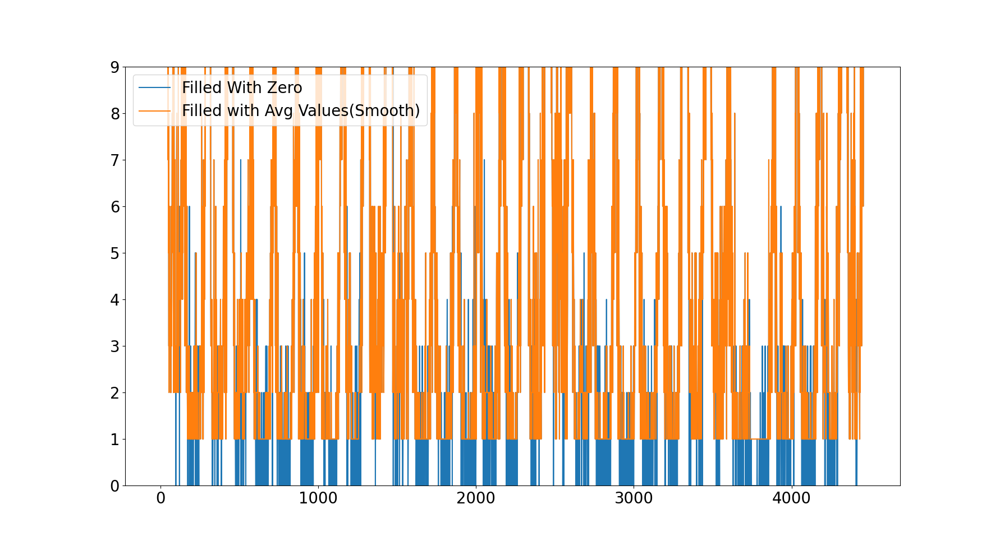

In [41]:
fig = plt.figure(figsize = (18, 10))
plt.plot(fill_with_Zero_15_01[4464*28:4464*29], label = "Filled With Zero")
plt.plot(fill_smooth_15_01[4464*28:4464*29], label = "Filled with Avg Values(Smooth)")
plt.legend(fontsize = 20)
plt.ylim(0,9)
plt.tick_params(labelsize = 20)
plt.show()

#### It shows that all the zero filled are separated by avg filled values. The minimum average filled value is 1.

Ques: Why we choose these methods and which method is used for which data?

Ans: consider we have data of some month in 2015 jan 1st, 10 _ _ _ 20, i.e there are 10 pickups that are happened in 1st 
10st 10min interval, 0 pickups happened in 2nd 10mins interval, 0 pickups happened in 3rd 10min interval. 
and 20 pickups happened in 4th 10min interval.
In fillMissingWithZero method we replace these values like 10, 0, 0, 0, 20.
Whereas in "smoothing" method we replace these values as 6,6,6,6,6, if you can check the number of pickups that happened 
in first 40min are same in both cases, but if you can observe that we looking at the future values. 
When you are using smoothing we are looking at the future number of pickups which might cause a data leakage.

So we use smoothing for jan 2015th data since it acts as our training data
and we use simple fill_misssing method for Jan 2016 data.

In [29]:
unique_PickupBins_16_01 = uniquePickupBinsinClusters(data_16_01_final)

In [30]:
# Jan-2015 data is smoothed, Jan-2016 data missing values are filled with zero
fill_with_Zero_16_01 = fill_Missing_Zero(bin_groupBy_16_01["trip_distance"].values, unique_PickupBins_16_01)

In [31]:
regionWisePickup_Jan_2016 = []
for i in range(30):
    regionWisePickup_Jan_2016.append(fill_with_Zero_16_01[4464*i:((4464*i)+4464)])
#"regionWisePickup_Jan_2016" is a list of lists which contains 30 sub lists, where the index of each sub-list is the 
#corresponding cluster number and the element of each sub-list is the pickup value. So, we know that there are 4464 time bins 
#in Jan 2016, hence, each sub-list is of size 4464.

In [32]:
print(len(regionWisePickup_Jan_2016))
print(len(regionWisePickup_Jan_2016[0]))

30
4464


In [47]:
# def find_missing_timeBins(IDs):
#     missing = []
#     for i in range(len(unique_binswithPickup_Jan_2015[IDs]) - 1):
#         j = unique_binswithPickup_Jan_2015[IDs][i]
#         k = unique_binswithPickup_Jan_2015[IDs][i+1]
#         if (k-j) > 1:
#             for l in range(j+1, k):
#                 missing.append(l)
#     return missing

# 4. Baseline Models

Now we get into modelling in order to forecast the pickup densities for the months of Jan-2016 for which we are using multiple models with two variations. 
1. Using Ratios of the 2016 data to the 2015 data i.e $R_{t} = P^{2016}_{t} / P^{2015}_{t}$
2. Using Previous known values of the 2016 data itself to predict the future values

Both these variations are used with moving averages to predict the numberof pickups given the cluster id and the particular time(bin)

### Preparing dataframe with $x_i$ as Jan- 2015 pickups and $y_i$ as Jan-2016 Pickups, with ratios as $Pickup^{2016} / Pickup^{2015}.$

In [48]:
ratios_data = pd.DataFrame()
ratios_data["Ground_truth"] = fill_smooth_15_01
ratios_data["Predicted"] = fill_with_Zero_16_01
ratios_data["Ratio"] = ratios_data["Predicted"]*1.0/ratios_data["Ground_truth"]*1.0

In [49]:
ratios_data.head()

,Ground_truth,Predicted,Ratio
0,68,48,0.705882
1,138,109,0.789855
2,168,150,0.892857
3,184,181,0.983696
4,179,193,1.078212


In [50]:
ratios_data.shape

(133920, 3)

In [51]:
print("Total Number of zeros in Ratio column = "+str(ratios_data["Ratio"].value_counts()[0]))

Total Number of zeros in Ratio column = 3869


In [52]:
print("Total Number of zeros in Prediction column = "+str(ratios_data["Predicted"].value_counts()[0]))

Total Number of zeros in Prediction column = 3869


## Simple Moving Average

The First Model used is the Moving Averages Model which uses the previous n values in order to predict the next value.<br> 
Using Ratio Values - $R_{t} = ( R_{t-1} + R_{t-2} + R_{t-3} .... R_{t-n} )$

In [53]:
def simple_moving_average_ratios(ratios):
    predicted_ratio = (ratios["Ratio"].values)[0]
    predicted_ratio_values = []
    predicted_pickup_values = []
    absolute_error = []
    squared_error = []
    window_size = 3
    for i in range(4464*30):
        if i % 4464 == 0:
            predicted_ratio_values.append(0)
            predicted_pickup_values.append(0)
            absolute_error.append(0)
            squared_error.append(0)
        else:
            predicted_ratio_values.append(predicted_ratio)
            predicted_pickup_values.append(int(predicted_ratio_values[i] * ratios["Ground_truth"].values[i]))
            absolute_error.append(abs(int(predicted_ratio_values[i] * ratios["Ground_truth"].values[i]) - ratios["Predicted"].values[i]))
            
            error = math.pow((int(predicted_ratio_values[i] * ratios["Ground_truth"].values[i]) - ratios["Predicted"].values[i]), 2)
            squared_error.append(error)
            
        if (i+1)>=window_size:
            predicted_ratio = sum(ratios["Ratio"].values[(i+1) - window_size:(i+1)])
            predicted_ratio = predicted_ratio/window_size
        else:
            predicted_ratio = sum(ratios["Ratio"].values[0:(i+1)])
            predicted_ratio = predicted_ratio/(i+1)
            
    ratios["Simple_Moving_Average_Ratios_Pred"] = predicted_pickup_values
    ratios["Simple_Moving_Average_Ratios_AbsError"] = absolute_error
    mean_absolute_percentage_error = (sum(absolute_error)/len(absolute_error)) / (sum(ratios["Predicted"]) / len(ratios["Predicted"]))
    mean_sq_error = sum(squared_error)/len(squared_error)
    return ratios, mean_absolute_percentage_error, mean_sq_error

In [54]:
# here, if we calculate absolute percentage error by this formulae: 
# "error = (abs(int(predicted_ratio_values[i] * ratios["Given"].values[i]) - ratios["Prediction"].values[i])) / ratios["Prediction"].values[i]"
#then it will lead to divide by zero problem because many of the values in " ratios["Prediction"].values[i]" are zeros.
# so we used this method to calculate mean absolute percentage error: "mean of error/mean of real values"

For the above the Hyperparameter is the window-size (n) which is tuned manually and it is found that the window-size of 3 is optimal for getting the best results using Moving Averages using previous Ratio values therefore we get $R_{t} = ( R_{t-1} + R_{t-2} + R_{t-3}) / 3$. We can easily plug any 3 to 5 values which seems to be most effective in reducing MAPE. Like here, we can use 1,2,3,4,5 as the values for window_size and calculate optimal window_size value.

Next we use the Moving averages of the 2016  values itself to predict the future value using $P_{t} = ( P_{t-1} + P_{t-2} + P_{t-3} .... P_{t-n} )/n$

In [55]:
def simple_moving_average_predictions(ratios):
    predicted_pickup = (ratios["Predicted"].values)[0]
    predicted_pickup_values = []
    absolute_error = []
    squared_error = []
    window_size = 2
    for i in range(4464*30):
        if i % 4464 == 0:
            predicted_pickup_values.append(0)
            absolute_error.append(0)
            squared_error.append(0)
        else:
            predicted_pickup_values.append(predicted_pickup)
            absolute_error.append(abs(predicted_pickup_values[i] - ratios["Predicted"].values[i]))
            
            error = math.pow((predicted_pickup_values[i] - ratios["Predicted"].values[i]), 2)
            squared_error.append(error)
            
        if (i+1)>=window_size:
            predicted_pickup = sum(ratios["Predicted"].values[(i+1) - window_size:(i+1)])
            predicted_pickup = predicted_pickup/window_size
        else:
            predicted_pickup = sum(ratios["Predicted"].values[0:(i+1)])
            predicted_pickup = predicted_pickup/(i+1)
            
    ratios["Simple_Moving_Average_Predictions_Pred"] = predicted_pickup_values
    ratios["Simple_Moving_Average_Predictions_AbsError"] = absolute_error
    mean_absolute_percentage_error = (sum(absolute_error)/len(absolute_error)) / (sum(ratios["Predicted"]) / len(ratios["Predicted"]))
    mean_sq_error = sum(squared_error)/len(squared_error)
    return ratios, mean_absolute_percentage_error, mean_sq_error

For the above the Hyperparameter is the window-size (n) which is tuned manually and it is found that the window-size of 2 is optimal for getting the best results using Moving Averages using previous 2016 values therefore we get $P_{t} = ( P_{t-1} + P_{t-2} ) / 2$

## Simple Weighted Moving Average
The Moving Avergaes Model used gave equal importance to all the values in the window used, but we know intuitively that the future is more likely to be similar to the latest values and less similar to the older values. Weighted Averages converts this analogy into a mathematical relationship giving the highest weight while computing the averages to the latest previous value and decreasing weights to the subsequent older ones<br>

Weighted Moving Averages using Ratio Values: $R_t = (N*R_{t-1} + N-1*R_{t-2} + N-2*R_{T-3} + ...) / N*(N+1)/2$

In [56]:
def weighted_moving_average_ratios(ratios):
    predicted_ratio = (ratios["Ratio"].values)[0]
    predicted_ratio_values = []
    predicted_pickup_values = []
    absolute_error = []
    squared_error = []
    window_size = 4
    for i in range(4464*30):
        if i % 4464 == 0:
            predicted_ratio_values.append(0)
            predicted_pickup_values.append(0)
            absolute_error.append(0)
            squared_error.append(0)
        else:
            predicted_ratio_values.append(predicted_ratio)
            predicted_pickup_values.append(int(predicted_ratio_values[i] * ratios["Ground_truth"].values[i]))
            absolute_error.append(abs(int(predicted_ratio_values[i] * ratios["Ground_truth"].values[i]) - ratios["Predicted"].values[i]))
            
            error = math.pow((int(predicted_ratio_values[i] * ratios["Ground_truth"].values[i]) - ratios["Predicted"].values[i]), 2)
            squared_error.append(error)
            
        if (i+1)>=window_size:
            sumOfRatios = 0
            sumOfWeights = 0
            for j in range(window_size, 0, -1):
                sumOfRatios = sumOfRatios + j*(ratios["Ratio"].values)[i -window_size + j]
                sumOfWeights = sumOfWeights + j
            predicted_ratio = sumOfRatios/sumOfWeights
        else:
            sumOfRatios = 0
            sumOfWeights = 0
            for j in range(i+1, 0, -1):
                sumOfRatios = sumOfRatios + j*(ratios["Ratio"].values)[j-1]
                sumOfWeights = sumOfWeights + j
            predicted_ratio = sumOfRatios/sumOfWeights
    
    ratios["Weighted_Moving_Average_Ratios_Pred"] = predicted_pickup_values
    ratios["Weighted_Moving_Average_Ratios_AbsError"] = absolute_error
    mean_absolute_percentage_error = (sum(absolute_error)/len(absolute_error)) / (sum(ratios["Predicted"]) / len(ratios["Predicted"]))
    mean_sq_error = sum(squared_error)/len(squared_error)
    return ratios, mean_absolute_percentage_error, mean_sq_error

For the above the Hyperparameter is the window-size (n) which is tuned manually and it is found that the window-size of 4 is optimal for getting the best results using Weighted Moving Averages using previous Ratio values therefore we get $ R_{t} = ( 4*R_{t-1} + 3*R_{t-2} + 2*R_{t-3} + 1*R_{t-4})/10$

Weighted Moving Averages using Previous 2016 Values - $P_{t} = ( N*P_{t-1} + (N-1)*P_{t-2} + (N-2)*P_{t-3} .... 1*P_{t-n} )/(N*(N+1)/2)$

In [57]:
def weighted_moving_average_predictions(ratios):
    predicted_pickup = (ratios["Predicted"].values)[0]
    predicted_pickup_values = []
    absolute_error = []
    squared_error = []
    window_size = 2
    for i in range(4464*30):
        if i % 4464 == 0:
            predicted_pickup_values.append(0)
            absolute_error.append(0)
            squared_error.append(0)
        else:
            predicted_pickup_values.append(predicted_pickup)
            absolute_error.append(abs(predicted_pickup_values[i] - ratios["Predicted"].values[i]))
            
            error = math.pow(int(predicted_pickup_values[i] - ratios["Predicted"].values[i]), 2)
            squared_error.append(error)
            
        if (i+1)>=window_size:
            sumPickups = 0
            sumOfWeights = 0
            for j in range(window_size, 0, -1):
                sumPickups = sumPickups + j*(ratios["Predicted"].values)[i -window_size + j]
                sumOfWeights = sumOfWeights + j
            predicted_pickup = sumPickups/sumOfWeights
        else:
            sumPickups = 0
            sumOfWeights = 0
            for j in range(i+1, 0, -1):
                sumPickups += j*(ratios["Predicted"].values)[j-1]
                sumOfWeights += j
            predicted_pickup = sumPickups/sumOfWeights
    
    ratios["Weighted_Moving_Average_Predictions_Pred"] = predicted_pickup_values
    ratios["Weighted_Moving_Average_Predictions_AbsError"] = absolute_error
    mean_absolute_percentage_error = (sum(absolute_error)/len(absolute_error)) / (sum(ratios["Predicted"]) / len(ratios["Predicted"]))
    mean_sq_error = sum(squared_error)/len(squared_error)
    return ratios, mean_absolute_percentage_error, mean_sq_error

For the above the Hyperparameter is the window-size (n) which is tuned manually and it is found that the window-size of 2 is optimal for getting the best results using Weighted Moving Averages using previous Ratio values therefore we get $ P_t = ( 2*P_{t-1} + 1*P_{t-2})/2$

## Exponential Weighted Moving Average

Here we will use previous predicted result along with previous actual value to make predictions for next value.
$R^{'}_{t} = \alpha*R_{t-1} + (1-\alpha)*R^{'}_{t-1}$

$R^′_t$ is the current predicted ratio at time t.<br>
$R^′_{t-1}$ is the previous predicted ratio at time t-1.<br>
$R_{t-1}$ is the actual previous ratio at time t-1.<br>
Let say alpha = 0.7.<br>
Now, when alpha = 0.7, then it means we are giving 70% weightage to the previous predicted ratio and 30% weightage to the previous actual ratio.<br>
$R^′_0$ = 0<br>
$R^′_1 = 0.7*R^′_0 + 0.3*R_0$<br>
$R^′_2 = 0.7*R^′_1 + 0.3*R_1$<br>
$R^′_3 = 0.7*R^′_2 + 0.3*R_2$<br>
Let’s take $R^′_3$.<br>
$R^′_3  = 0.3* R_2 + 0.7* R^′_2$<br>
$R^′_3  = 0.3* R_2 + 0.7*(0.3* R_1 + 0.7*R^′_1)$<br>
$R^′_3  = 0.3* R_2 + 0.7 * ( 0.3* R_1 + 0.7* ( 0.3* R_0 + 0.7* R^′_0 ) )$<br>
$R^′_3  = 0.3* R_3 + 0.7*0.3* R_1 + 0.7*0.7*0.3* R_0 + 0.7*0.7*0.7* R^′_0$<br>
$R^′_3  = 0.3* R_3 + 0.7*0.3* R_1 + 0.7*0.7*0.3* R_0 + 0$<br>

In [58]:
def exponential_weighted_moving_average_ratios(ratios):
    predicted_ratio = (ratios["Ratio"].values)[0]
    predicted_ratio_values = []
    predicted_pickup_values = []
    absolute_error = []
    squared_error = []
    alpha = 0.5
    for i in range(4464*30):
        if i % 4464 == 0:
            predicted_ratio_values.append(0)
            predicted_pickup_values.append(0)
            absolute_error.append(0)
            squared_error.append(0)
        else:
            predicted_ratio_values.append(predicted_ratio)
            predicted_pickup_values.append(int(predicted_ratio_values[i] * ratios["Ground_truth"].values[i]))
            absolute_error.append(abs(int(predicted_ratio_values[i] * ratios["Ground_truth"].values[i]) - ratios["Predicted"].values[i]))
            error = math.pow((int(predicted_ratio_values[i] * ratios["Ground_truth"].values[i]) - ratios["Predicted"].values[i]), 2)
            squared_error.append(error)
            predicted_ratio = alpha*predicted_ratio + ((1-alpha)*ratios["Ratio"].values[i-1])
            
            
    ratios["Exponential_Weighted_Moving_Average_Ratios_Pred"] = predicted_pickup_values
    ratios["Exponential_Weighted_Moving_Average_Ratios_AbsError"] = absolute_error
    mean_absolute_percentage_error = (sum(absolute_error)/len(absolute_error)) / (sum(ratios["Predicted"]) / len(ratios["Predicted"]))
    mean_sq_error = sum(squared_error)/len(squared_error)
    return ratios, mean_absolute_percentage_error, mean_sq_error

Here, above, alpha is a hyper-parameter which needs to be tuned manually. It is found that alpha = 0.5 gives lowest MAPE value.

$P^{'}_{t} = \alpha*P_{t-1} + (1-\alpha)*P^{'}_{t-1}$

In [59]:
def exponential_weighted_moving_average_predictions(ratios):
    predicted_pickup = (ratios["Predicted"].values)[0]
    predicted_pickup_values = []
    absolute_error = []
    squared_error = []
    alpha = 0.5
    for i in range(4464*30):
        if i % 4464 == 0:
            predicted_pickup_values.append(0)
            absolute_error.append(0)
            squared_error.append(0)
        else:
            predicted_pickup_values.append(predicted_pickup)
            absolute_error.append(abs(predicted_pickup_values[i] - ratios["Predicted"].values[i]))
            error = math.pow((predicted_pickup_values[i] - ratios["Predicted"].values[i]), 2)
            squared_error.append(error)
            predicted_pickup = alpha*predicted_pickup + ((1-alpha)*ratios["Predicted"].values[i-1])
            
            
    ratios["Exponential_Weighted_Moving_Average_Predictions_Pred"] = predicted_pickup_values
    ratios["Exponential_Weighted_Moving_Average_Predictions_AbsError"] = absolute_error
    mean_absolute_percentage_error = (sum(absolute_error)/len(absolute_error)) / (sum(ratios["Predicted"]) / len(ratios["Predicted"]))
    mean_sq_error = sum(squared_error)/len(squared_error)
    return ratios, mean_absolute_percentage_error, mean_sq_error

In [60]:
ratio1, mape1, mse1 = simple_moving_average_ratios(ratios_data)
ratio2, mape2, mse2 = simple_moving_average_predictions(ratios_data)
ratio3, mape3, mse3 = weighted_moving_average_ratios(ratios_data)
ratio4, mape4, mse4 = weighted_moving_average_predictions(ratios_data)
ratio5, mape5, mse5 = exponential_weighted_moving_average_ratios(ratios_data)
ratio6, mape6, mse6 = exponential_weighted_moving_average_predictions(ratios_data)


In [61]:
error_table_baseline = pd.DataFrame(columns = ["Model", "MAPE(%)", "MSE"])

error_table_baseline = error_table_baseline.append(pd.DataFrame([["Simple Moving Average Ratios", mape1*100, mse1]], columns = ["Model", "MAPE(%)", "MSE"]))
error_table_baseline = error_table_baseline.append(pd.DataFrame([["Simple Moving Average Predictions", mape2*100, mse2]], columns = ["Model", "MAPE(%)", "MSE"]))
error_table_baseline = error_table_baseline.append(pd.DataFrame([["Weighted Moving Average Ratios", mape3*100, mse3]], columns = ["Model", "MAPE(%)", "MSE"]))
error_table_baseline = error_table_baseline.append(pd.DataFrame([["Weighted Moving Average Predictions", mape4*100, mse4]], columns = ["Model", "MAPE(%)", "MSE"]))
error_table_baseline = error_table_baseline.append(pd.DataFrame([["Exponential Weighted Moving Average Ratios", mape5*100, mse5]], columns = ["Model", "MAPE(%)", "MSE"]))
error_table_baseline = error_table_baseline.append(pd.DataFrame([["Exponential Weighted Moving Average Predictions", mape6*100, mse6]], columns = ["Model", "MAPE(%)", "MSE"]))

error_table_baseline.reset_index(drop = True, inplace = True)

In [62]:
error_table_baseline.style.highlight_min(axis=0)

,Model,MAPE(%),MSE
0,Simple Moving Average Ratios,16.390431,502.560962
1,Simple Moving Average Predictions,12.531997,234.104701
2,Weighted Moving Average Ratios,16.053566,472.513934
3,Weighted Moving Average Predictions,12.276680,215.162283
4,Exponential Weighted Moving Average Ratios,17.644217,624.865688
5,Exponential Weighted Moving Average Predictions,15.251032,357.167891


<b>Note:-</b> The above comparisons are made using Jan 2015 and Jan 2016 only

<b>From the above error table it is inferred that the best forecasting model for our prediction would be:-</b>
$P_{t} = ( N*P_{t-1} + (N-1)*P_{t-2} + (N-2)*P_{t-3} .... 1*P_{t-n} )/(N*(N+1)/2)$ i.e Weighted Moving Averages Predictions using 2016 Values.

# 5. Regression Models

### Preparing Data

Preparing data to be split into train and test, The below code prepares data in cumulative form which will be later split into
test and train

There are total 30 clusters and for the month of January-2016 and there are total 4464 time bins. 
For each cluster region there are 4464 time bins and so, for 30 clusters there will be 4464*30 pickup values because after 
smoothing each time bin has pickup.
We will have a total of 4464*30 = 133920 pickup values.

In [46]:
#"regionWisePickup_Jan_2016" is a list of lists which contains 30 sub lists, where the index of each sub-list is the 
#corresponding cluster number and the element of each sub-list is the pickup value. So, we know that there are 4464 time bins 
#in Jan 2016, hence, each sub-list is of size 4464.
#"regionWisePickup_Jan_2016" is a list of lists [[x1,x2,x3..4464], [x1,x2,x3..4464], [x1,x2,x3..4464], [x1,x2,x3..4464], [x1,x2,x3..4464], .. 30 lists]
#Here, x1,x2,x3... are pickup values at time stamp 1,2,3... respectively

# print(len(regionWisePickup_Jan_2016))
# 30
# print(len(regionWisePickup_Jan_2016[0]))
# 4464

# we take number of pickups that are happened in last 5 10min intravels
number_of_time_stamps = 5

# TruePickups varaible
# it is list of lists
# It will be used as true labels/ground truth. Now since we are taking previous 5 pickups as a training data for predicting
# next pickup(here next pickup will be a true/ground truth pickup), so "TruePickups" will not contain first five pickups of each 
# cluster. It will contain number of pickups 4459 for each cluster. 
TruePickups = []

# lat will contain 4464-5=4459 times latitude of cluster center for every cluster.
# Ex: [[cent_lat 4459 times],[cent_lat 4459 times], [cent_lat 4459 times].... 30 lists]
# it is list of lists
lat = []

# lon will contain 4464-5=4459 times longitude of cluster center for every cluster.
# Ex: [[cent_lat 4459 times],[cent_lat 4459 times], [cent_lat 4459 times].... 30 lists]
# it is list of lists
lon = []

# we will code each day 
# sunday = 0, monday=1, tue = 2, wed=3, thur=4, fri=5,sat=6
day_of_week = []

# for every cluster we will be adding 4459 values, each value represent to which day of the week that pickup bin belongs to
# it is list of lists
# feat is a numbpy array, of shape (133770, 5). {4459*30 = 133770.}
# each row corresponds to an entry in our data
# for the first row we will have [f0,f1,f2,f3,f4] fi=number of pickups happened in i+1st 10min intravel(bin)
# the second row will have [f1,f2,f3,f4,f5]
# the third row will have [f2,f3,f4,f5,f6]
# and so on...
feat = []

regionCenters = clf.cluster_centers_
feat = [0]*number_of_time_stamps
for i in range(30):
    lat.append([regionCenters[i][0]]*4459) 
    lon.append([regionCenters[i][1]]*4459)
    #1 January 2016 is a Friday so we start our day from 5: "(int(j/144))%7+5"
    # Our prediction starts from 5th 10min interval since we need to have number of pickups that are happened in last 5 pickup bins.
    day_of_week.append([int(((int(j/144)%7)+5)%7) for j in range(5, 4464)])
    #"regionWisePickup_Jan_2016" is a list of lists which contains 30 sub lists, where the index of each sub-list is the 
    #corresponding cluster number and the element of each sub-list is the pickup value. So, we know that there are 4464 time bins 
    #in Jan 2016, hence, each sub-list is of size 4464.
    #"regionWisePickup_Jan_2016" is a list of lists [[x1,x2,x3..4464], [x1,x2,x3..4464], [x1,x2,x3..4464], [x1,x2,x3..4464], [x1,x2,x3..4464], .. 30 lists]
    #Here, x1,x2,x3... are pickup values at time stamp 1,2,3... respectively
    feat = np.vstack((feat, [regionWisePickup_Jan_2016[i][k:k+number_of_time_stamps] for k in range(0, len(regionWisePickup_Jan_2016[i]) - (number_of_time_stamps))]))
    TruePickups.append(regionWisePickup_Jan_2016[i][5:])
    #output contains pickup values of all the regions and of each time stamp, except first 5 time stamp pickups of each region.
feat = feat[1:]

In [47]:
len(lat[0])*len(lat) == len(lon[0])*len(lon) == len(day_of_week[0])*len(day_of_week) == 4459*30 == len(feat) == len(TruePickups[0])*len(TruePickups)

True

In [48]:
feat

array([[ 78, 243, 224, 155, 159],
       [243, 224, 155, 159, 155],
       [224, 155, 159, 155, 172],
       ...,
       [  3,   3,   2,   1,   1],
       [  3,   2,   1,   1,   1],
       [  2,   1,   1,   1,   4]], dtype=int64)

### Adding Predictions of Weighted Moving Average Predictions as a feature in our data

Getting the predictions of weighted moving averages to be used as a feature in cumulative form.

Upto now we computed 8 features for every data point that starts from 50th min of the day.
1. cluster center latitude
2. cluster center longitude
3. day of the week 
4. f_t_1: number of pickups that are happened previous t-1st 10min interval
5. f_t_2: number of pickups that are happened previous t-2nd 10min interval
6. f_t_3: number of pickups that are happened previous t-3rd 10min interval
7. f_t_4: number of pickups that are happened previous t-4th 10min interval
8. f_t_5: number of pickups that are happened previous t-5th 10min interval

From the baseline models we said that the weighted moving avarage predictions gives us the best error.
We will try to add the same weighted moving avarage predictions at time t as a feature to our data.<br>
Weighted Moving Average -> $P_{t} = ( N*P_{t-1} + (N-1)*P_{t-2} + (N-2)*P_{t-3} .... 1*P_{t-n} )/(N*(N+1)/2)$

In [49]:
# "predicted_pickup_values": it is a temporary array that store weighted moving avarage prediction values for each 10min intervl, 
# for each cluster it will get reset.
# for every cluster it contains 4464 values
predicted_pickup_values = []

# "predicted_pickup_values_list"
# it is list of lists
# predict_list is a list of lists [[x5,x6,x7..x4463], [x5,x6,x7..x4463], [x5,x6,x7..x4463], ... 40 lists]
predicted_pickup_values_list = []

predicted_value = -1  #it will contain cuurent predicted_value. Default is given -1 which will be replaced later

window_size = 2
for i in range(30):
    for j in range(4464):
        if j == 0:
            predicted_value = regionWisePickup_Jan_2016[i][j]
            predicted_pickup_values.append(0)
        else:
            if j>=window_size:
                sumPickups = 0
                sumOfWeights = 0
                for k in range(window_size, 0, -1):
                    sumPickups += k*(regionWisePickup_Jan_2016[i][j -window_size + (k - 1)])
                    sumOfWeights += k
                predicted_value = int(sumPickups/sumOfWeights)
                predicted_pickup_values.append(predicted_value)
            else:
                sumPickups = 0
                sumOfWeights = 0
                for k in range(j, 0, -1):
                    sumPickups += k*regionWisePickup_Jan_2016[i][k-1]
                    sumOfWeights += k
                predicted_value = int(sumPickups/sumOfWeights)
                predicted_pickup_values.append(predicted_value)
                
    predicted_pickup_values_list.append(predicted_pickup_values[5:])
    predicted_pickup_values = []

In [50]:
len(predicted_pickup_values_list[0])*len(predicted_pickup_values_list) == 4459*30

True

### Adding Top 5 Frequencies and Amplitudes of Fourier Transform as features

<IPython.core.display.Javascript object>


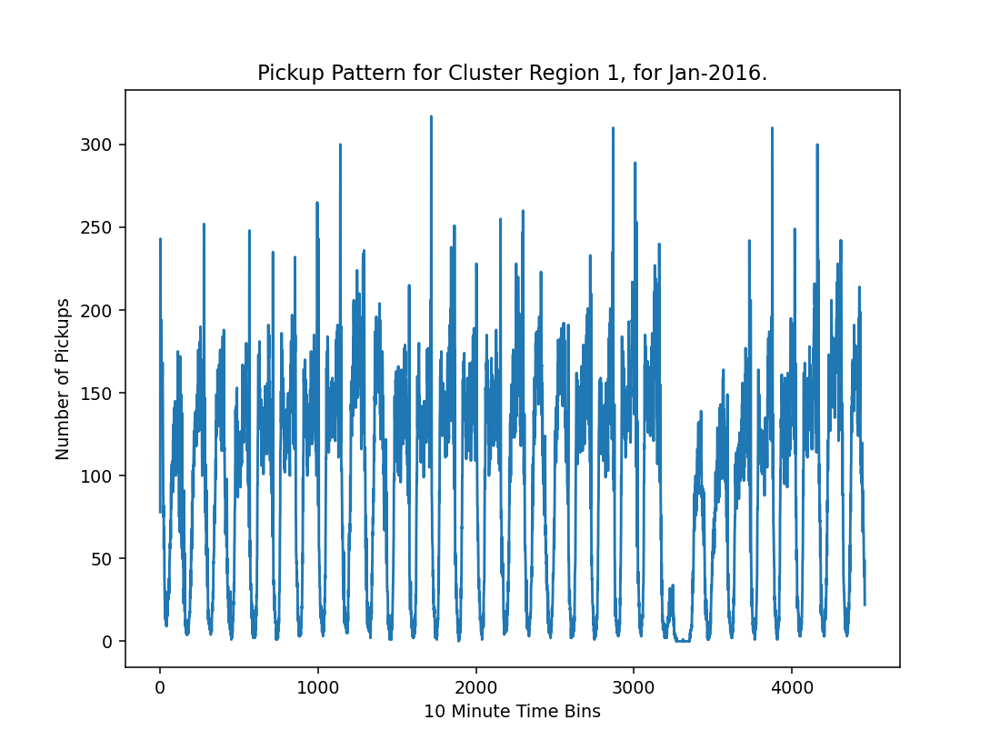

<IPython.core.display.Javascript object>


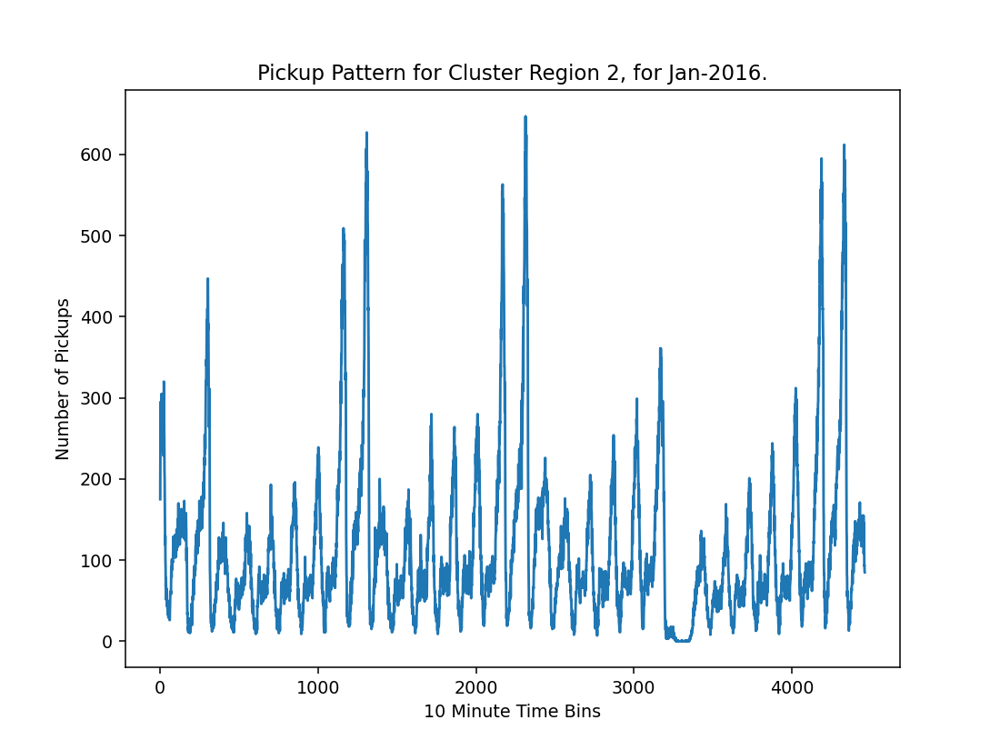

<IPython.core.display.Javascript object>


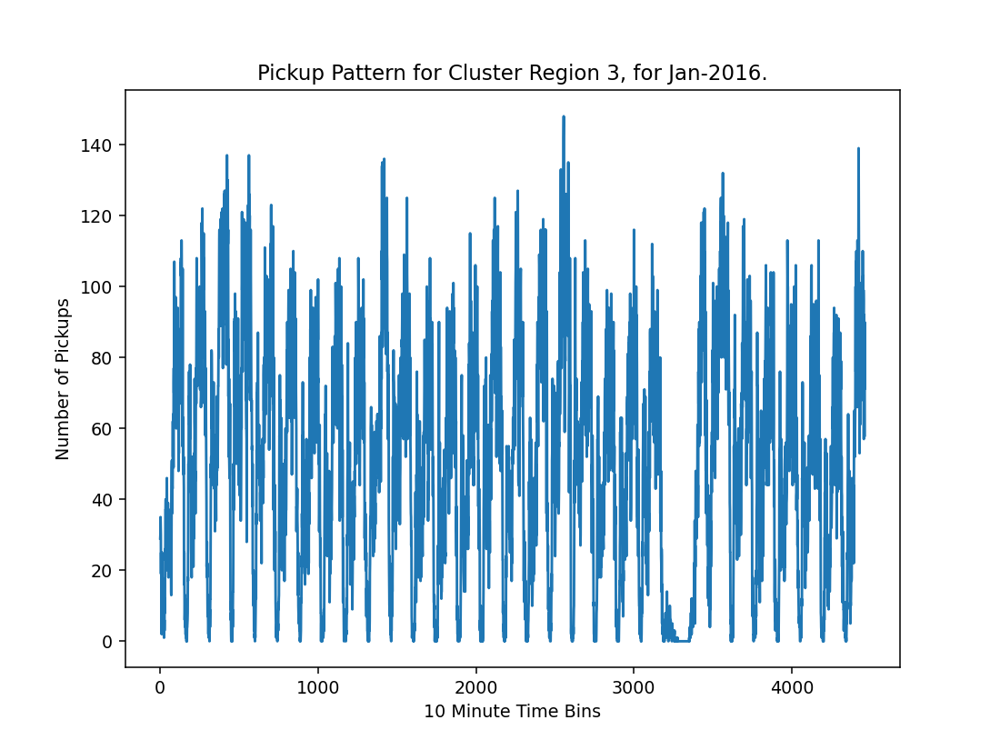

<IPython.core.display.Javascript object>


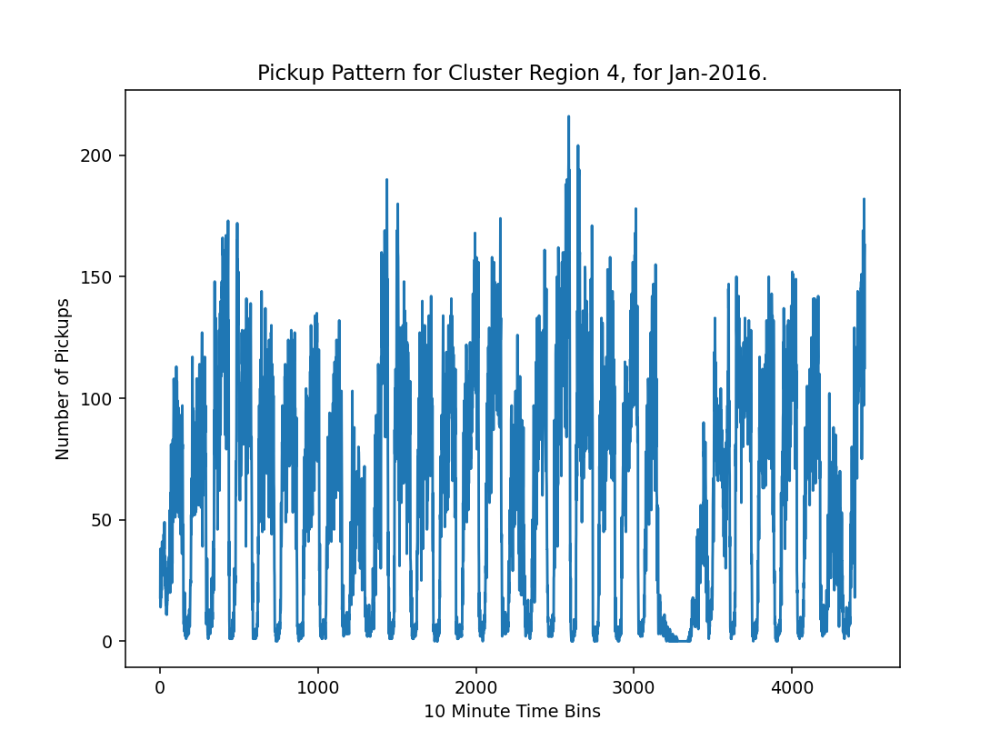

<IPython.core.display.Javascript object>


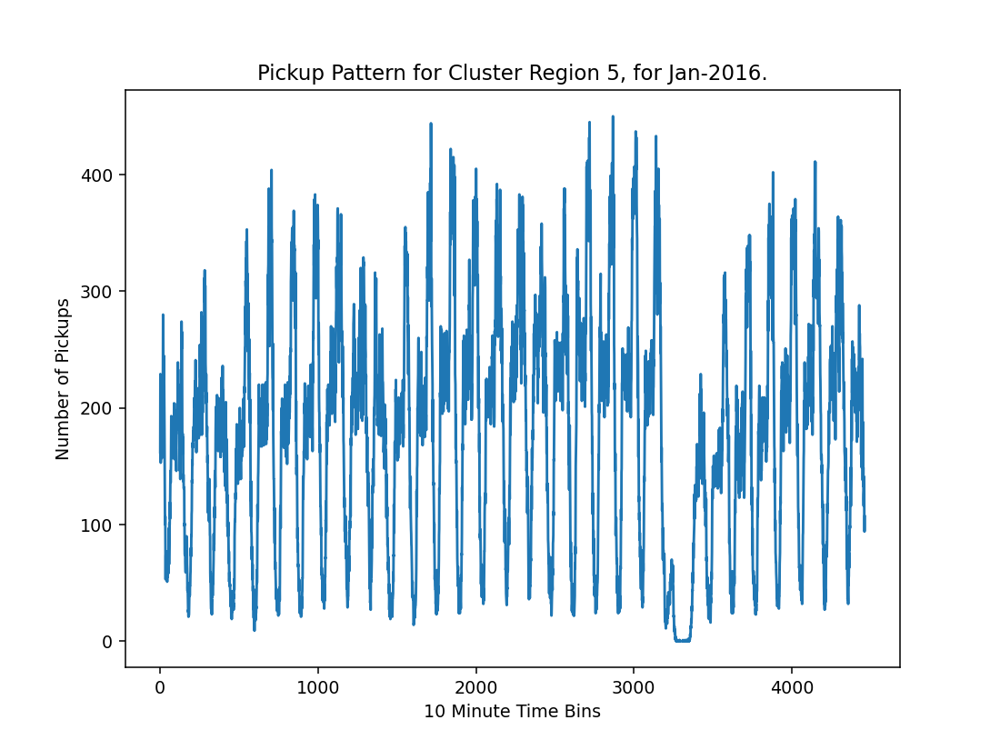

<IPython.core.display.Javascript object>


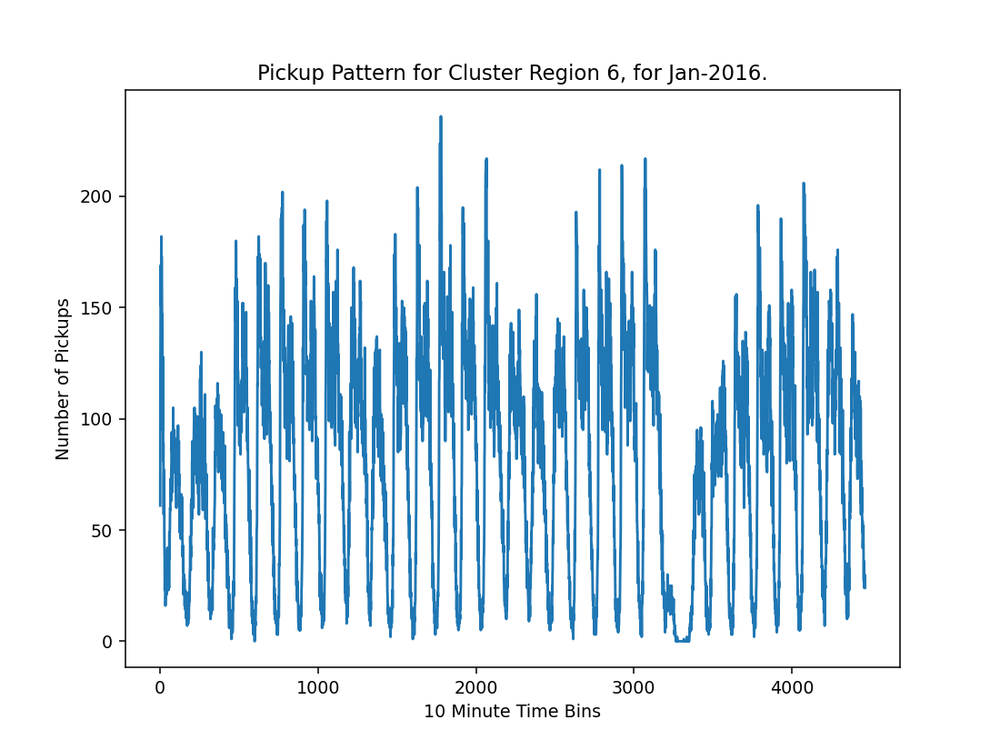

<IPython.core.display.Javascript object>


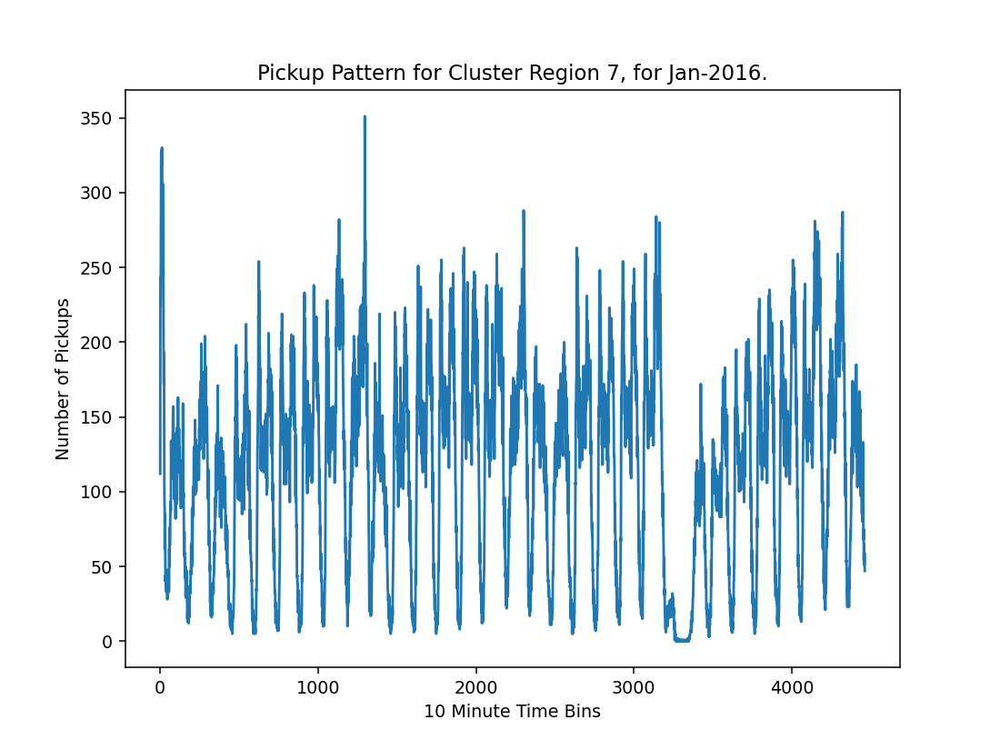

<IPython.core.display.Javascript object>


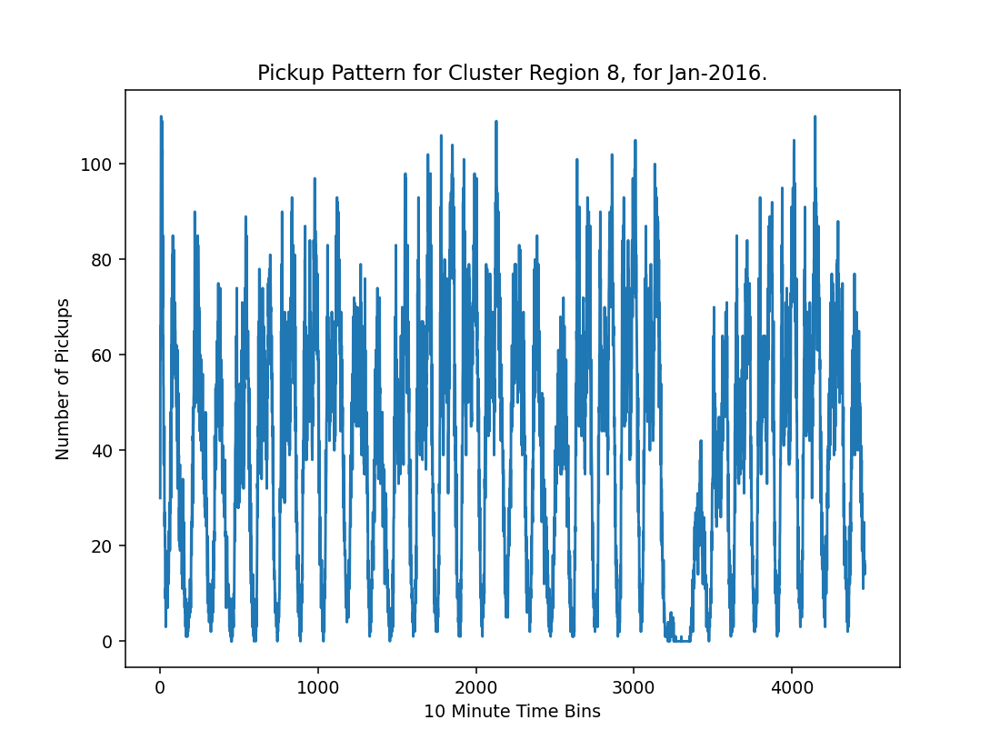

<IPython.core.display.Javascript object>


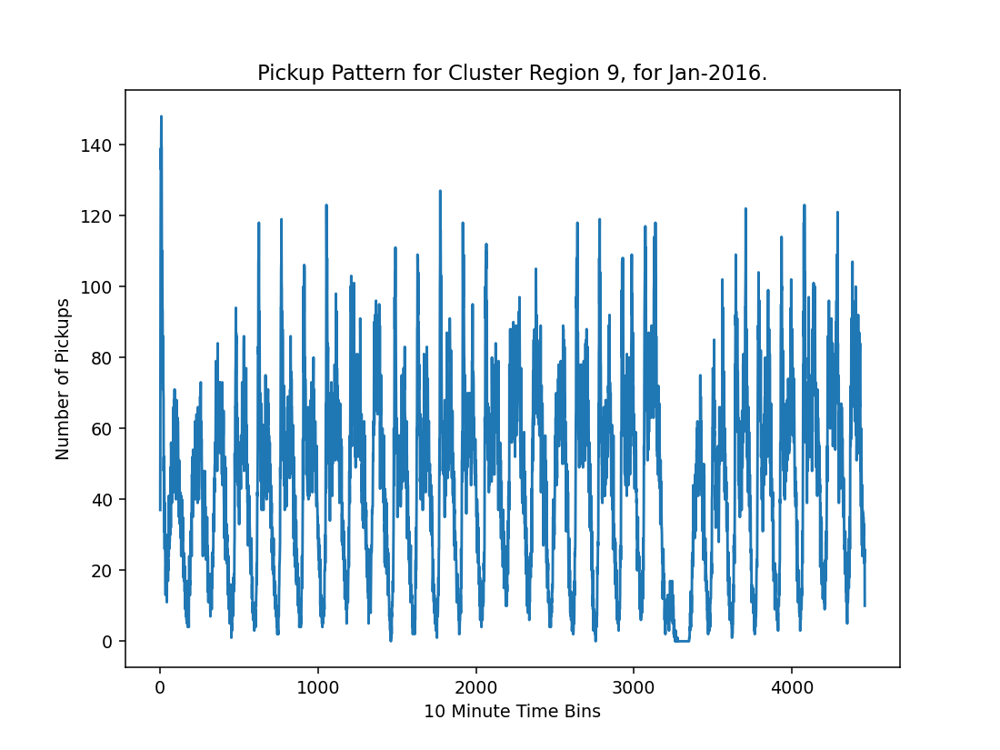

<IPython.core.display.Javascript object>


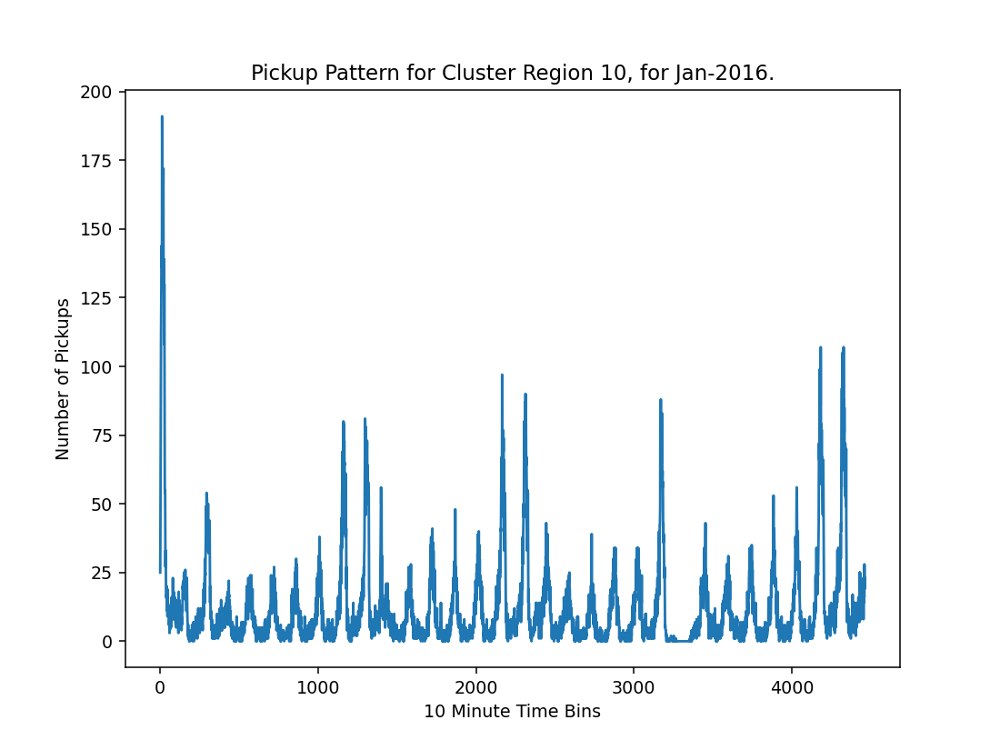

<IPython.core.display.Javascript object>


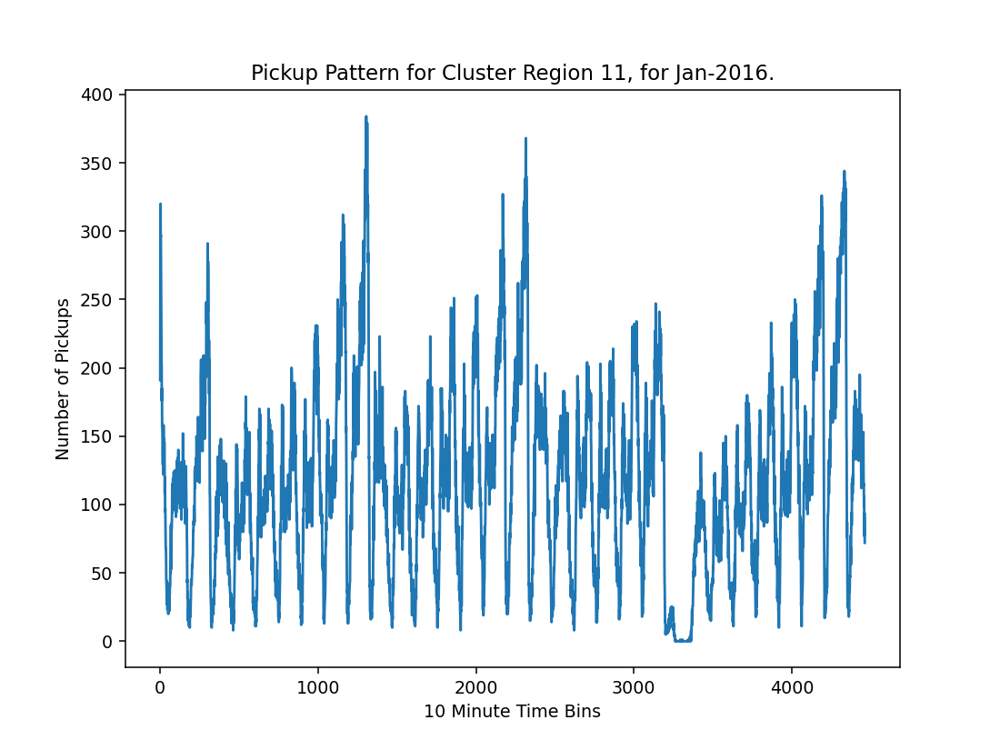

<IPython.core.display.Javascript object>


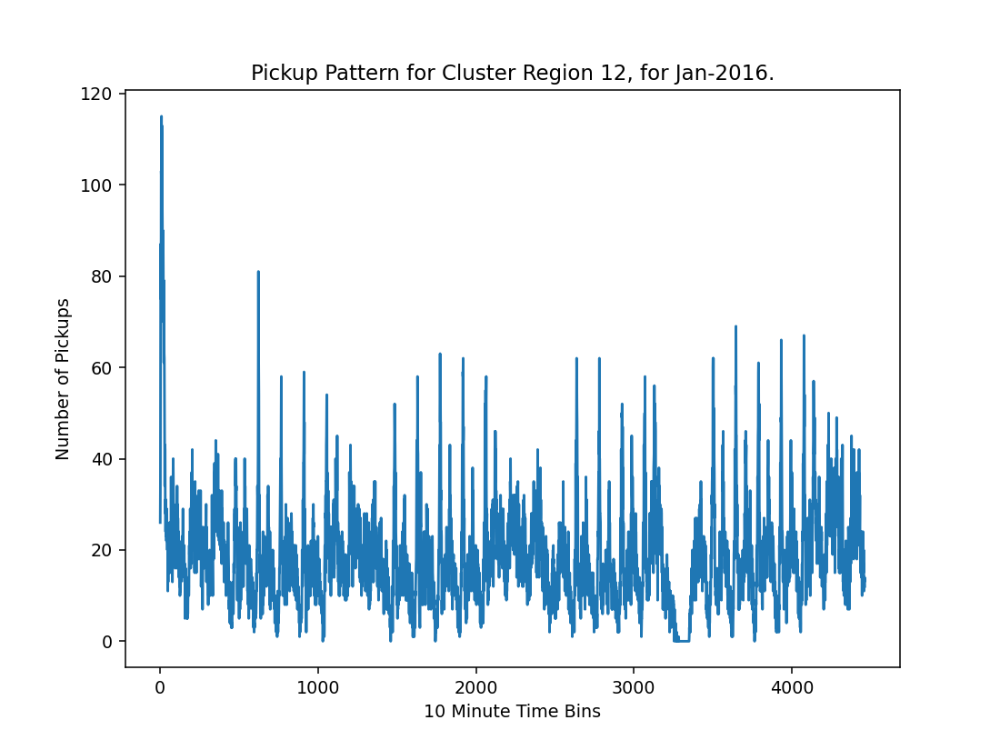

<IPython.core.display.Javascript object>


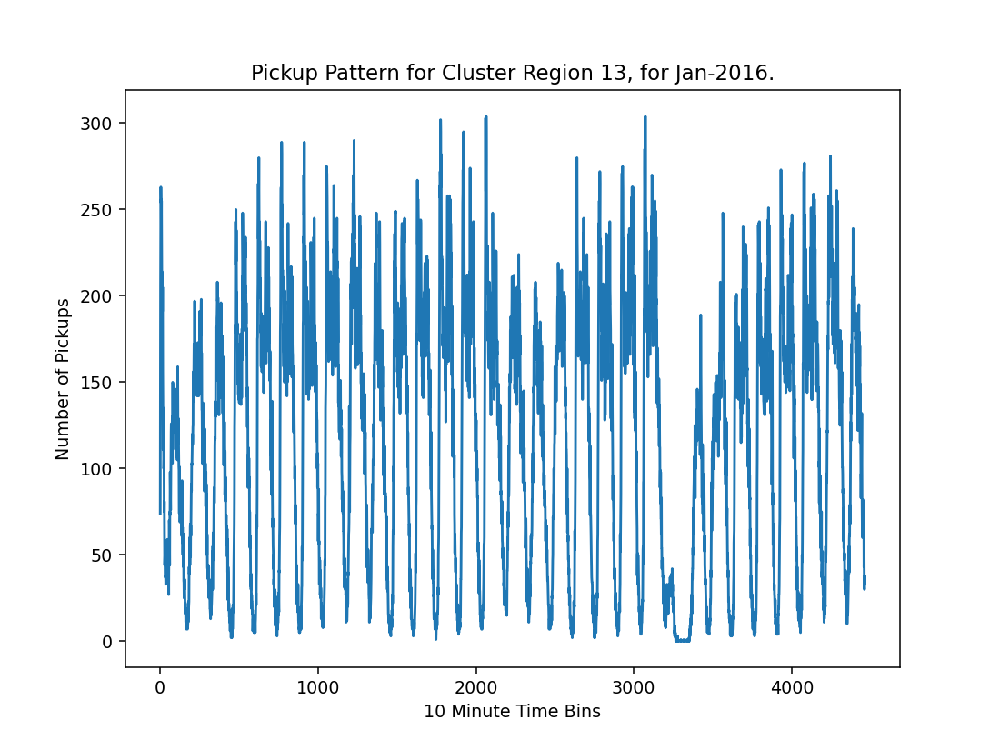

<IPython.core.display.Javascript object>


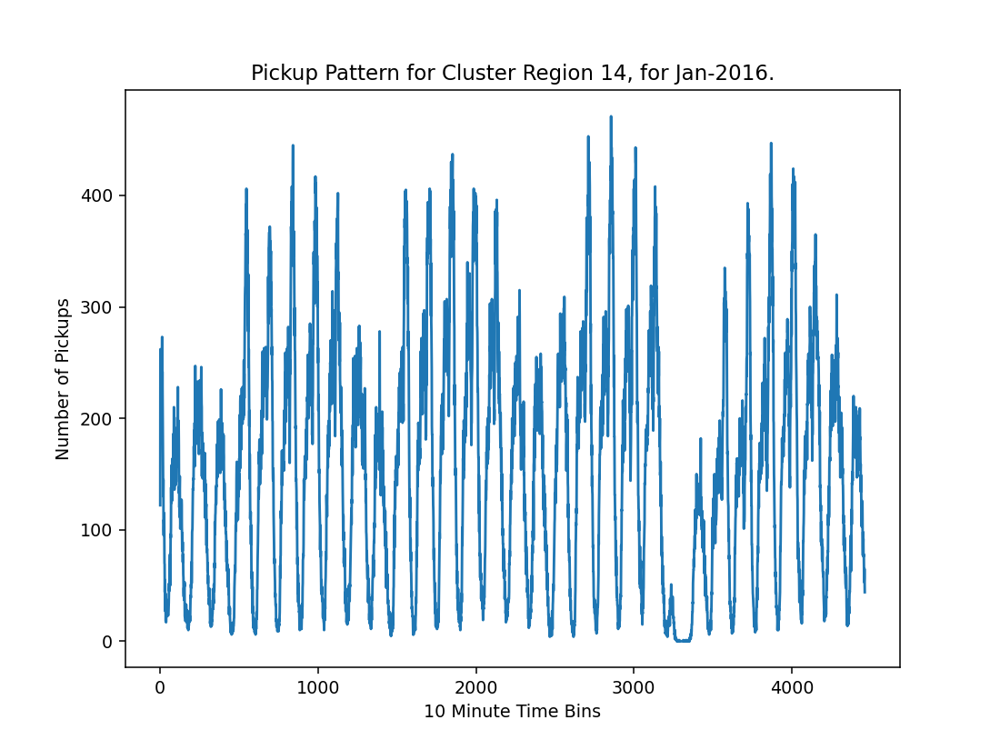

<IPython.core.display.Javascript object>


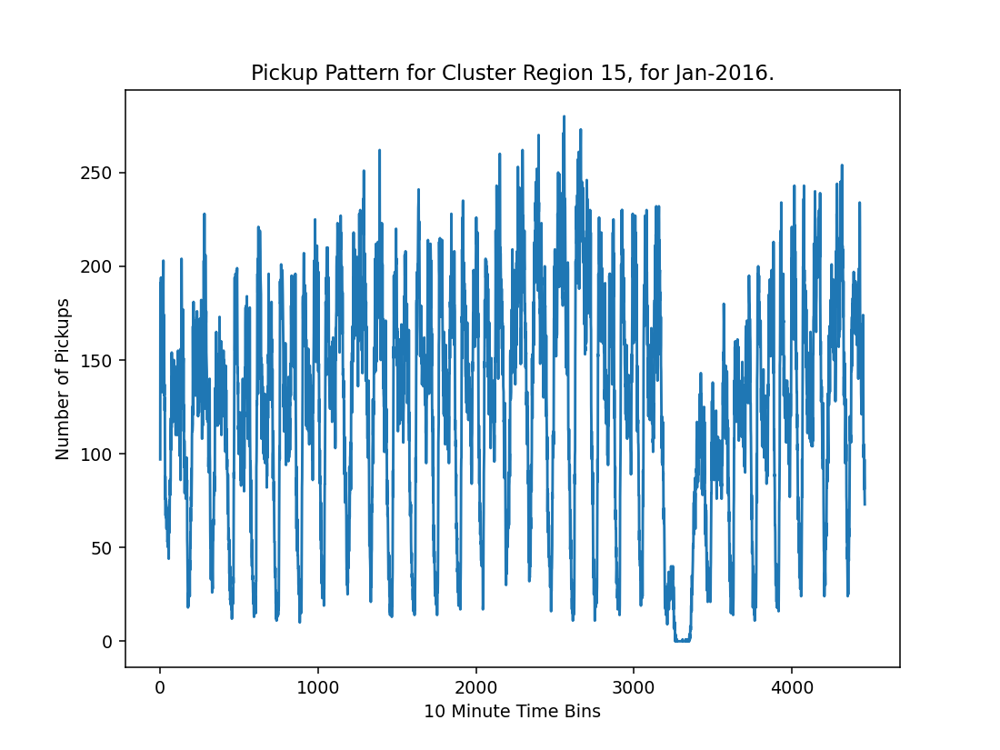

<IPython.core.display.Javascript object>


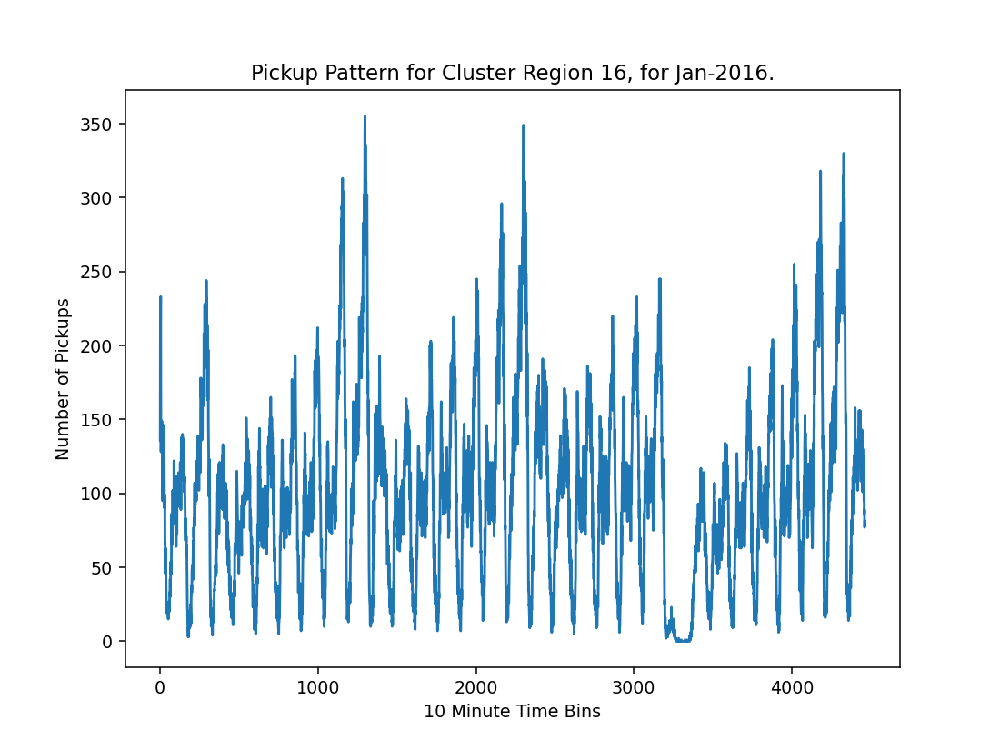

<IPython.core.display.Javascript object>


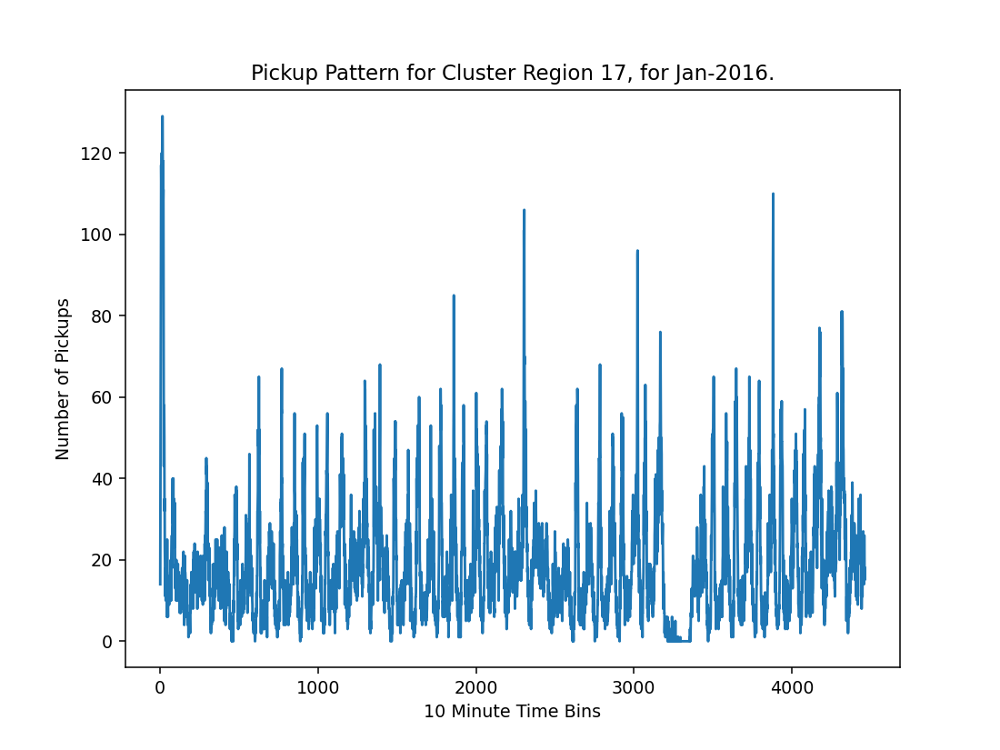

<IPython.core.display.Javascript object>


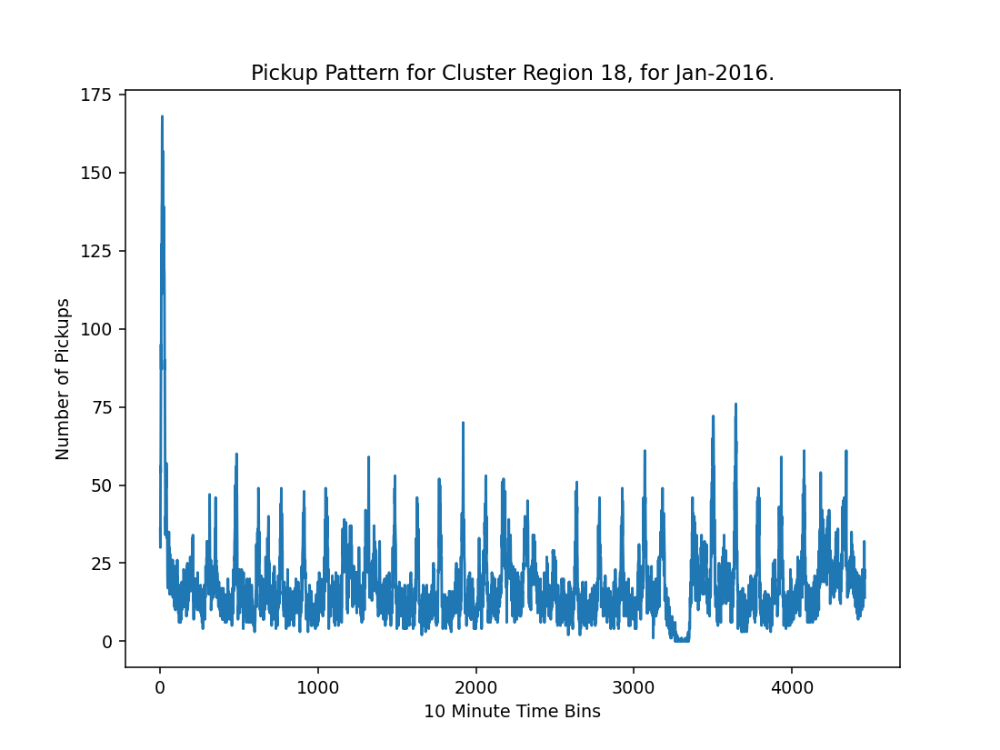

<IPython.core.display.Javascript object>


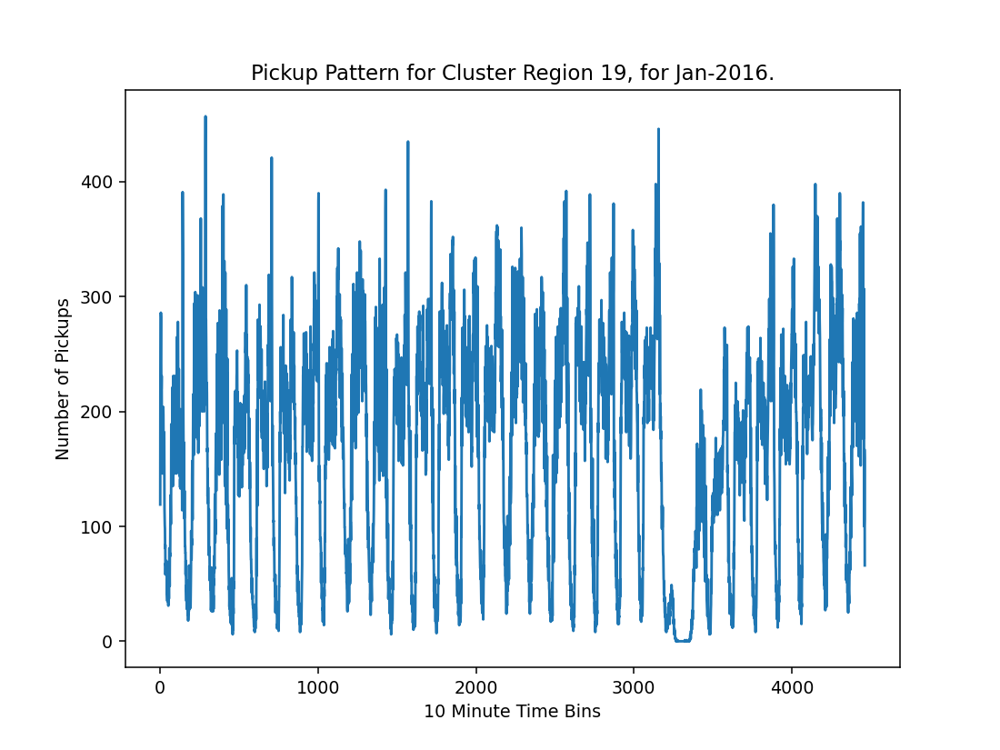

<IPython.core.display.Javascript object>


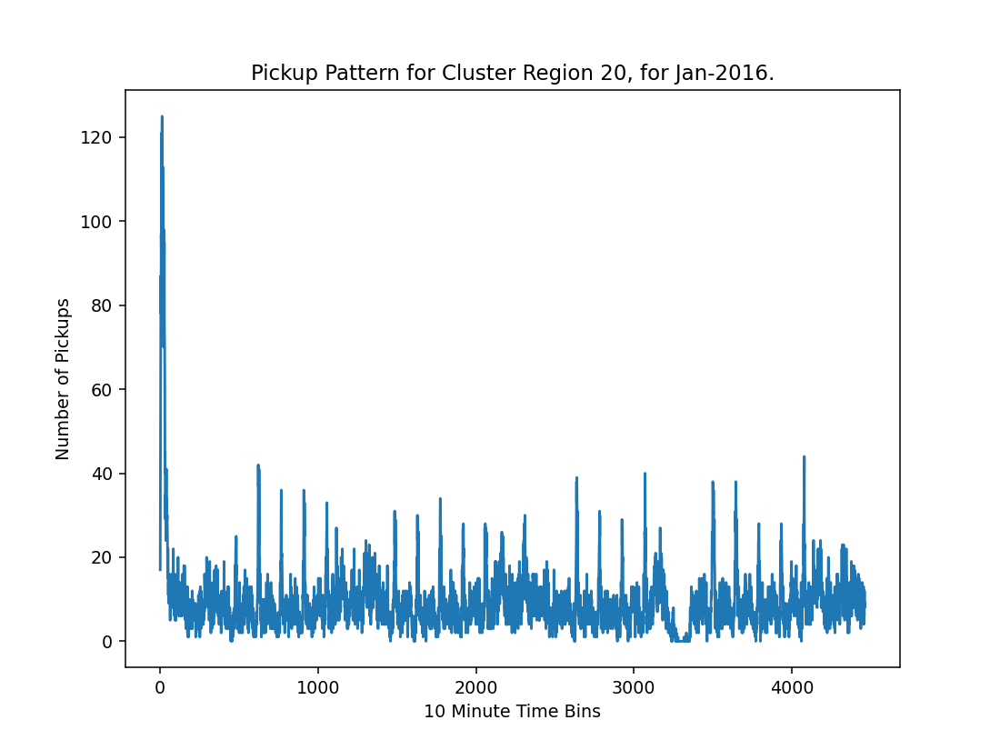

<IPython.core.display.Javascript object>


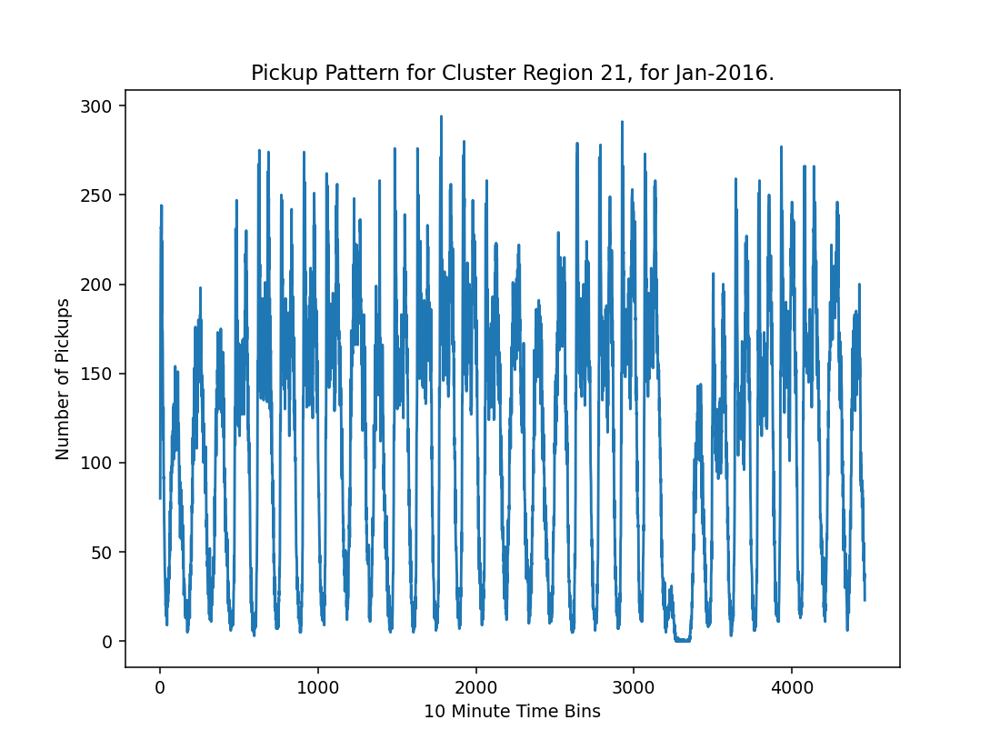

<IPython.core.display.Javascript object>


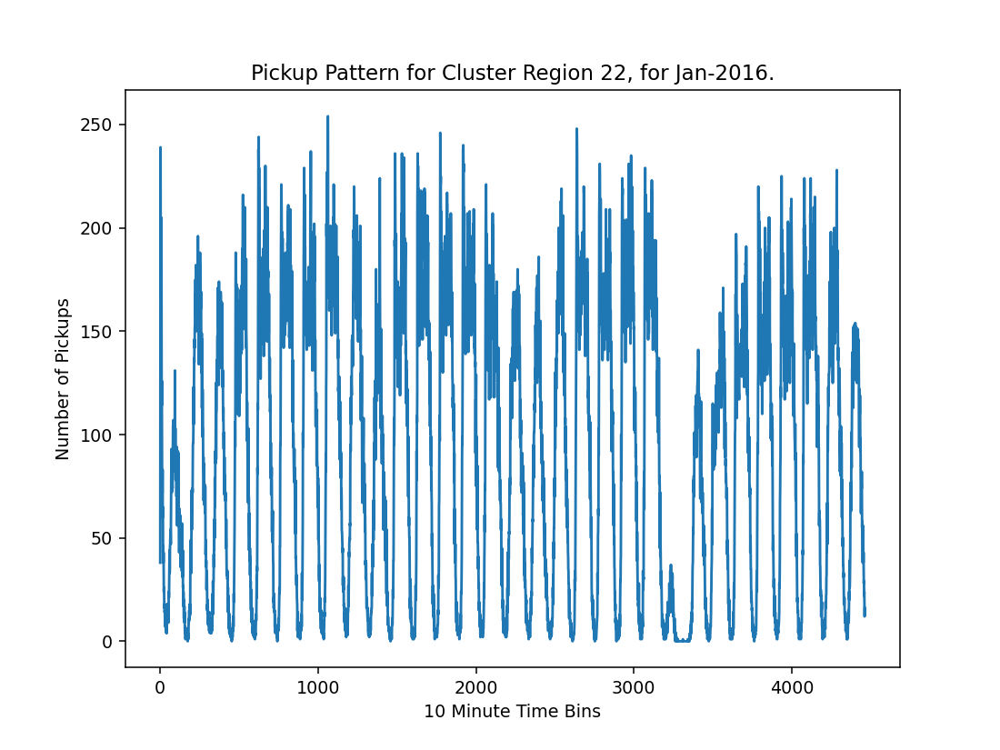

<IPython.core.display.Javascript object>


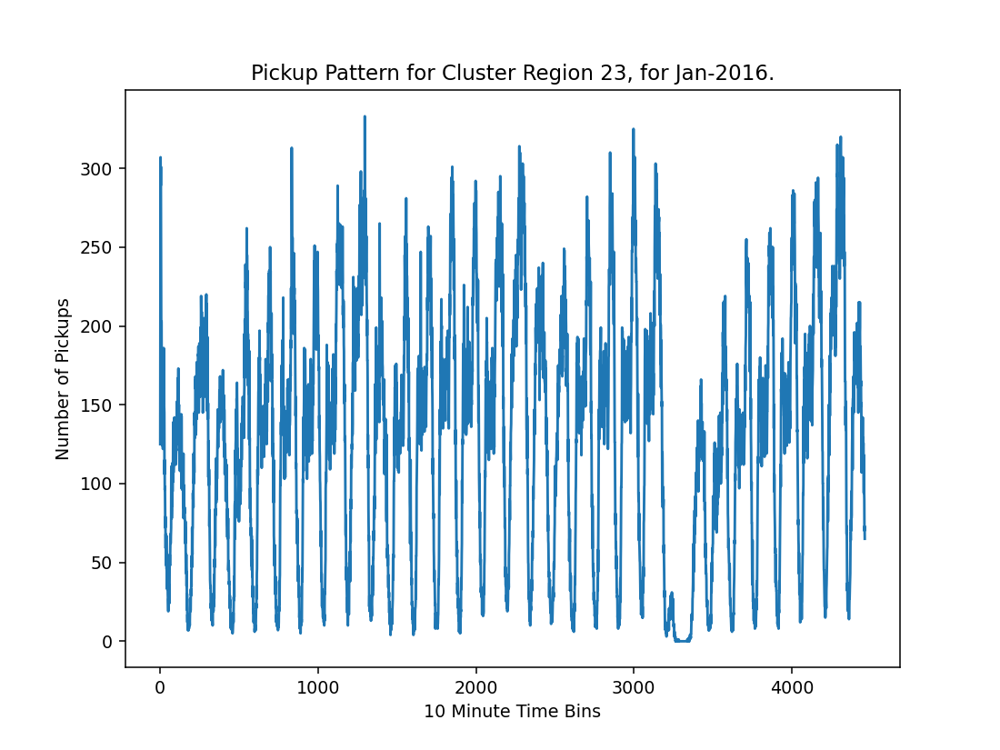

<IPython.core.display.Javascript object>


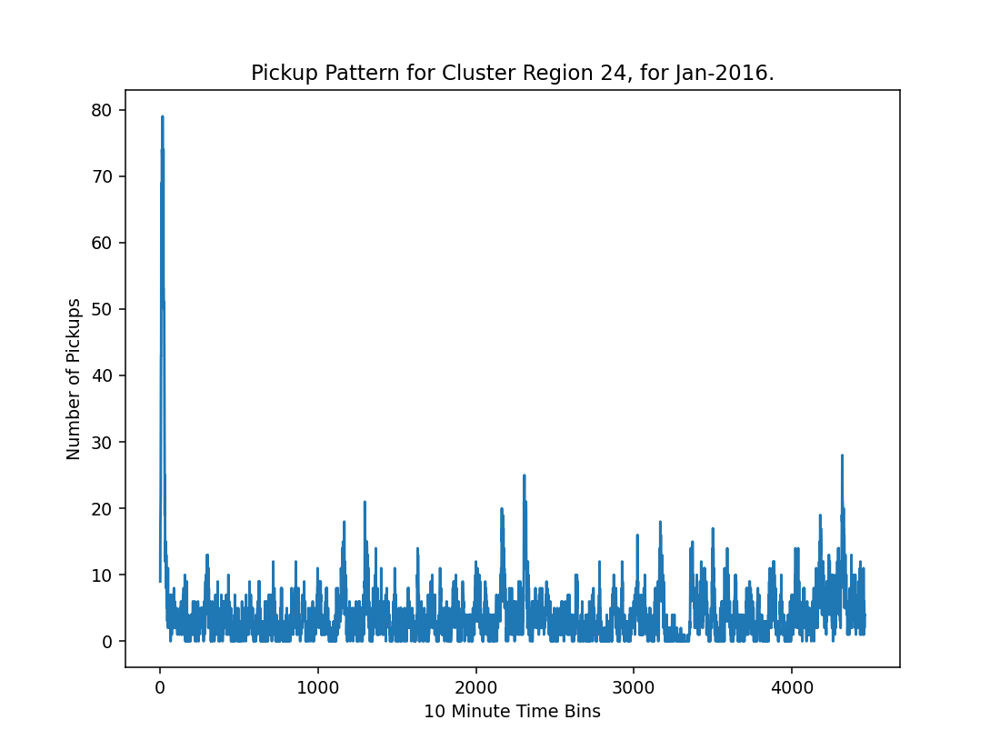

<IPython.core.display.Javascript object>


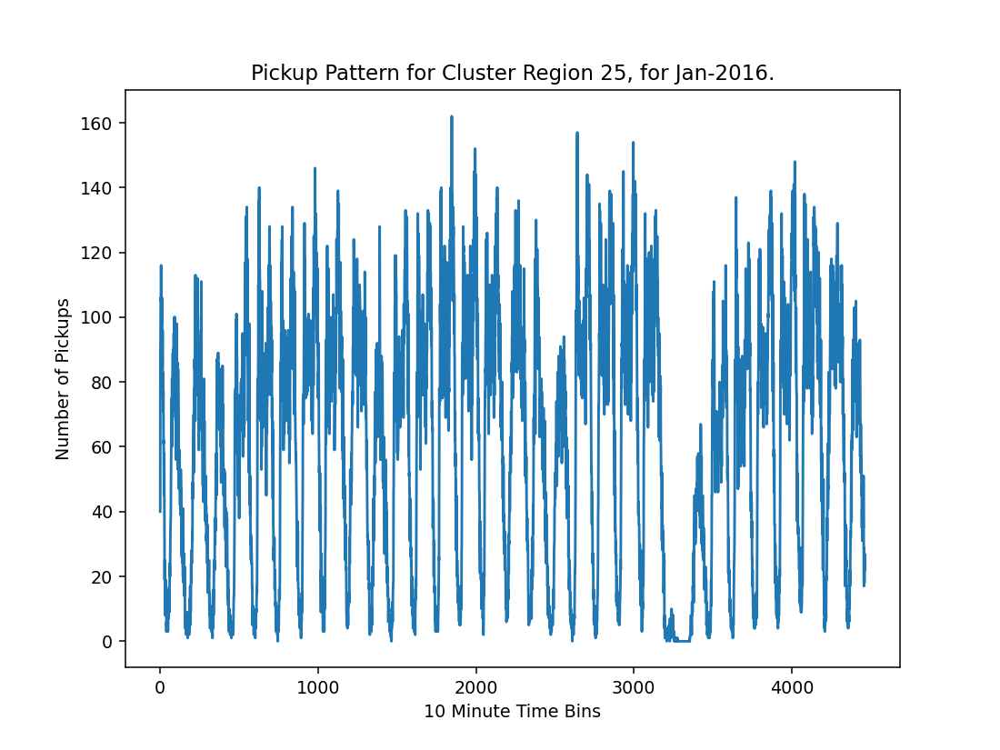

<IPython.core.display.Javascript object>


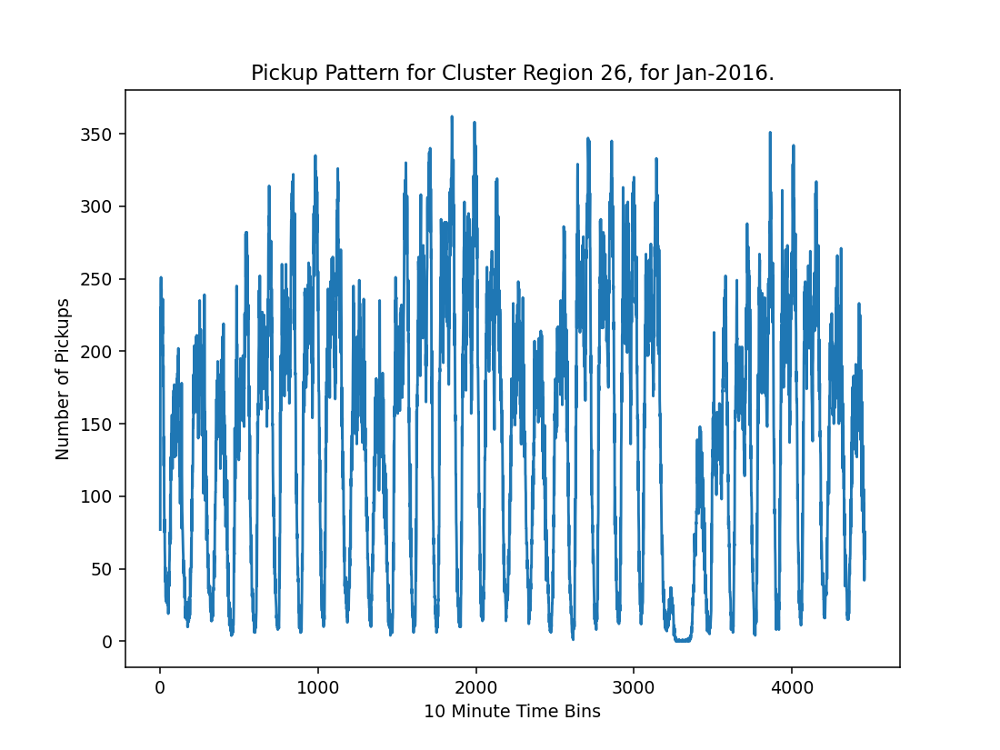

<IPython.core.display.Javascript object>


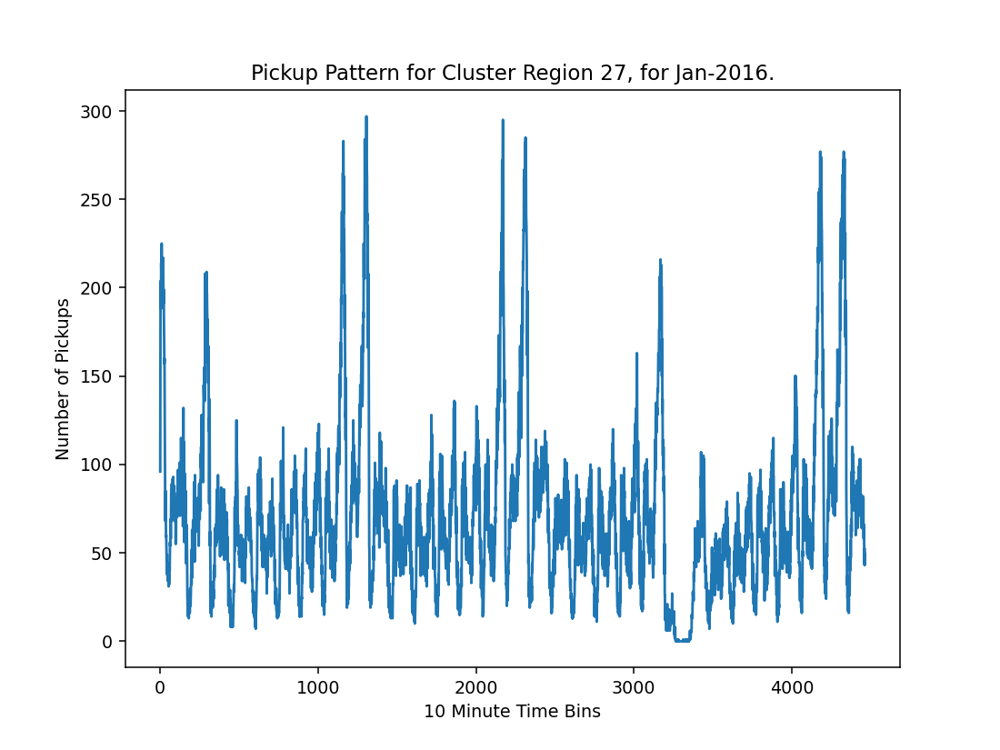

<IPython.core.display.Javascript object>


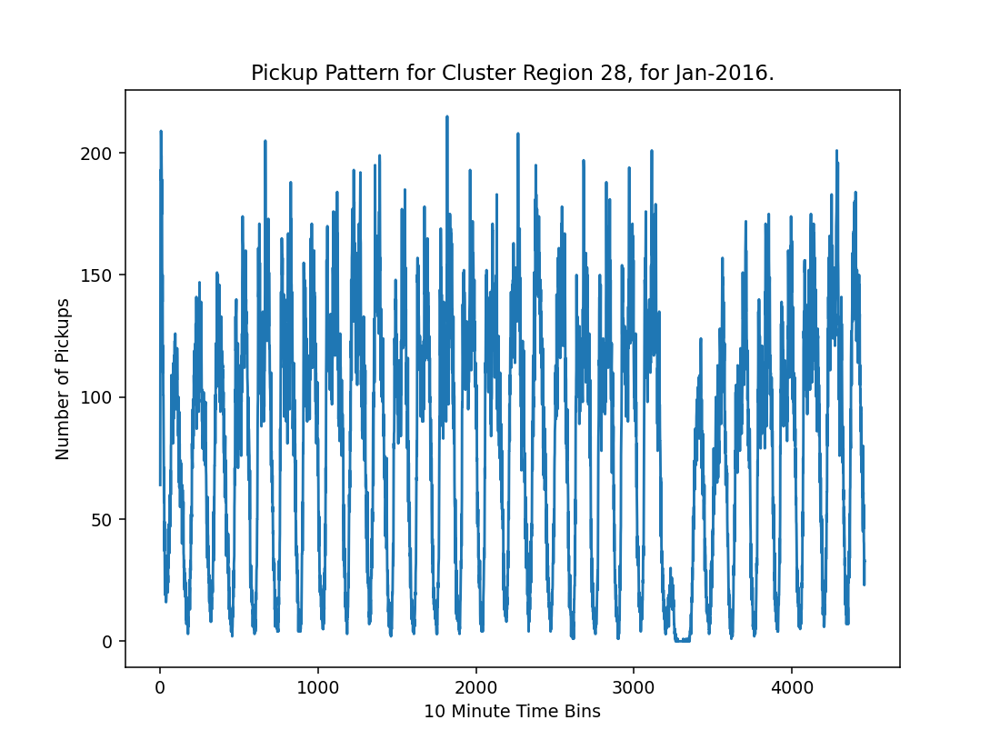

<IPython.core.display.Javascript object>


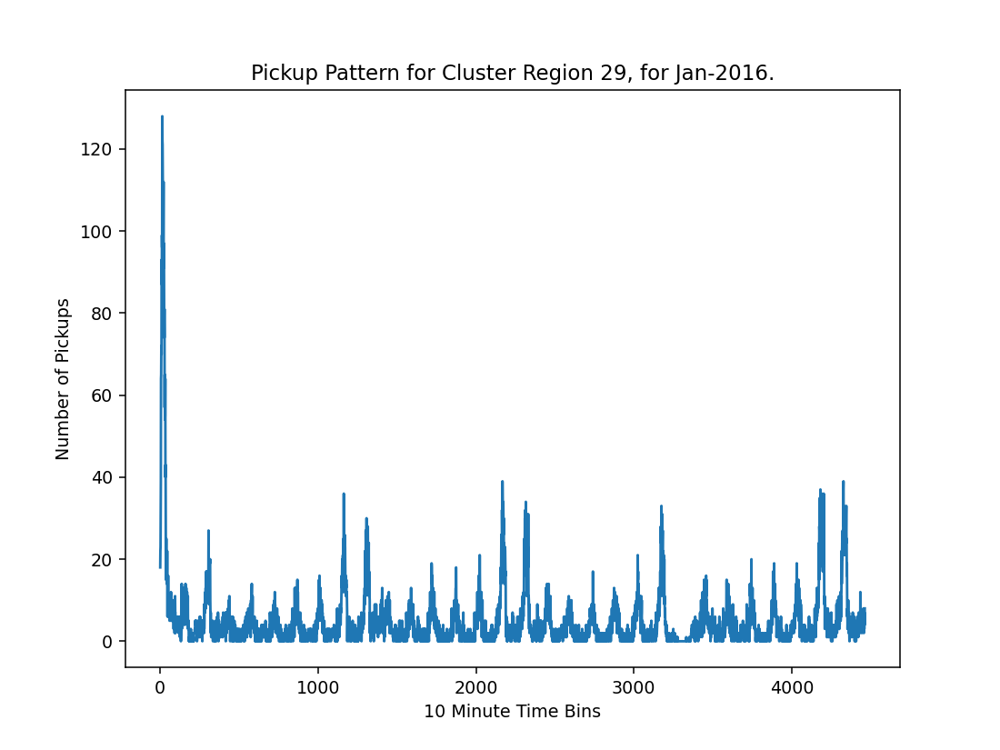

<IPython.core.display.Javascript object>


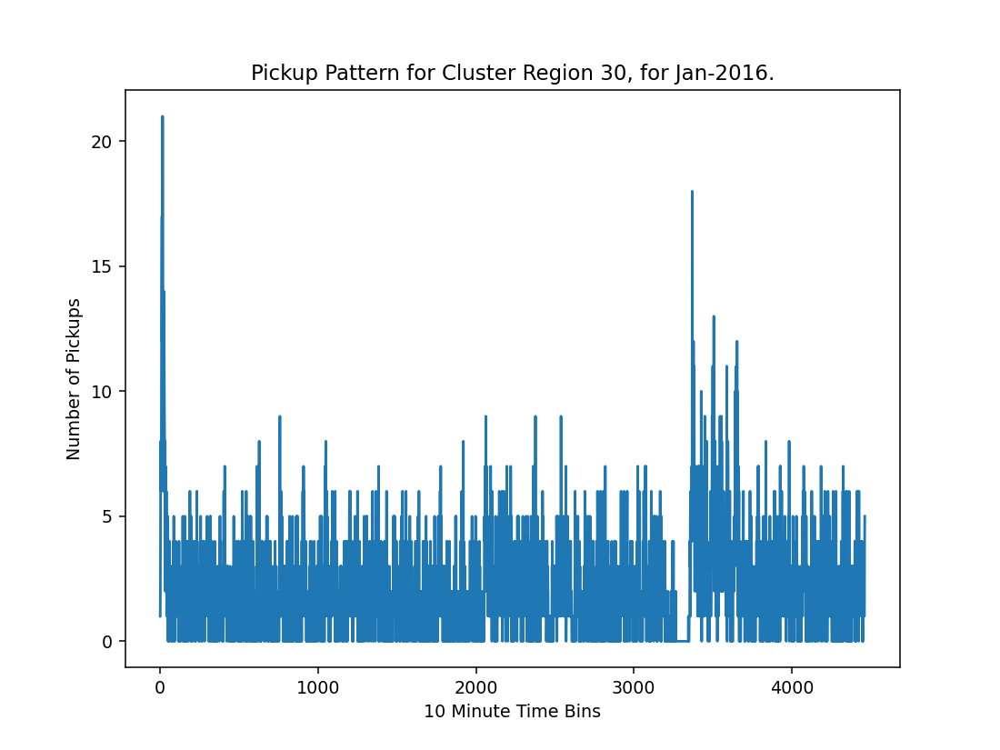

In [51]:
%matplotlib notebook
for i in range(30):
    fig = plt.figure(figsize = (8, 6))
    plt.plot(regionWisePickup_Jan_2016[i][:4464])
    plt.title("Pickup Pattern for Cluster Region "+str(i+1)+", for Jan-2016.")
    plt.xlabel("10 Minute Time Bins")
    plt.ylabel("Number of Pickups")

<b>From the above graphs of pickups of each cluster we can observe that there is a repeating pattern in pickups in 24hrs time period. Now we can decompose these repeating waves by using fourier transform and use their frequencies and their corresponding amplitudes as features in our data.</b>

<IPython.core.display.Javascript object>


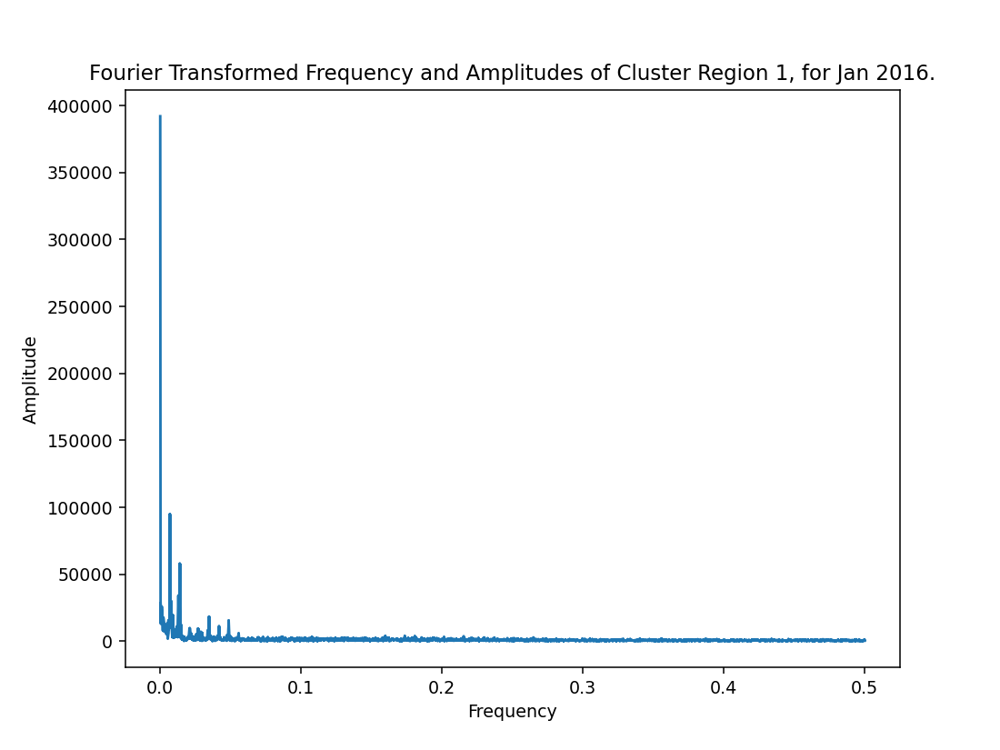

<IPython.core.display.Javascript object>


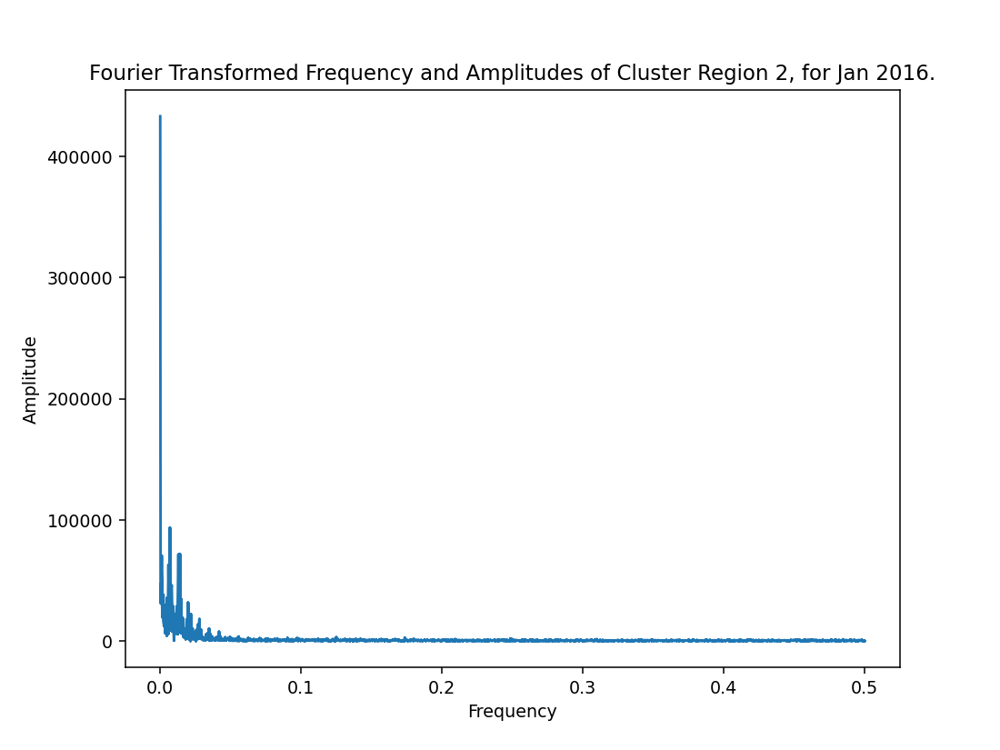

<IPython.core.display.Javascript object>


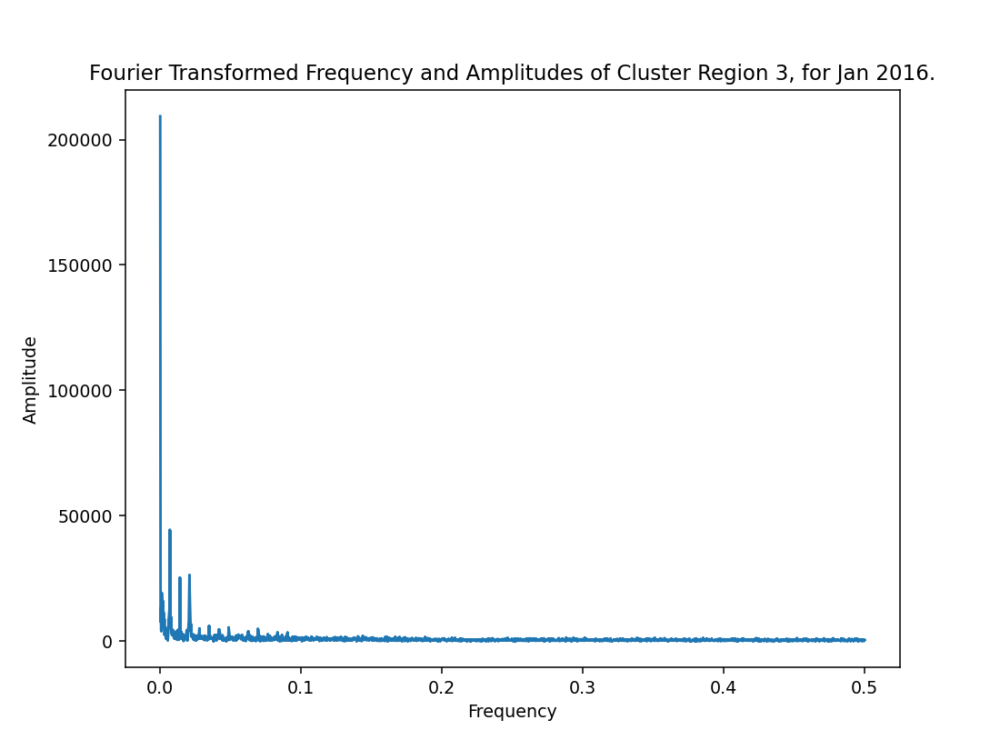

<IPython.core.display.Javascript object>


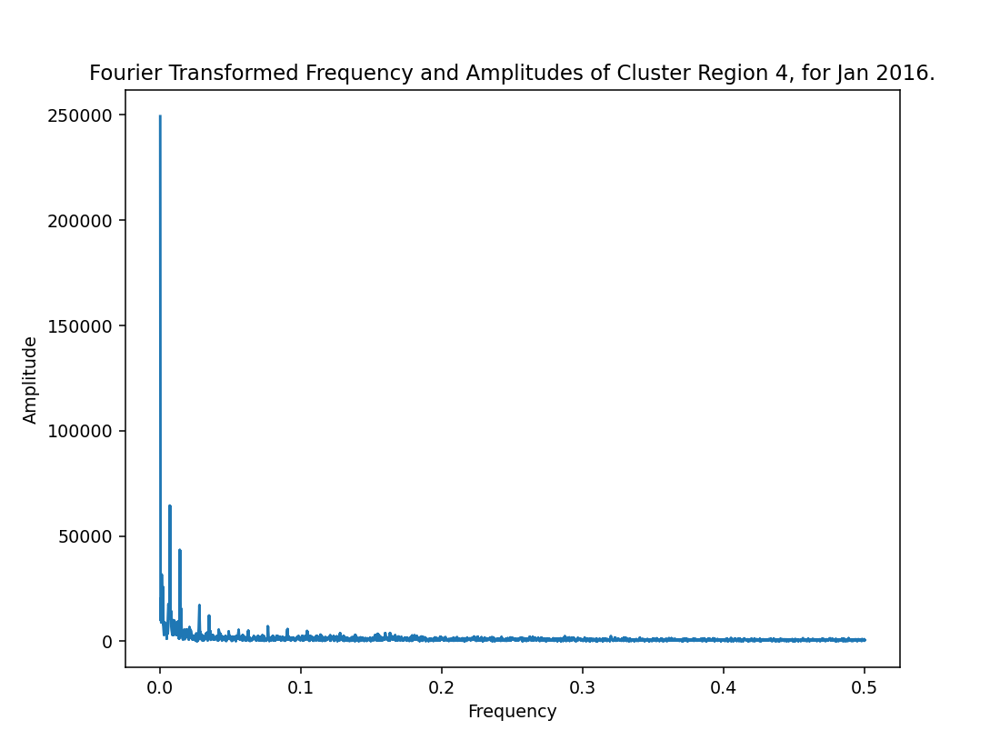

<IPython.core.display.Javascript object>


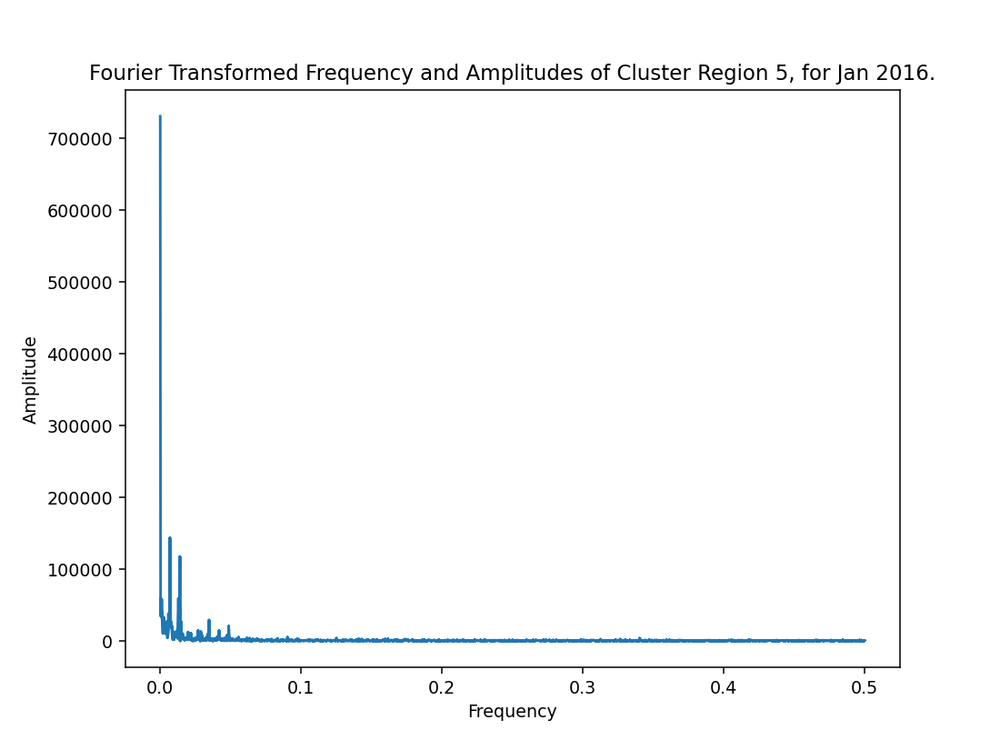

<IPython.core.display.Javascript object>


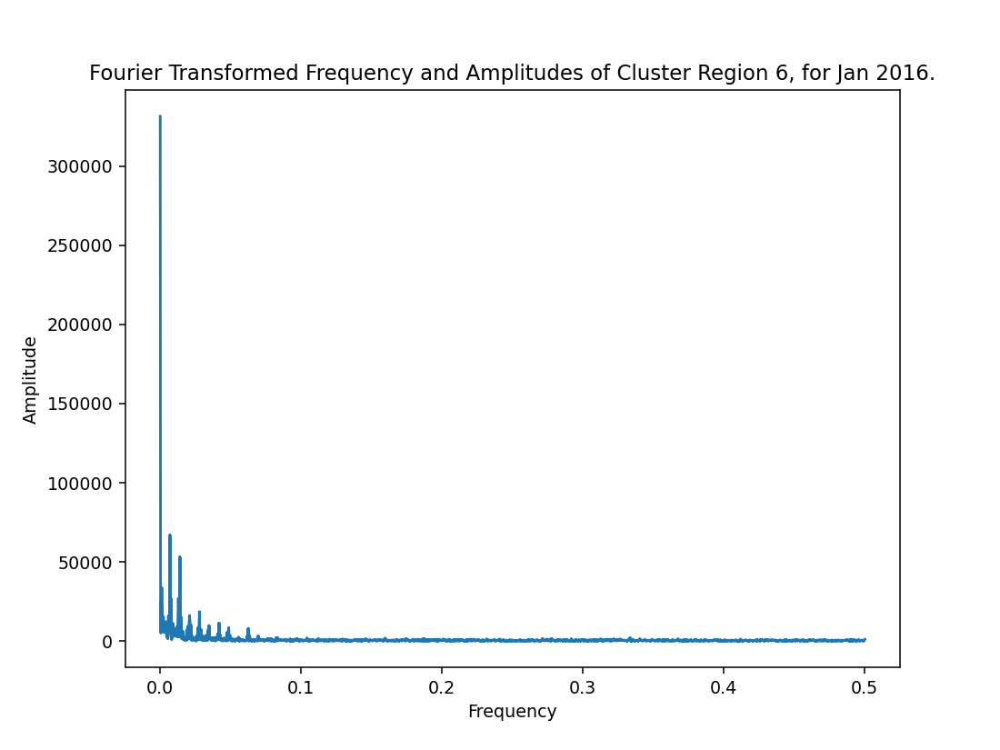

<IPython.core.display.Javascript object>


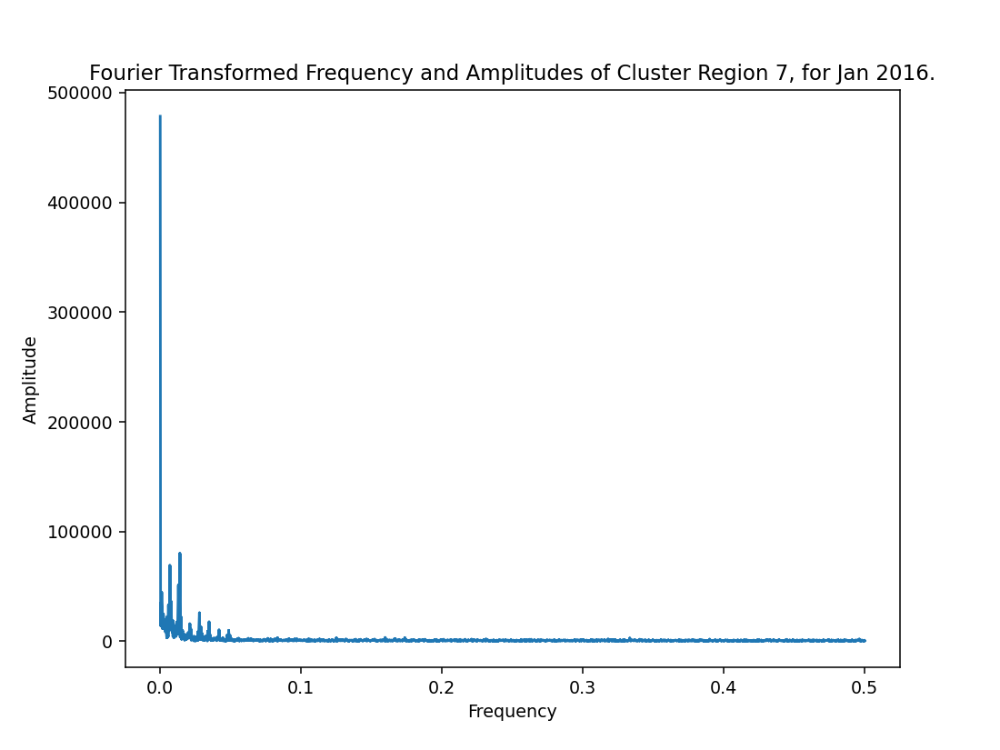

<IPython.core.display.Javascript object>


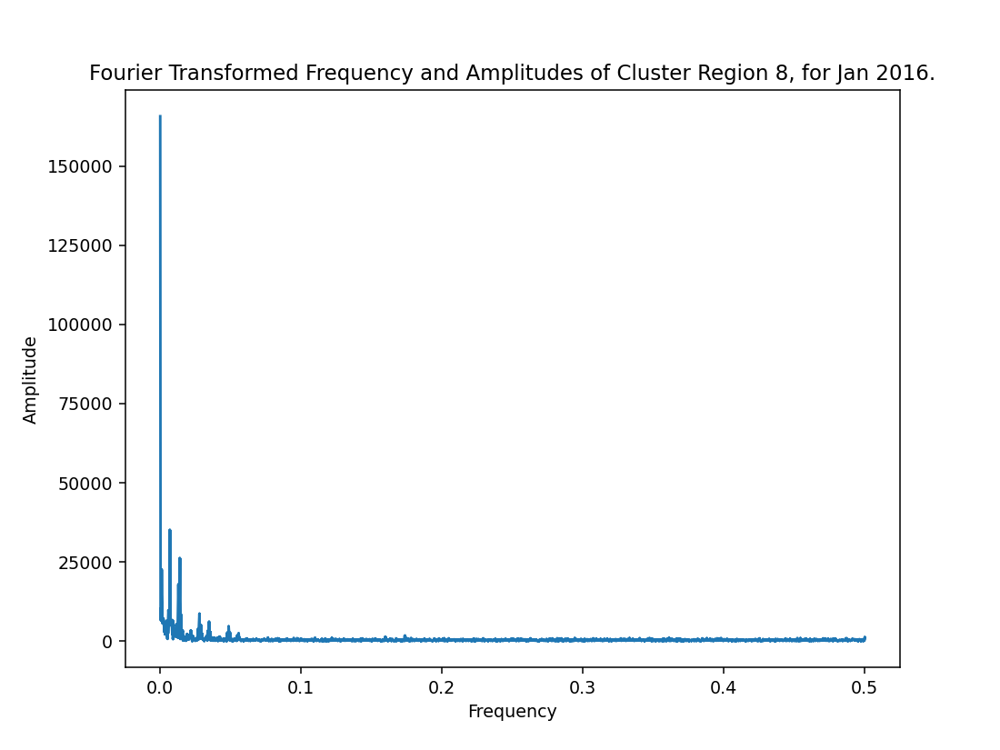

<IPython.core.display.Javascript object>


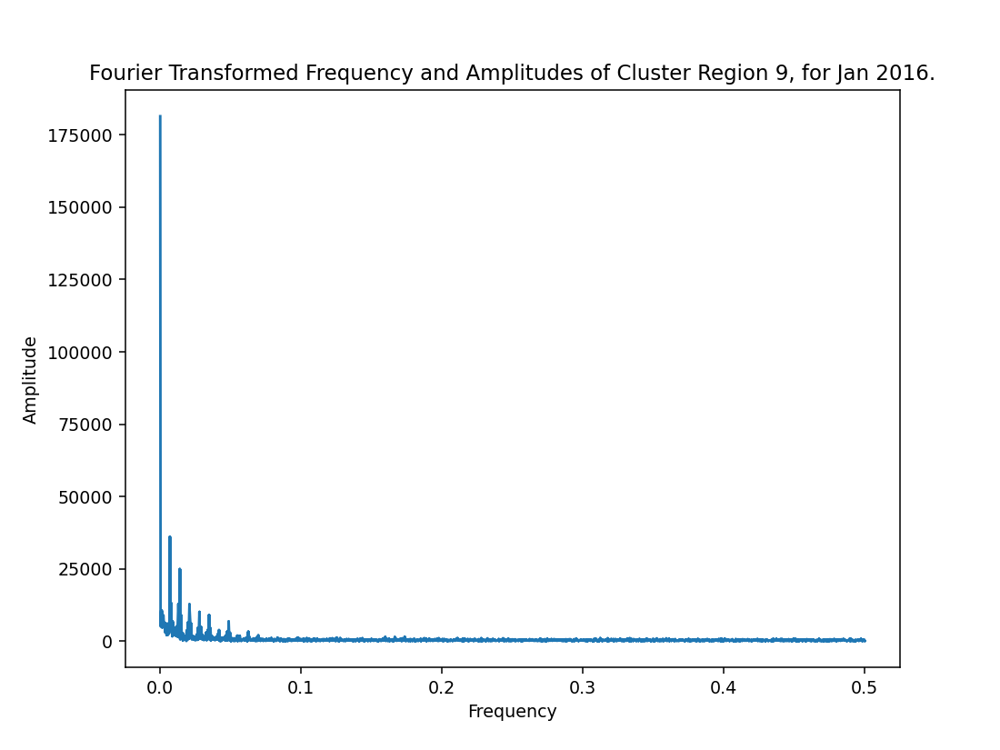

<IPython.core.display.Javascript object>


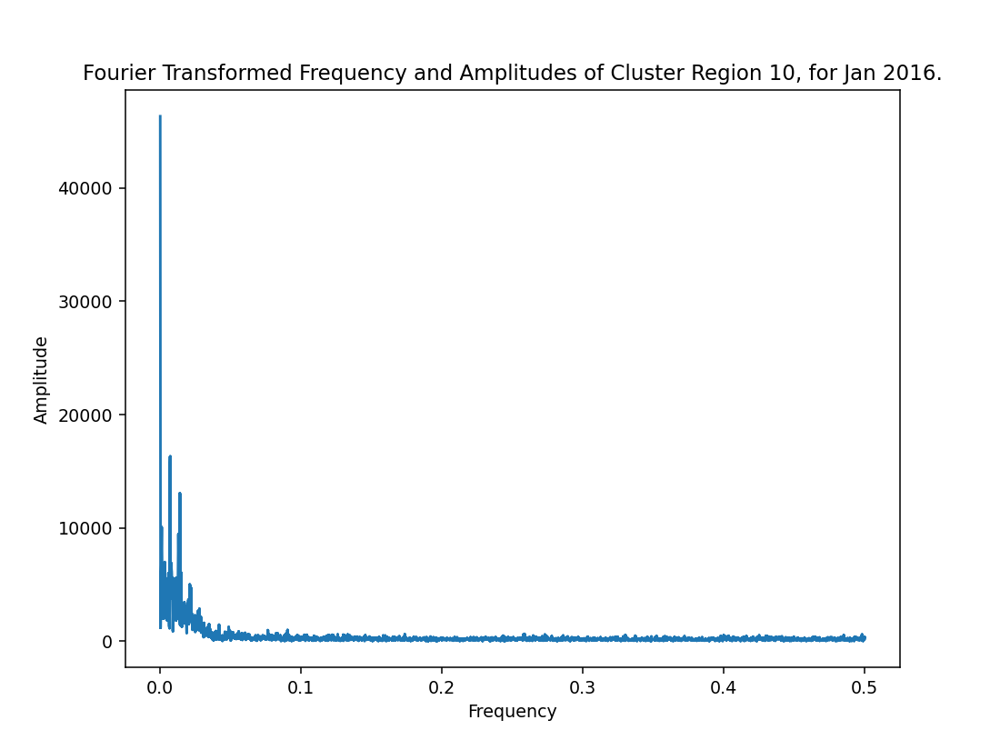

<IPython.core.display.Javascript object>


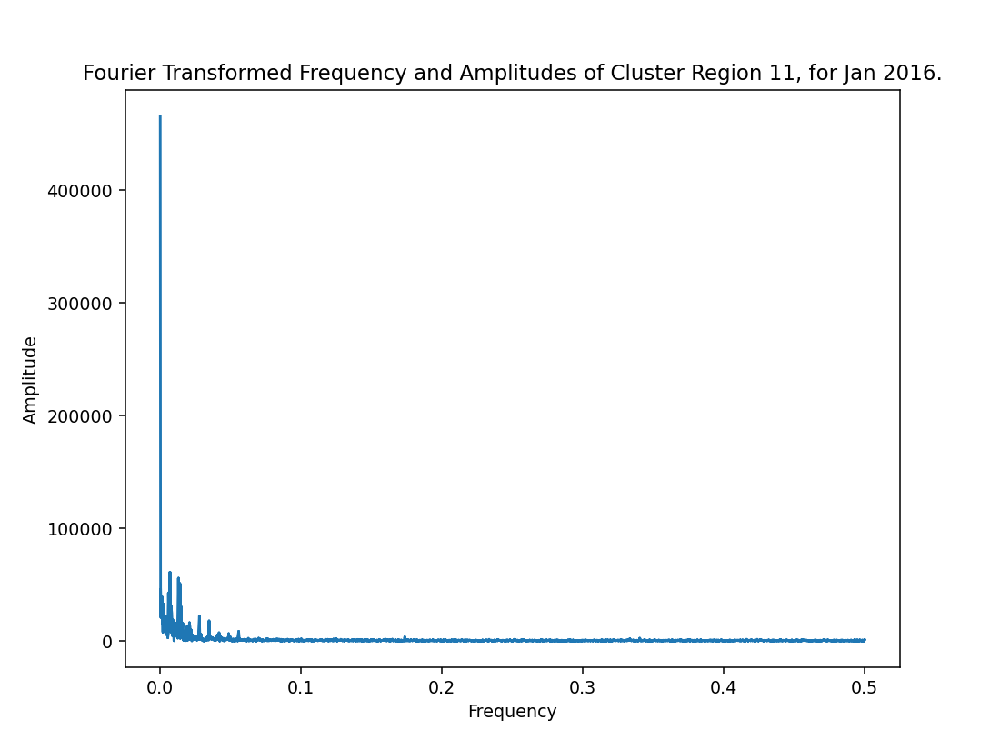

<IPython.core.display.Javascript object>


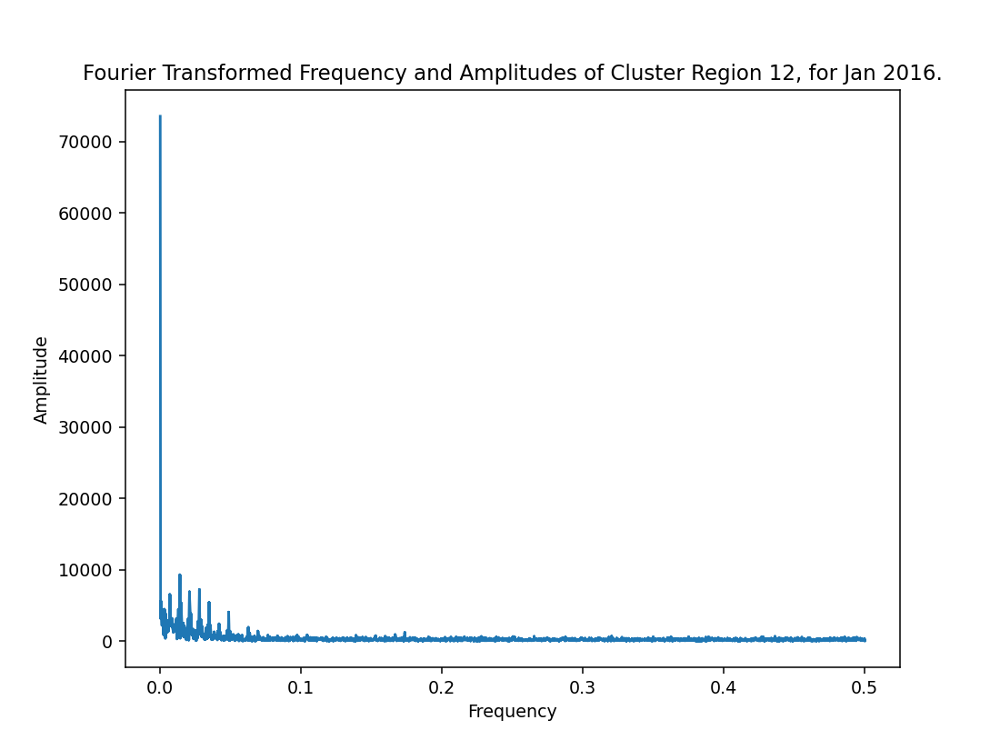

<IPython.core.display.Javascript object>


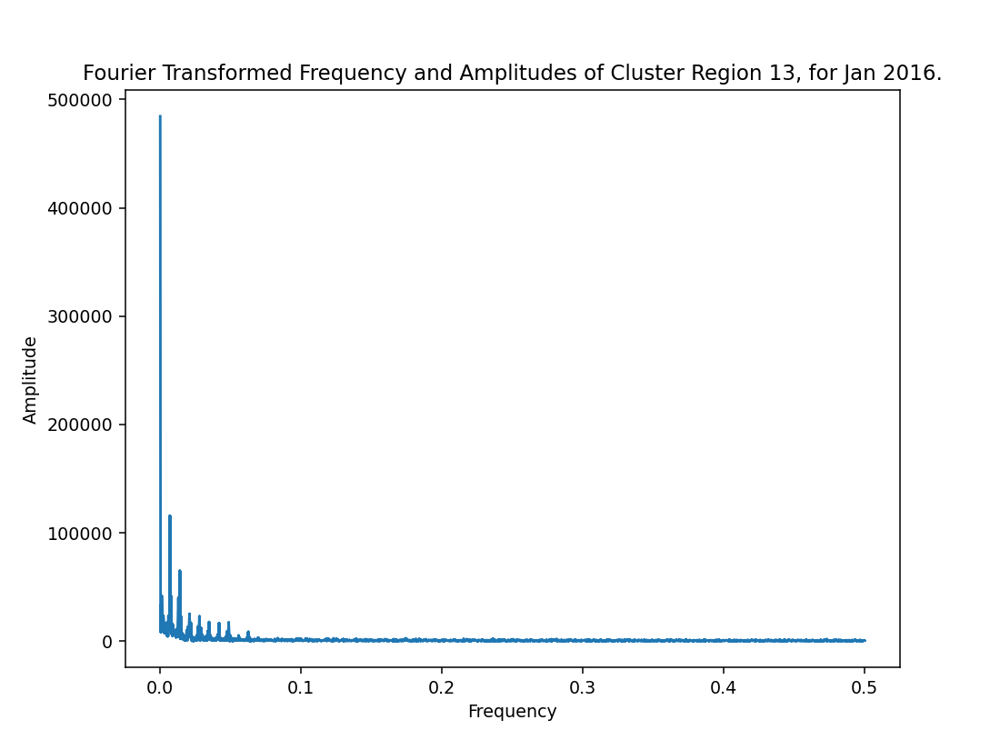

<IPython.core.display.Javascript object>


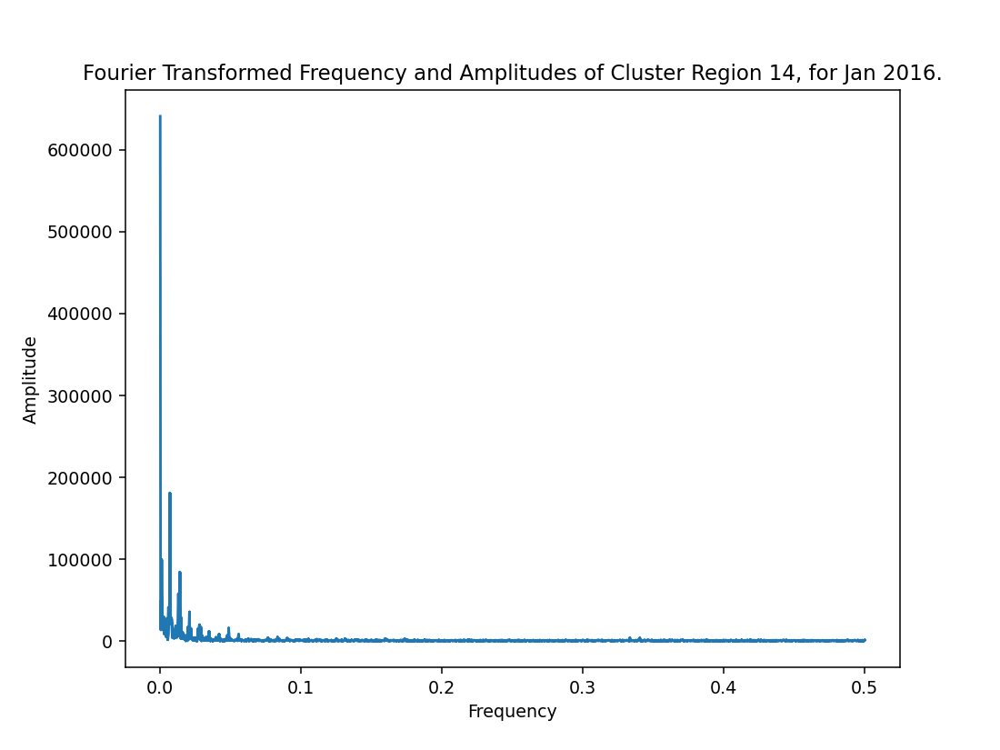

<IPython.core.display.Javascript object>


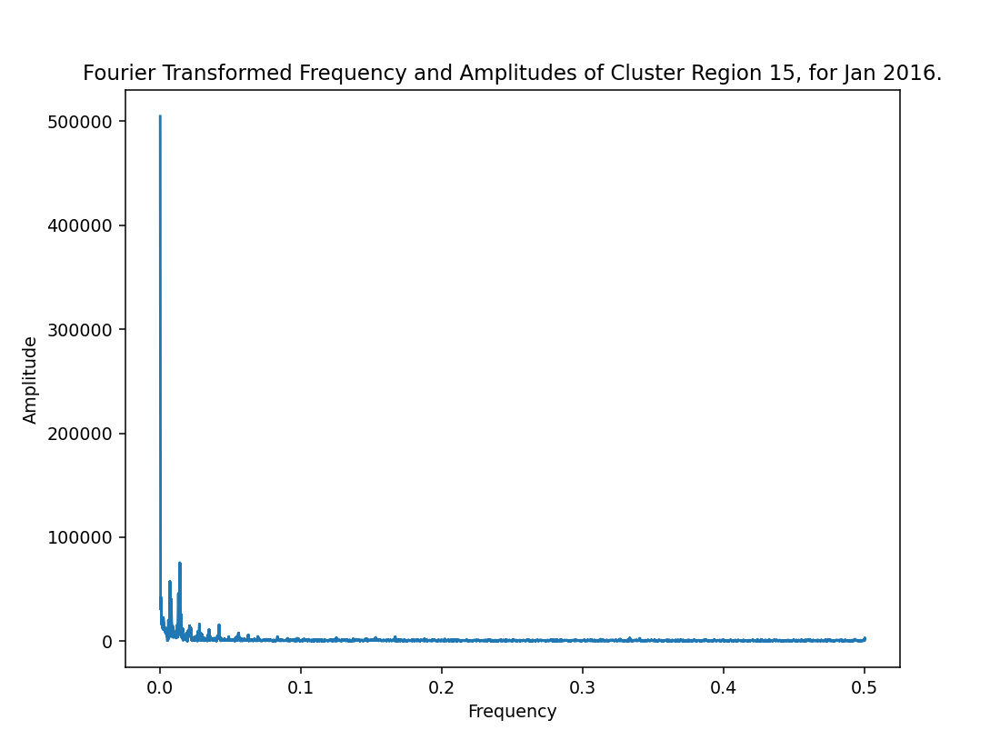

<IPython.core.display.Javascript object>


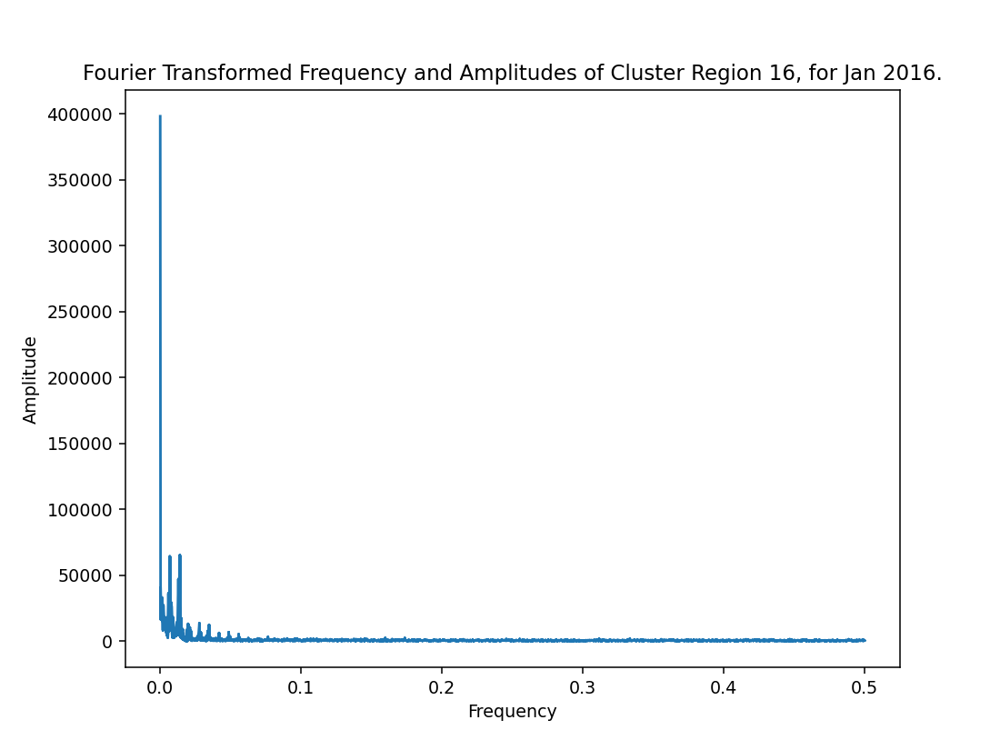

<IPython.core.display.Javascript object>


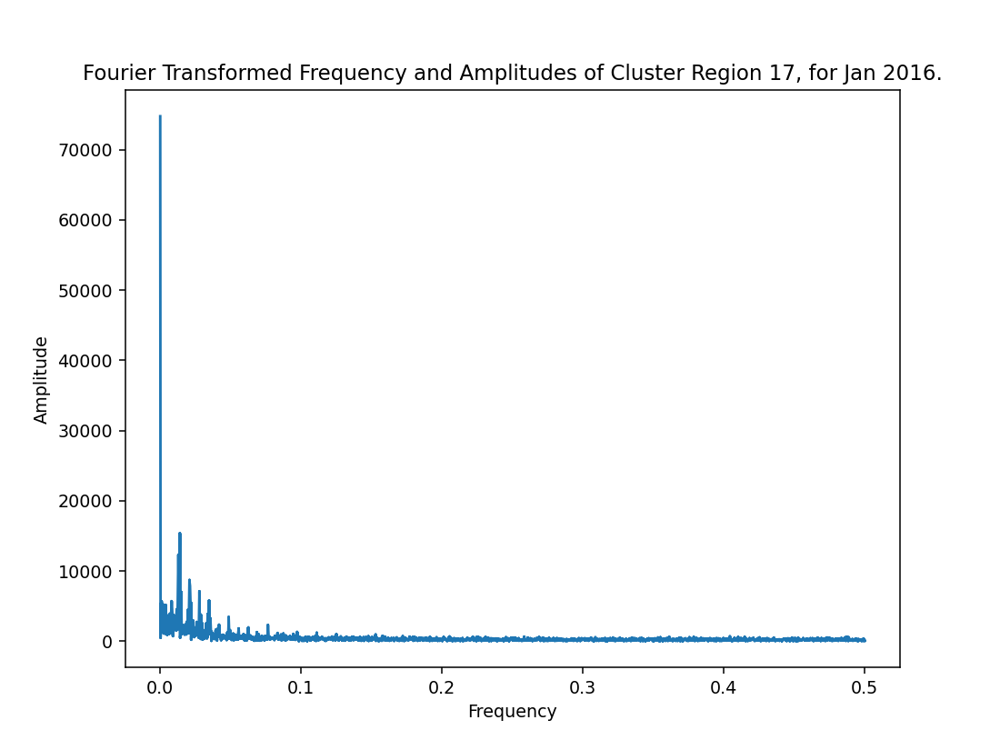

<IPython.core.display.Javascript object>


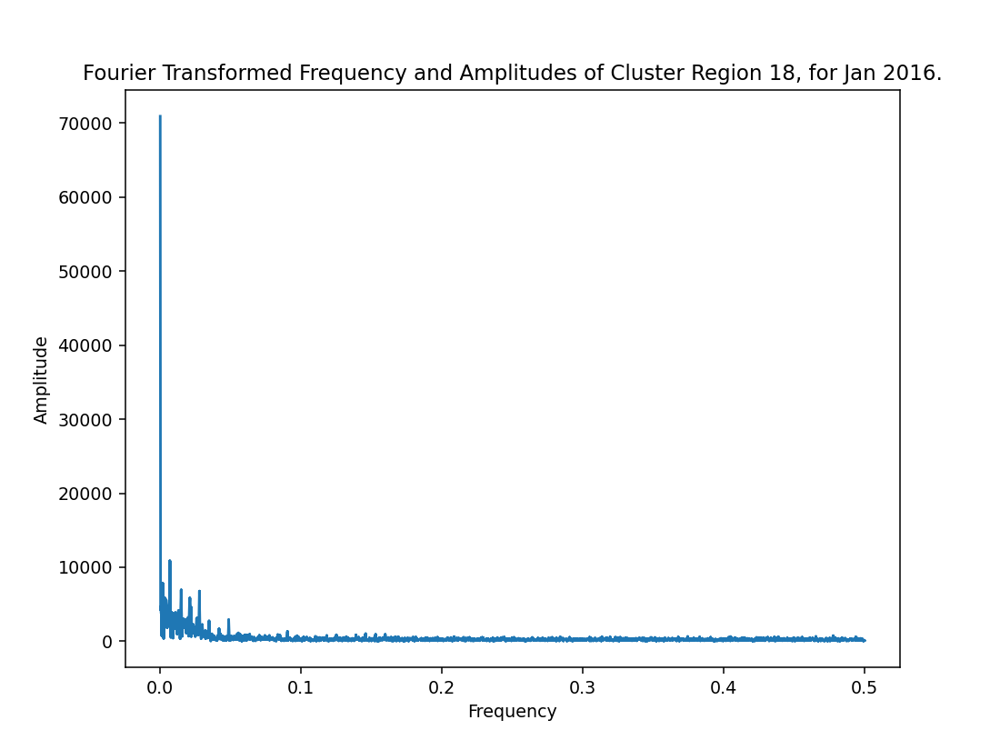

<IPython.core.display.Javascript object>


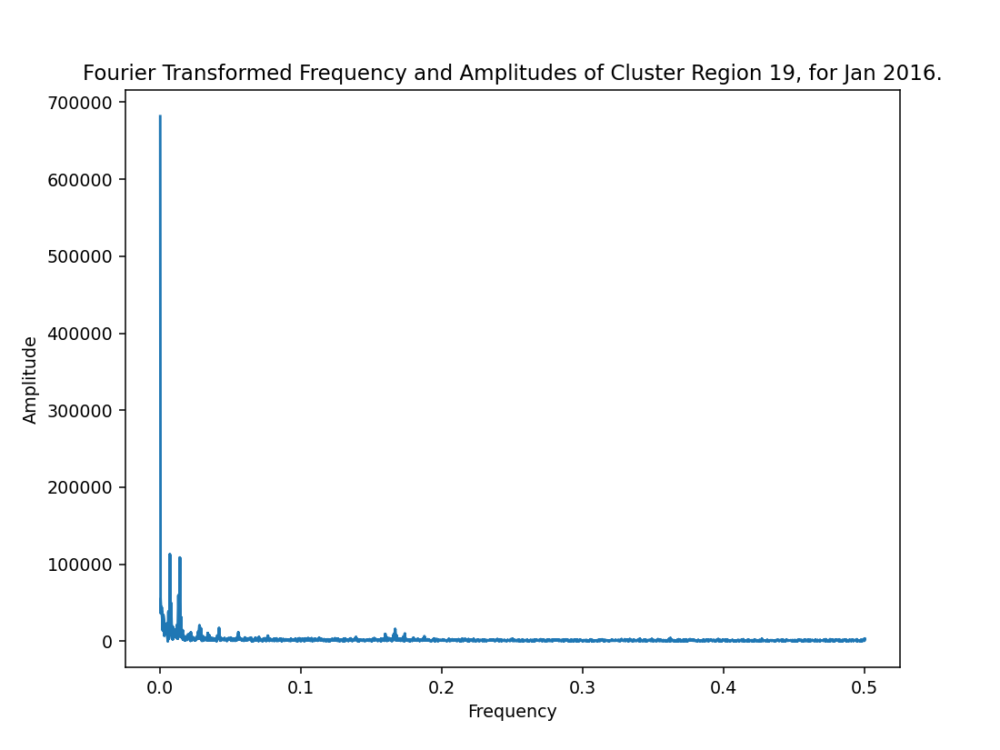

<IPython.core.display.Javascript object>


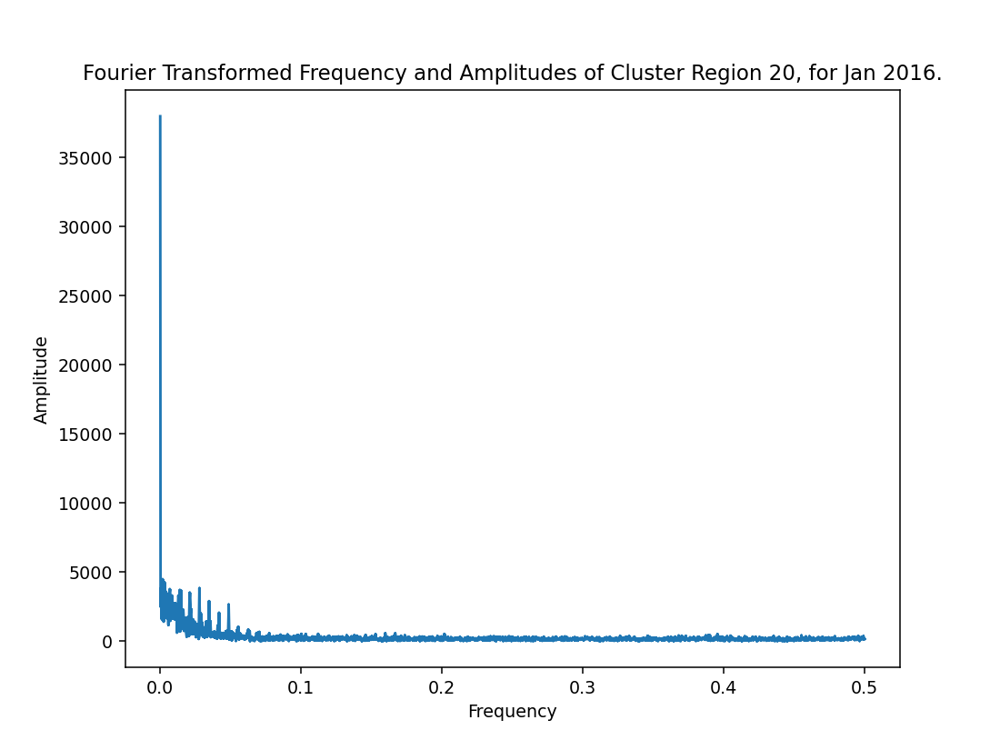

<IPython.core.display.Javascript object>


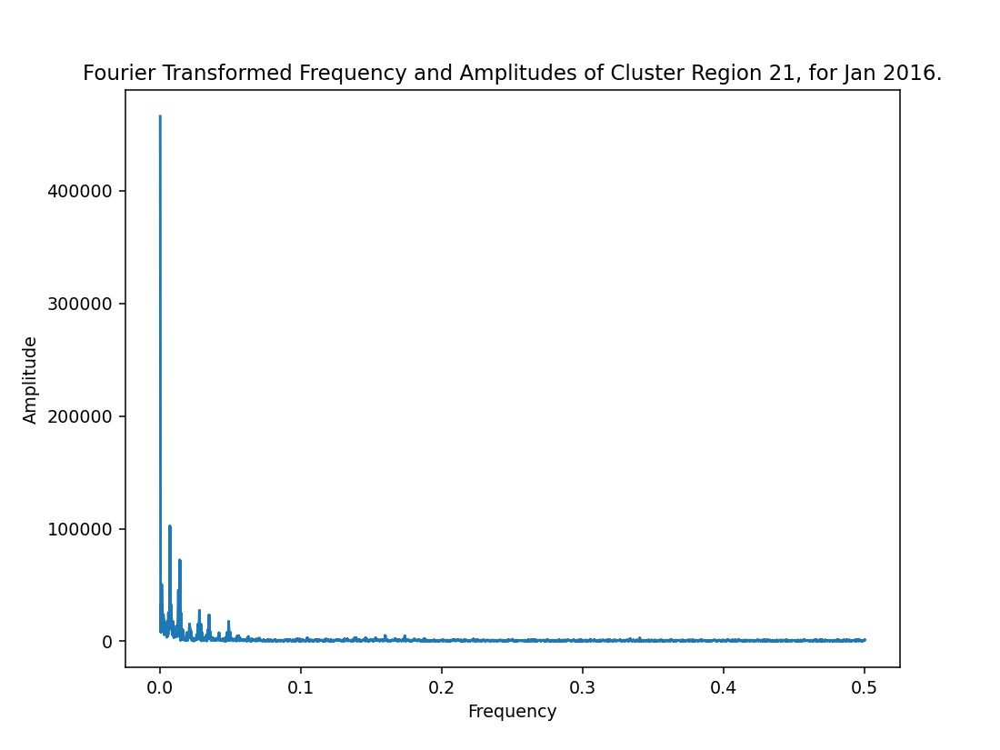

<IPython.core.display.Javascript object>


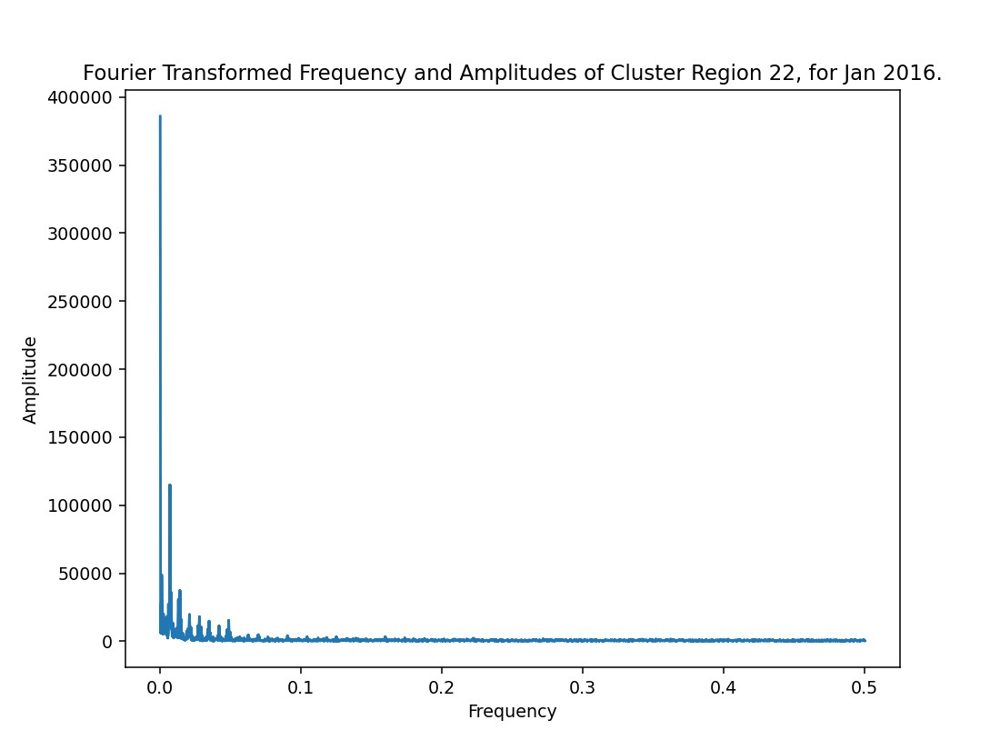

<IPython.core.display.Javascript object>


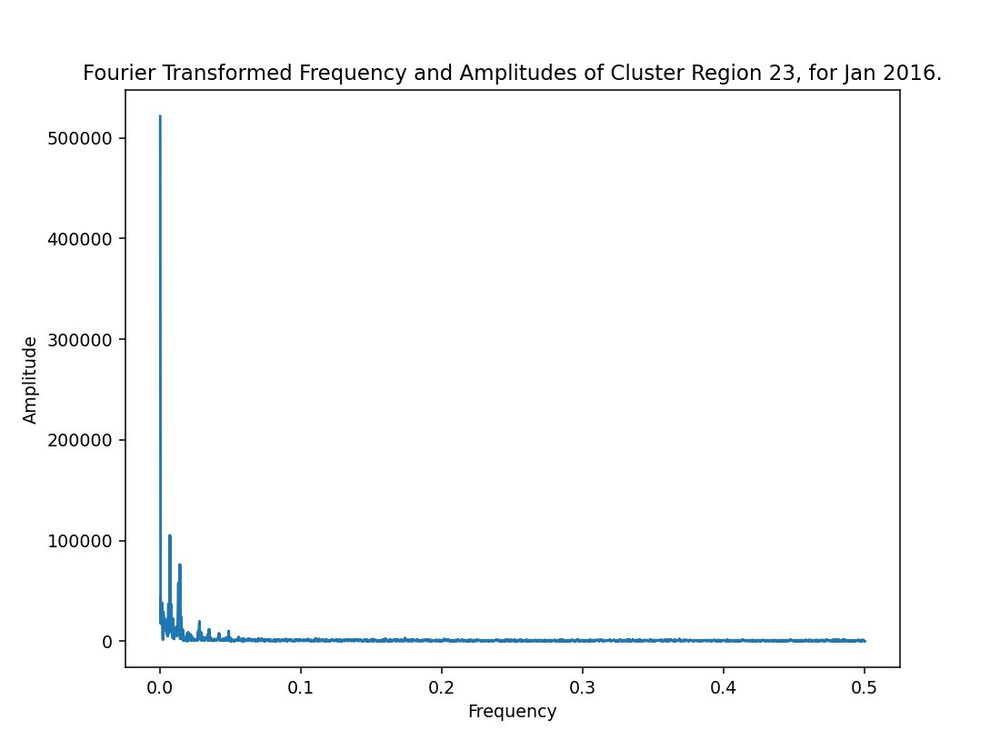

<IPython.core.display.Javascript object>


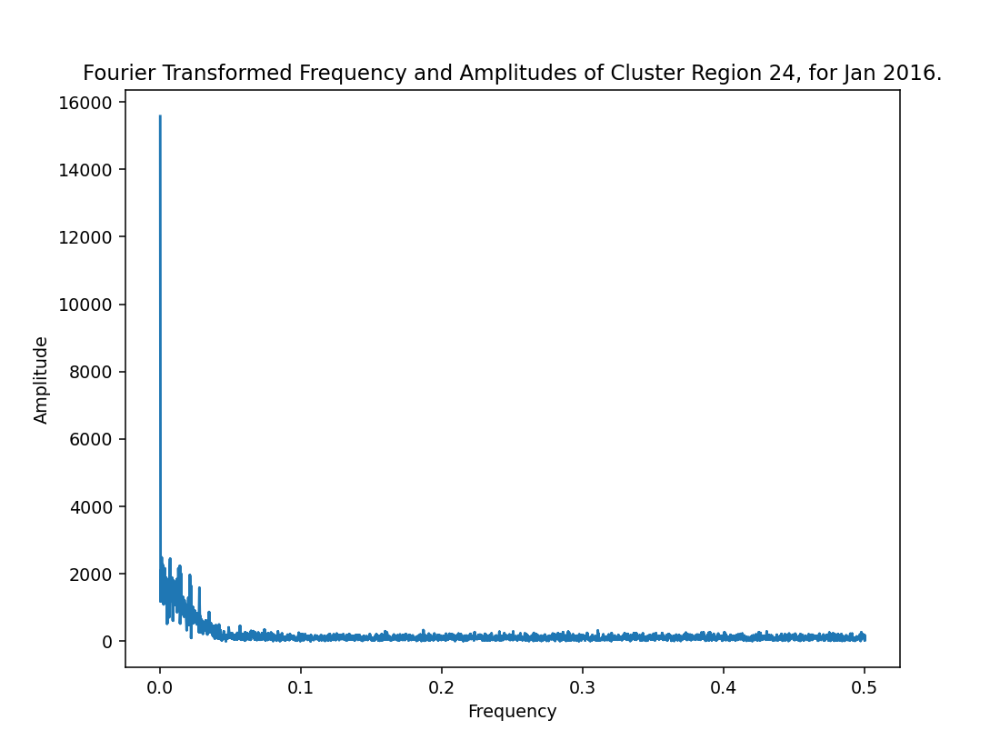

<IPython.core.display.Javascript object>


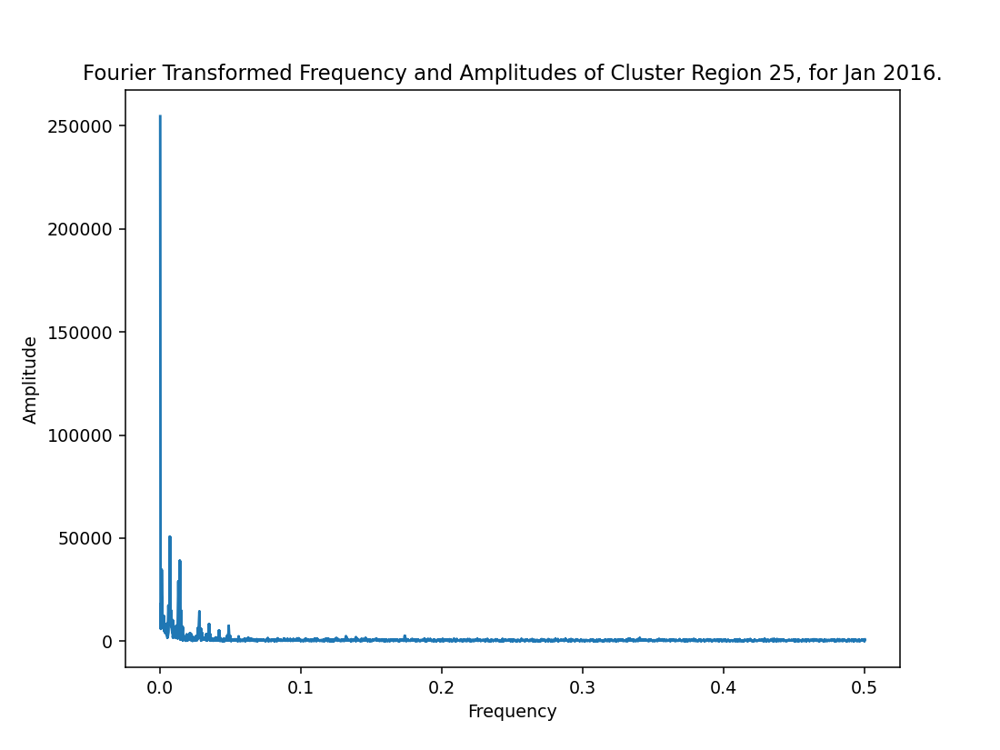

<IPython.core.display.Javascript object>


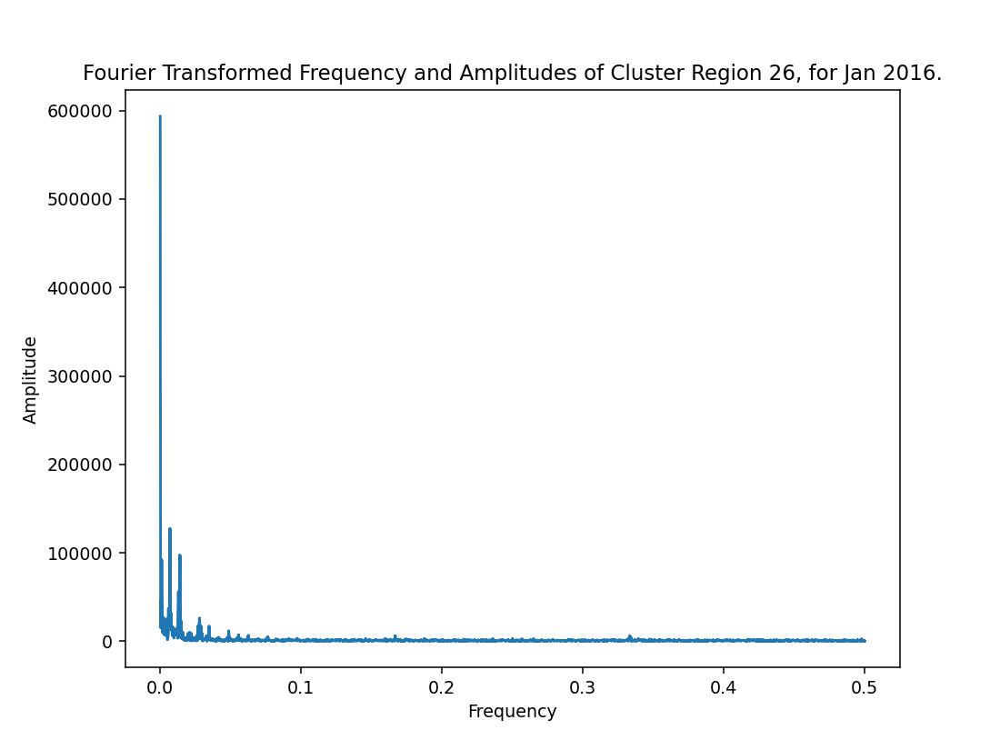

<IPython.core.display.Javascript object>


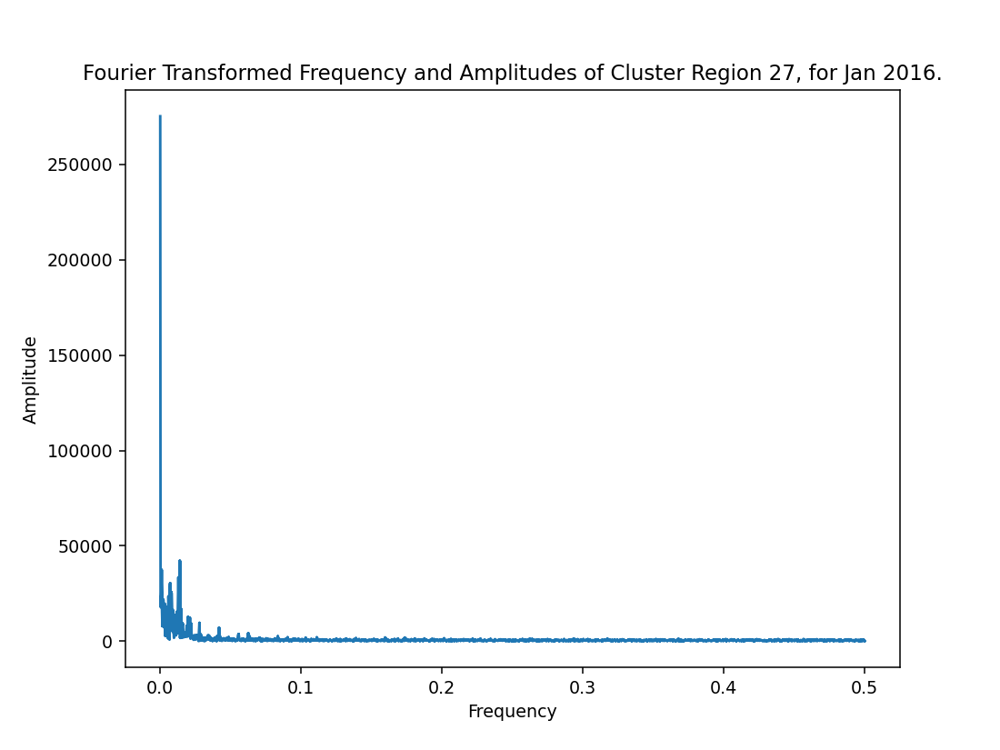

<IPython.core.display.Javascript object>


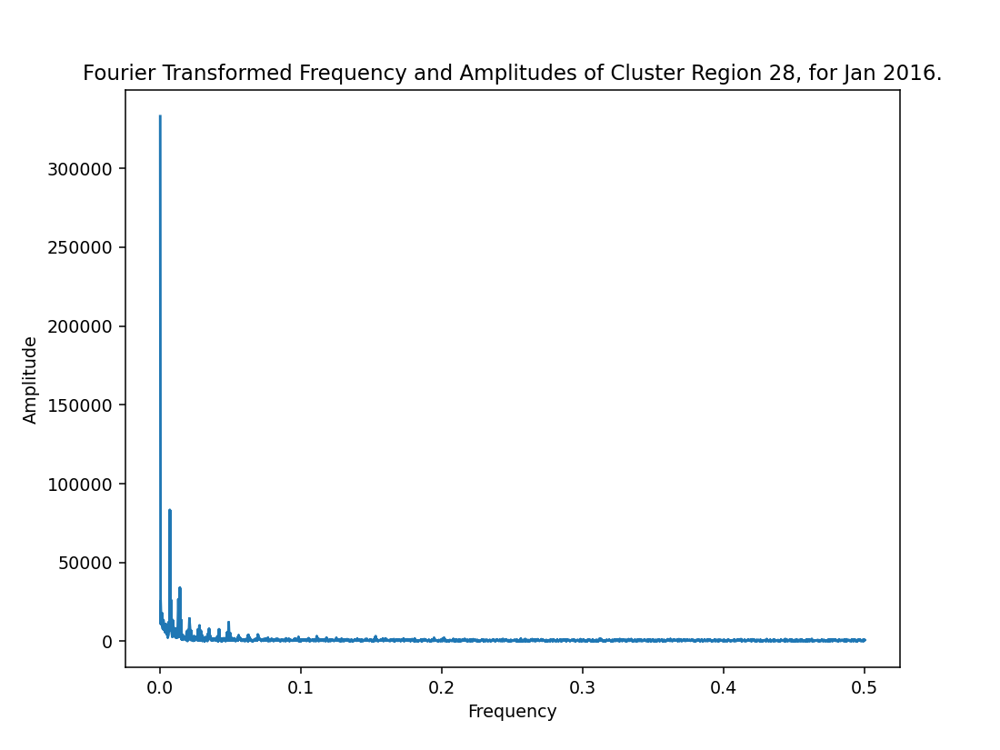

<IPython.core.display.Javascript object>


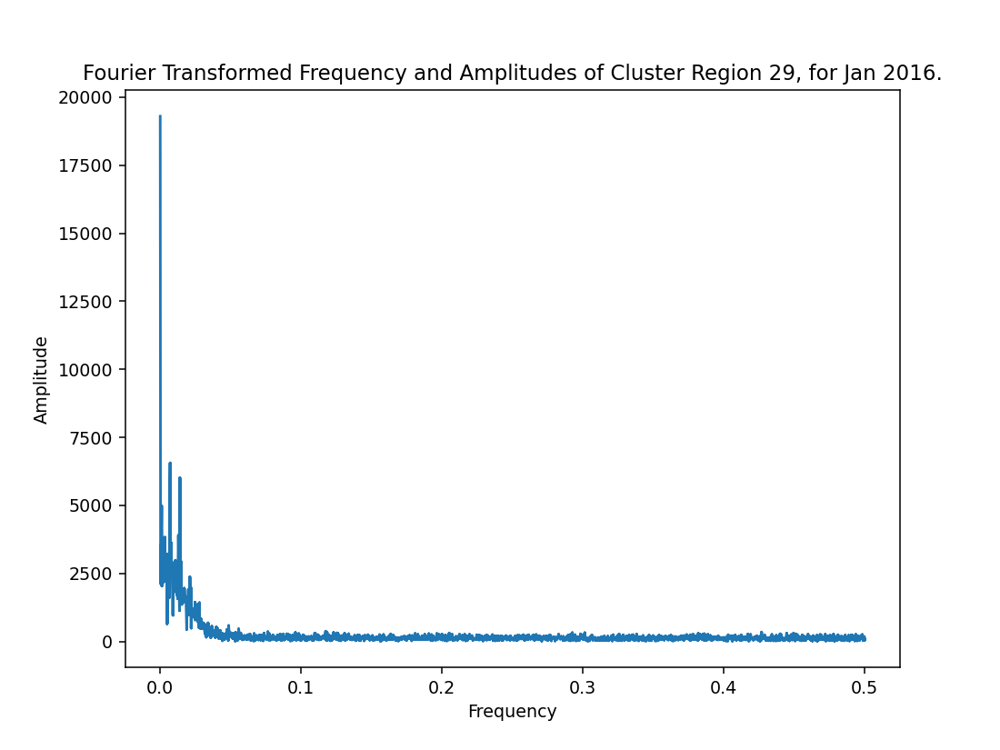

<IPython.core.display.Javascript object>


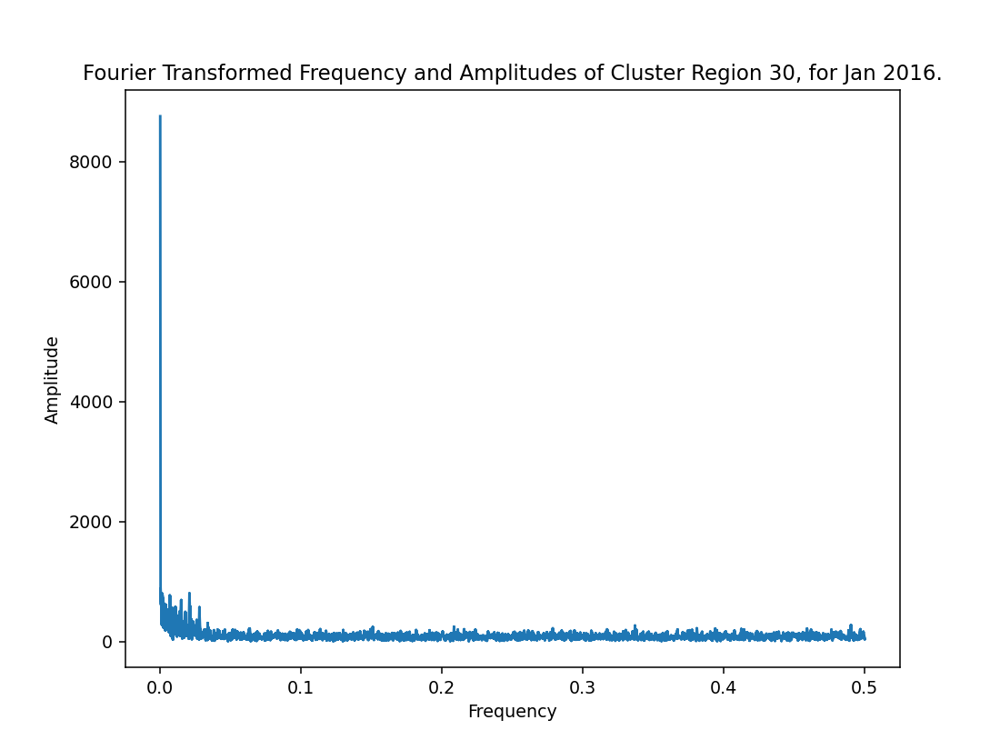

In [52]:
for i in range(30):
    Y  = np.abs(np.fft.fft(regionWisePickup_Jan_2016[i][0:4096]))
    # read more about the fftfreq: https://docs.scipy.org/doc/numpy/reference/generated/numpy.fft.fftfreq.html  
    freq = np.abs(np.fft.fftfreq(4096, 1))
    n = len(freq)
    plt.figure(figsize = (8, 6))
    plt.plot(freq[:], Y[:])
    plt.xlabel("Frequency")
    plt.ylabel("Amplitude")
    plt.title("Fourier Transformed Frequency and Amplitudes of Cluster Region "+str(i+1)+", for Jan 2016.")
    plt.show()
#Here, we are concern only about positive frequencies and ampllitudes. "np.fft.fftfreq(n, 1)" returns the frequency of sine 
#in a symmetric form, means there will be equal number of positive and negative sine wave frequencies. But we are concern only
#about positive ones.

Here, there is one peak at a frequency of 1/144 which is equivalent to 24 hrs. This peak is capturing full 24hrs pickups and since during hush hours the pickups are high so therefore peak of wave is also high at 1/144. Another peak is at frequency of 1/72 which is equivalent to 12 hrs. Now this peak is capturing information of the hush hours, so therefore this peak is the highest beside DC componet which we are noth considering, and so on. If we keep on going than frequency of 1/36 is equivalent to 6 hrs, similarly frequency of 1/18 is equivalent to 3 hrs and so on.<br>

Frequency means how many oscillations does wave completes in 1 Sec.<br>

Now if we see in the above plot, the first peak is a DC component, which captures the amplitude of wave which comes before the part of the wave shown in the above plot. Since, the wave which we have Fourier transformed is a repeating wave, so therefore, DC componets is capturing the information of the previous part of the wave, hence, we will not consider it's amplitude and frequency. We will start taking frequency and amplitudes from the second peak onwards.

In [70]:
amplitude_lists = []
frequency_lists = []
for i in range(30):
    amplitude_temp  = np.abs(np.fft.fft(regionWisePickup_Jan_2016[i][0:4096]))
    freq = np.abs(np.fft.fftfreq(4096, 1))
    amplitude_indices = np.argsort(-amplitude_temp)[1:]        #it will return an array of indices for which corresponding amplitude values are sorted in reverse order.
    amplitude_val = []
    frequency_val = []
    for k in range(0, 10, 2):   #taking top five amplitudes and frequencies
        amplitude_val.append(amplitude_temp[amplitude_indices[k]])
        frequency_val.append(freq[amplitude_indices[k]])
    for k in range(4459):    #those top 5 frequencies and amplitudes are same for all the points in one cluster
        amplitude_lists.append(amplitude_val)
        frequency_lists.append(frequency_val) 

<b>Now we have built our all the features. We have finally now following 19 features in our data:</b>
1. <b>f_t_1:</b> Number of pickups that are happened previous t-1st 10min interval
2. <b>f_t_2:</b> Number of pickups that are happened previous t-2nd 10min interval
3. <b>f_t_3:</b> Number of pickups that are happened previous t-3rd 10min interval
4. <b>f_t_4:</b> Number of pickups that are happened previous t-4th 10min interval
5. <b>f_t_5:</b> Number of pickups that are happened previous t-5th 10min interval 
6. <b>Freq1:</b> Fourier Frequency corresponding to 1st highest amplitude
7. <b>Freq2:</b> Fourier Frequency corresponding to 2nd highest amplitude
8. <b>Freq3:</b> Fourier Frequency corresponding to 3rd highest amplitude
9. <b>Freq4:</b> Fourier Frequency corresponding to 4th highest amplitude
10. <b>Freq5:</b> Fourier Frequency corresponding to 5th highest amplitude
11. <b>Amp1:</b>  Amplitude corresponding to 1st highest fourier transformed wave.
12. <b>Amp2:</b>  Amplitude corresponding to 2nd highest fourier transformed wave.
13. <b>Amp3:</b>  Amplitude corresponding to 3rd highest fourier transformed wave.
14. <b>Amp4:</b>  Amplitude corresponding to 4th highest fourier transformed wave.
15. <b>Amp5:</b>  Amplitude corresponding to 5th highest fourier transformed wave.
16. <b>Latitude:</b> Latitude of Cluster center.
17. <b>Longitude:</b> Longitude of Cluster Center.
18. <b>WeekDay:</b> Day of week of pickup.
19. <b>WeightedAvg:</b>: Weighted Moving Average Prediction values.

## Data Preparation for regression models
Before we start predictions using the tree based regression models we take Jan 2016 pickup data and split it such that for every region we have 80% data in train and 20% in test, ordered date-wise for every region.

In [71]:
print("size of total train data :" +str(int(133770*0.8)))
print("size of total test data :" +str(int(133770*0.2)))

size of total train data :107016
size of total test data :26754


In [72]:
print("size of train data for one cluster:" +str(int(4459*0.8)))
print("size of total test data for one cluster:" +str(int(4459*0.2)))

size of train data for one cluster:3567
size of total test data for one cluster:891


In [73]:
train_previousFive_pickups  = [feat[i*4459:(4459*i+3567)] for i in range(30)]
test_previousFive_pickups  = [feat[(i*4459)+3567:(4459*(i+1))] for i in range(30)]

train_fourier_frequencies = [frequency_lists[i*4459:(4459*i+3567)] for i in range(30)]
test_fourier_frequencies = [frequency_lists[(i*4459)+3567:(4459*(i+1))] for i in range(30)]

train_fourier_amplitudes = [amplitude_lists[i*4459:(4459*i+3567)] for i in range(30)]
test_fourier_amplitudes = [amplitude_lists[(i*4459)+3567:(4459*(i+1))] for i in range(30)]

In [76]:
print("Train Data: Total number of clusters = {}. Number of points in each cluster = {}. Total number of training points = {}"\
      .format(len(train_previousFive_pickups), len(train_previousFive_pickups[0]), len(train_previousFive_pickups)\
              *len(train_previousFive_pickups[0])))
print("Test Data: Total number of clusters = {}. Number of points in each cluster = {}. Total number of test points = {}"\
      .format(len(test_previousFive_pickups), len(test_previousFive_pickups[0]), len(test_previousFive_pickups)\
              *len(test_previousFive_pickups[0])))

Train Data: Total number of clusters = 30. Number of points in each cluster = 3567. Total number of training points = 107010
Test Data: Total number of clusters = 30. Number of points in each cluster = 892. Total number of test points = 26760


In [77]:
#taking 80% data as train data from each cluster
train_latitude = [i[:3567] for i in lat]
train_longitude = [i[:3567] for i in lon]
train_weekDay = [i[:3567] for i in day_of_week]
train_weighted_avg = [i[:3567] for i in predicted_pickup_values_list]
train_TruePickups = [i[:3567] for i in TruePickups]

#taking 20% data as test data from each cluster
test_latitude = [i[3567:] for i in lat]
test_longitude = [i[3567:] for i in lon]
test_weekDay = [i[3567:] for i in day_of_week]
test_weighted_avg = [i[3567:] for i in predicted_pickup_values_list]
test_TruePickups = [i[3567:] for i in TruePickups]

#preparating data in proper format
train_pickups = []
test_pickups = []
train_freq = []
test_freq = []
train_amp = []
test_amp = []
for i in range(30):
    train_pickups.extend(train_previousFive_pickups[i])
    test_pickups.extend(test_previousFive_pickups[i])
    train_freq.extend(train_fourier_frequencies[i])
    test_freq.extend(test_fourier_frequencies[i])
    train_amp.extend(train_fourier_amplitudes[i])
    test_amp.extend(test_fourier_amplitudes[i])
    
    
train_prevPickups_freq_amp = np.hstack((train_pickups, train_freq, train_amp))
test_prevPickups_freq_amp = np.hstack((test_pickups, test_freq, test_amp))

In [81]:
print("Number of data points in train data = {}. Number of columns till now = {}".format(len(train_prevPickups_freq_amp), len(train_prevPickups_freq_amp[0])))
print("Number of data points in test data = {}. Number of columns till now = {}".format(len(test_prevPickups_freq_amp), len(test_prevPickups_freq_amp[0])))

Number of data points in train data = 107010. Number of columns till now = 15
Number of data points in test data = 26760. Number of columns till now = 15


In [82]:
# Flattening lists of list 
# a  = [[1,2,3,4],[4,6,7,8]]
# print(sum(a,[]))
# [1, 2, 3, 4, 4, 6, 7, 8]

train_flat_lat = sum(train_latitude, [])
train_flat_lon = sum(train_longitude, [])
train_flat_weekDay = sum(train_weekDay, [])
train_weighted_avg_flat = sum(train_weighted_avg, [])
train_TruePickups_flat = sum(train_TruePickups, [])

test_flat_lat = sum(test_latitude, [])
test_flat_lon = sum(test_longitude, [])
test_flat_weekDay = sum(test_weekDay, [])
test_weighted_avg_flat = sum(test_weighted_avg, [])
test_TruePickups_flat = sum(test_TruePickups, [])

In [83]:
#train dataframe
columns = ['ft_5','ft_4','ft_3','ft_2','ft_1', 'freq1', 'freq2','freq3','freq4','freq5', 'Amp1', 'Amp2', 'Amp3', 'Amp4', 'Amp5']
Train_data = pd.DataFrame(data = train_prevPickups_freq_amp, columns = columns)
Train_data["Latitude"] = train_flat_lat
Train_data["Longitude"] = train_flat_lon
Train_data["WeekDay"] = train_flat_weekDay
Train_data["WeightedAvg"] = train_weighted_avg_flat

#test dataframe
Test_data = pd.DataFrame(data = test_prevPickups_freq_amp, columns = columns)
Test_data["Latitude"] = test_flat_lat
Test_data["Longitude"] = test_flat_lon
Test_data["WeekDay"] = test_flat_weekDay
Test_data["WeightedAvg"] = test_weighted_avg_flat

In [85]:
print("Shape of train data = "+str(Train_data.shape))
print("Shape of test data = "+str(Test_data.shape))

Shape of train data = (107010, 19)
Shape of test data = (26760, 19)


In [86]:
Train_data.head()

,ft_5,ft_4,ft_3,ft_2,ft_1,freq1,freq2,freq3,freq4,freq5,Amp1,Amp2,Amp3,Amp4,Amp5,Latitude,Longitude,WeekDay,WeightedAvg
0,48.0,109.0,150.0,181.0,193.0,0.006836,0.00708,0.013916,0.000977,0.007812,110983.035745,94843.781607,47586.716193,39843.730794,35960.819014,40.763446,-73.982804,5,189
1,109.0,150.0,181.0,193.0,193.0,0.006836,0.00708,0.013916,0.000977,0.007812,110983.035745,94843.781607,47586.716193,39843.730794,35960.819014,40.763446,-73.982804,5,193
2,150.0,181.0,193.0,193.0,187.0,0.006836,0.00708,0.013916,0.000977,0.007812,110983.035745,94843.781607,47586.716193,39843.730794,35960.819014,40.763446,-73.982804,5,189
3,181.0,193.0,193.0,187.0,191.0,0.006836,0.00708,0.013916,0.000977,0.007812,110983.035745,94843.781607,47586.716193,39843.730794,35960.819014,40.763446,-73.982804,5,189
4,193.0,193.0,187.0,191.0,207.0,0.006836,0.00708,0.013916,0.000977,0.007812,110983.035745,94843.781607,47586.716193,39843.730794,35960.819014,40.763446,-73.982804,5,201


In [87]:
Test_data.head()

,ft_5,ft_4,ft_3,ft_2,ft_1,freq1,freq2,freq3,freq4,freq5,Amp1,Amp2,Amp3,Amp4,Amp5,Latitude,Longitude,WeekDay,WeightedAvg
0,154.0,159.0,162.0,146.0,174.0,0.006836,0.00708,0.013916,0.000977,0.007812,110983.035745,94843.781607,47586.716193,39843.730794,35960.819014,40.763446,-73.982804,1,164
1,159.0,162.0,146.0,174.0,143.0,0.006836,0.00708,0.013916,0.000977,0.007812,110983.035745,94843.781607,47586.716193,39843.730794,35960.819014,40.763446,-73.982804,1,153
2,162.0,146.0,174.0,143.0,128.0,0.006836,0.00708,0.013916,0.000977,0.007812,110983.035745,94843.781607,47586.716193,39843.730794,35960.819014,40.763446,-73.982804,1,133
3,146.0,174.0,143.0,128.0,107.0,0.006836,0.00708,0.013916,0.000977,0.007812,110983.035745,94843.781607,47586.716193,39843.730794,35960.819014,40.763446,-73.982804,1,114
4,174.0,143.0,128.0,107.0,90.0,0.006836,0.00708,0.013916,0.000977,0.007812,110983.035745,94843.781607,47586.716193,39843.730794,35960.819014,40.763446,-73.982804,1,95


## Linear Regression

In [93]:
from sklearn.model_selection import GridSearchCV
def linear_regression(train_data, train_true, test_data, test_true):
    
    #standardizing the data
    train_std = StandardScaler().fit_transform(train_data)
    test_std = StandardScaler().fit_transform(test_data)
    
    #hyper-paramater tuning
    clf = SGDRegressor(loss = "squared_loss", penalty = "l2")
    values = [10**-14, 10**-12, 10**-10, 10**-8, 10**-6, 10**-4, 10**-2, 10**0, 10**2, 10**4, 10**6]
    hyper_parameter = {"alpha": values}
    best_parameter = GridSearchCV(clf, hyper_parameter, scoring = "neg_mean_absolute_error", cv = 3)
    best_parameter.fit(train_std, train_true)
    alpha = best_parameter.best_params_["alpha"]
    
    #applying linear regression with best hyper-parameter
    clf = SGDRegressor(loss = "squared_loss", penalty = "l2", alpha = alpha)
    clf.fit(train_std, train_true)
    train_pred = clf.predict(train_std)
    train_MAPE = mean_absolute_error(train_true, train_pred)/ (sum(train_true)/len(train_true))
    train_MSE = mean_squared_error(train_true, train_pred)
    test_pred = clf.predict(test_std)
    test_MAPE = mean_absolute_error(test_true, test_pred)/ (sum(test_true)/len(test_true))
    test_MSE = mean_squared_error(test_true, test_pred)
    
    return train_MAPE, train_MSE, test_MAPE, test_MSE

## Random Forest Regressor

In [94]:
from sklearn.model_selection import RandomizedSearchCV
def randomForest(train_data, train_true, test_data, test_true):
    
    #hyper-paramater tuning
    values = [10, 40, 80, 150, 600, 800]
    clf = RandomForestRegressor(n_jobs = -1)
    hyper_parameter = {"n_estimators": values}
    best_parameter = RandomizedSearchCV(clf, hyper_parameter, scoring = "neg_mean_absolute_error", cv = 3)
    best_parameter.fit(train_data, train_true)
    estimators = best_parameter.best_params_["n_estimators"]
    
    #applying random forest with best hyper-parameter
    clf = RandomForestRegressor(n_estimators = estimators, n_jobs = -1)
    clf.fit(train_data, train_true)
    train_pred = clf.predict(train_data)
    train_MAPE = mean_absolute_error(train_true, train_pred)/ (sum(train_true)/len(train_true))
    train_MSE = mean_squared_error(train_true, train_pred)
    test_pred = clf.predict(test_data)
    test_MAPE = mean_absolute_error(test_true, test_pred)/ (sum(test_true)/len(test_true))
    test_MSE = mean_squared_error(test_true, test_pred)
    
    return train_MAPE, train_MSE, test_MAPE, test_MSE

## XGBoost Regressor

In [95]:
def xgboost(train_data, train_true, test_data, test_true):
    #hyper-parameter tuning
    hyper_parameter = {"max_depth":[1, 2, 3, 4], "n_estimators":[50, 100, 300, 600, 850]}
    clf = xgb.XGBRegressor()
    best_parameter = RandomizedSearchCV(clf, hyper_parameter, scoring = "neg_mean_absolute_error", cv = 3)
    best_parameter.fit(train_data, train_true)
    estimators = best_parameter.best_params_["n_estimators"]
    depth = best_parameter.best_params_["max_depth"]
    
    #applying xgboost regressor with best hyper-parameter
    clf = xgb.XGBRegressor(max_depth = depth, n_estimators = estimators)
    clf.fit(train_data, train_true)
    train_pred = clf.predict(train_data)
    train_MAPE = mean_absolute_error(train_true, train_pred)/ (sum(train_true)/len(train_true))
    train_MSE = mean_squared_error(train_true, train_pred)
    test_pred = clf.predict(test_data)
    test_MAPE = mean_absolute_error(test_true, test_pred)/ (sum(test_true)/len(test_true))
    test_MSE = mean_squared_error(test_true, test_pred)
    
    return train_MAPE, train_MSE, test_MAPE, test_MSE

In [96]:
trainMAPE_lr, trainMSE_lr, testMAPE_lr, testMSE_lr = linear_regression(Train_data, train_TruePickups_flat, Test_data, \
                                                                       test_TruePickups_flat)
trainMAPE_rf, trainMSE_rf, testMAPE_rf, testMSE_rf = randomForest(Train_data, train_TruePickups_flat, Test_data, test_TruePickups_flat)
trainMAPE_xgb, trainMSE_xgb, testMAPE_xgb, testMSE_xgb = xgboost(Train_data, train_TruePickups_flat, Test_data, test_TruePickups_flat)

# 6. Model Comparison

In [97]:
error_table_regressions = pd.DataFrame(columns = ["Model", "TrainMAPE(%)", "TrainMSE", "TestMAPE(%)", "TestMSE"])

error_table_regressions = error_table_regressions.append(pd.DataFrame([["Linear Regression", trainMAPE_lr*100, trainMSE_lr, testMAPE_lr*100, testMSE_lr ]], columns = ["Model", "TrainMAPE(%)", "TrainMSE", "TestMAPE(%)", "TestMSE"]))
error_table_regressions = error_table_regressions.append(pd.DataFrame([["Random Forest Regression", trainMAPE_rf*100, trainMSE_rf, testMAPE_rf*100, testMSE_rf]], columns = ["Model", "TrainMAPE(%)", "TrainMSE", "TestMAPE(%)", "TestMSE"]))
error_table_regressions = error_table_regressions.append(pd.DataFrame([["XGBoost Regressor", trainMAPE_xgb*100, trainMSE_xgb, testMAPE_xgb*100, testMSE_xgb]], columns = ["Model", "TrainMAPE(%)", "TrainMSE", "TestMAPE(%)", "TestMSE"]))
error_table_regressions.reset_index(drop = True, inplace = True)

In [98]:
error_table_regressions

,Model,TrainMAPE(%),TrainMSE,TestMAPE(%),TestMSE
0,Linear Regression,12.452490,213.694875,14.434615,287.482516
1,Random Forest Regression,4.503479,28.317783,11.555505,211.044559
2,XGBoost Regressor,11.934585,192.820898,11.576831,210.726409


### From the above result we have following observations:
* <b>1. The difference between train error and test error of random forest regressor is high, which clearly shows that random forest regressor is overfitting. Therefore, we are discarding random forest regressor.</b>
* <b>2. The best model with lowest train and test error is XGBoost Regressor.</b>

In [99]:
Final_Table = pd.DataFrame(columns = ["Model", "Mean_Absolute_Per_Error(%)"])

Final_Table = Final_Table.append(pd.DataFrame([["Simple Moving Average Ratios", mape1*100]], columns = ["Model", "Mean_Absolute_Per_Error(%)"]))
Final_Table = Final_Table.append(pd.DataFrame([["Simple Moving Average Predictions", mape2*100]], columns = ["Model", "Mean_Absolute_Per_Error(%)"]))
Final_Table = Final_Table.append(pd.DataFrame([["Weighted Moving Average Ratios", mape3*100]], columns = ["Model", "Mean_Absolute_Per_Error(%)"]))
Final_Table = Final_Table.append(pd.DataFrame([["Weighted Moving Average Predictions", mape4*100]], columns = ["Model", "Mean_Absolute_Per_Error(%)"]))
Final_Table = Final_Table.append(pd.DataFrame([["Exponential Weighted Moving Average Ratios", mape5*100]], columns = ["Model", "Mean_Absolute_Per_Error(%)"]))
Final_Table = Final_Table.append(pd.DataFrame([["Exponential Weighted Moving Average Predictions", mape6*100]], columns = ["Model", "Mean_Absolute_Per_Error(%)"]))
Final_Table = Final_Table.append(pd.DataFrame([["Linear Regression", testMAPE_lr*100]], columns = ["Model", "Mean_Absolute_Per_Error(%)"]))
Final_Table = Final_Table.append(pd.DataFrame([["XGBoost Regressor", testMAPE_xgb*100]], columns = ["Model", "Mean_Absolute_Per_Error(%)"]))

Final_Table.reset_index(drop = True, inplace = True)

<IPython.core.display.Javascript object>


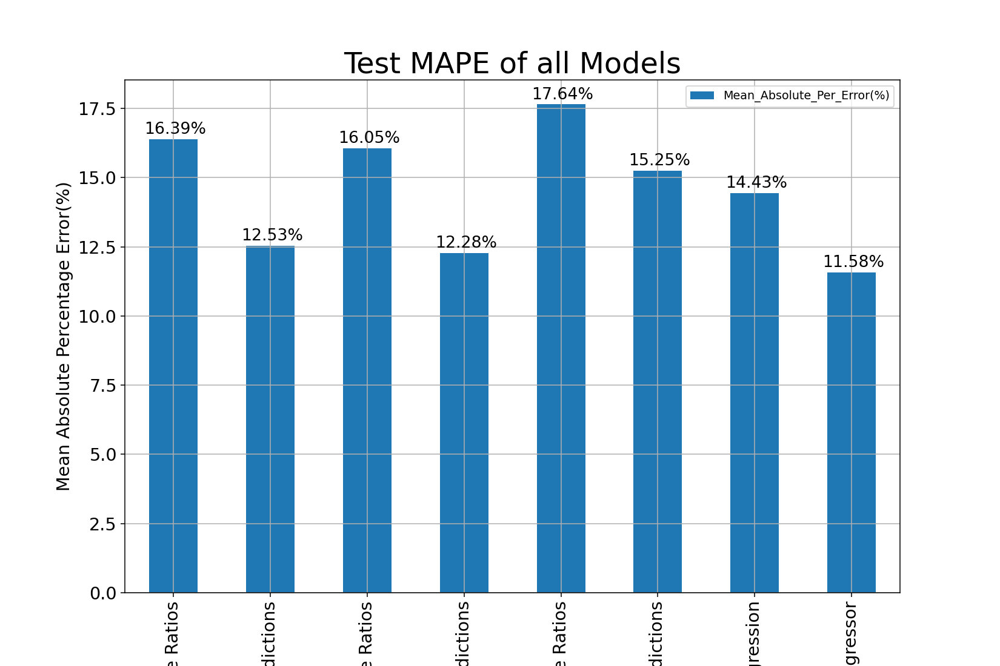

In [100]:
ax = Final_Table.plot(x = "Model", kind = "bar", figsize = (12, 8), grid = True, fontsize = 15)
ax.set_title("Test MAPE of all Models", fontsize = 25)
ax.set_ylabel("Mean Absolute Percentage Error(%)", fontsize = 15)

for i in ax.patches:   #ax.patches is an array which gives x position, y position, width of a bar graphs.
    ax.text(i.get_x()-.05, i.get_height()+0.19, str(round(i.get_height(), 2))+'%', fontsize=14, color='black')
#     ax.text(x, y, annotate_text, font_size, color)
plt.show()

In [101]:
Final_Table.style.highlight_min(axis=0)

,Model,Mean_Absolute_Per_Error(%)
0,Simple Moving Average Ratios,16.390431
1,Simple Moving Average Predictions,12.531997
2,Weighted Moving Average Ratios,16.053566
3,Weighted Moving Average Predictions,12.276680
4,Exponential Weighted Moving Average Ratios,17.644217
5,Exponential Weighted Moving Average Predictions,15.251032
6,Linear Regression,14.434615
7,XGBoost Regressor,11.576831


# So, far our best model is XGBoost Regressor with Test MAPE: 11.576%